In [ ]:
#импортируем необходимые библиотеки для обработки данных
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer


import scipy

In [ ]:
#загружаем имеющиеся данные
excel_reader=pd.ExcelFile('/content/drive/MyDrive/data_glaucoma.xlsx')

В таблице с данными 4 листа. Выделим их для удобства работы в отдельные таблицы.

In [ ]:
print(excel_reader.sheet_names)

['Здоровые', ' I стадия ПОУГ', ' II стадия ПОУГ', ' III стадия ПОУГ']


In [ ]:
data_healthy=excel_reader.parse('Здоровые')

In [ ]:
data_healthy.head(11)

,Unnamed: 0,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z\nбаз.\n(отн.)),Z\nбаз.\n(мОм),УОК\n(уд.объем)\nмкл
0,уланкина,25,0,10,12,0.0162,9.7,9.4,9.3,11.3,...,1.75,0.0162,56.300000,46.03000,49.65,0.27,0.25,979.0,39.16,1.157570
1,степанова,26,0,12,15,0.0162,18.5,19.9,12.8,11.6,...,1.85,0.0162,50.960000,44.21000,NaN,NaN,NaN,NaN,NaN,NaN
2,кудасов,32,0,10,12,0.0162,14.3,12.0,8.3,9.2,...,NaN,NaN,53.580000,47.40000,102.33,0.13,0.14,1060.0,42.40,2.203474
3,NaN,32,0,10,12,0.0162,17.6,13.9,7.6,7.6,...,NaN,NaN,56.297266,45.46207,58.43,0.20,0.21,1063.0,42.52,1.254623
4,гладих,68,0,10,14,0.0138,20.1,17.2,8.8,7.9,...,1.75,0.0138,48.680000,45.88000,20.97,0.13,0.14,725.0,29.00,0.660193
5,мыздриков,59,0,12,14,0.0161,8.5,8.1,9.1,11.4,...,1.85,0.0161,53.560000,48.42000,35.50,0.52,0.42,917.0,36.68,0.883629
6,Савинова,66,0,15,23,0.0076,NaN,NaN,NaN,NaN,...,1.30,0.0076,48.710000,NaN,49.88,0.29,0.30,910.0,36.40,1.251111
7,NaN,66,0,12,16,0.0140,NaN,NaN,NaN,NaN,...,1.70,0.0140,NaN,NaN,53.23,0.32,0.33,822.0,32.88,1.478071
8,Мациева,68,0,18,28,0.0052,20.4,20.0,11.3,9.9,...,1.10,0.0052,51.320000,43.70000,NaN,NaN,NaN,NaN,NaN,NaN
9,Булат,51,0,12,19,0.0031,17.8,16.5,10.0,9.6,...,0.60,0.0031,NaN,NaN,183.50,0.33,0.40,1210.0,48.40,3.461477


In [ ]:
data_1_stage=excel_reader.parse(' I стадия ПОУГ')

In [ ]:
data_1_stage

,Unnamed: 0,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z\nбаз.\n(отн.)),Z\nбаз.\n(мОм),УОК\n(уд.объем)\nмкл
0,горнева,84,1,13,27,0.0007,16.1,14.7,9.5,9.6,...,0.45,0.0007,NaN,NaN,30.27,0.27,0.31,NaN,NaN,NaN
1,фокина,64,1,20,30,0.0053,20.0,20.0,11.0,10.0,...,0.55,0.0053,46.73000,34.530000,44.00,0.11,0.20,982.0,39.28,1.022709
2,петрова,56,1,18,21,0.0148,23.7,23.1,11.7,9.3,...,2.00,0.0148,54.63000,42.690000,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,56,1,21,18,0.0268,26.8,25.6,11.8,8.5,...,2.10,0.0268,53.75000,41.320000,NaN,NaN,NaN,NaN,NaN,NaN
4,ефременкова,65,1,7,9,0.0167,17.7,14.4,8.0,8.0,...,1.95,0.0167,50.50000,47.950000,76.00,0.05,0.09,1077.0,43.08,1.610678
5,NaN,65,1,13,24,0.0040,21.5,17.8,8.3,7.1,...,1.00,0.0040,45.15000,34.910000,71.00,0.04,0.07,972.0,38.88,1.667258
6,набатчикова,72,1,11,12,0.0032,21.0,20.0,11.7,9.3,...,NaN,NaN,51.60000,46.270000,44.47,0.44,0.38,1060.0,42.40,0.957573
7,огулева,65,1,8,19,0.0038,12.2,13.5,11.5,12.3,...,0.95,0.0038,50.21000,35.930000,66.77,0.23,0.26,1193.0,47.72,1.277473
8,калядова,73,1,14,17,0.0167,21.2,19.1,9.8,8.4,...,1.85,0.0167,43.23000,35.580000,66.97,0.34,0.32,900.0,36.00,1.698434
9,казакова,66,1,13,17,0.0147,12.4,12.3,10.1,11.2,...,1.90,0.0147,51.05000,48.600000,60.47,0.62,0.58,878.0,35.12,1.572013


In [ ]:
data_2_stage=excel_reader.parse(' II стадия ПОУГ')

In [ ]:
data_2_stage

,Unnamed: 0,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z\nбаз.\n(отн.)),Z\nбаз.\n(мОм),УОК\n(уд.объем)\nмкл
0,горнева,84,2,13,17,0.0132,16.2,14.1,8.8,9.0,...,1.65,0.0132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,64,2,19,24,0.0127,15.7,15.7,10.0,10.0,...,1.65,0.0127,44.11,32.11,NaN,NaN,NaN,NaN,NaN,NaN
2,близнюк,70,2,11,11,0.0214,19.8,18.0,9.9,8.9,...,2.40,0.0343,51.47,47.28,43.37,0.11,0.26,960.0,38.40,1.031167
3,NaN,68,2,11,12,0.0190,17.1,14.0,8.1,8.2,...,0.70,0.0190,50.96,41.77,33.20,0.71,0.75,925.0,37.00,0.819232
4,митина,80,2,17,21,0.0146,23.5,21.0,9.9,7.9,...,1.75,0.0146,44.14,29.78,27.39,0.16,0.19,1080.0,43.20,0.578867
5,якубова,71,2,15,20,0.0133,26.5,25.7,12.1,8.8,...,1.70,0.0133,47.36,36.07,NaN,NaN,NaN,NaN,NaN,NaN
6,емельянова,77,2,16,17,0.0199,20.2,18.0,9.6,8.6,...,2.00,0.0199,NaN,NaN,29.34,0.26,0.28,911.0,36.44,0.735110
7,Мациева,68,2,17,12,0.0325,22.6,19.4,9.0,7.4,...,2.30,0.0325,NaN,NaN,44.28,0.08,0.09,878.0,35.12,1.151129
8,Попова,80,2,14,14,0.0204,24.3,19.9,8.1,6.1,...,NaN,0.0204,49.31,NaN,11.36,0.12,0.27,766.0,30.64,0.338501
9,NaN,72,2,18,25,0.0092,20.7,19.6,10.7,9.3,...,1.45,0.0092,NaN,NaN,58.26,0.18,0.23,947.0,37.88,1.404207


In [ ]:
data_3_stage=excel_reader.parse(' III стадия ПОУГ')

In [ ]:
data_3_stage

,Unnamed: 0,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z\nбаз.\n(отн.)),Z\nбаз.\n(мОм),УОК\n(уд.объем)\nмкл
0,клычникова,68,3,13,7,0.0365,24.9,19.5,7.3,5.3,...,2.40,0.0365,49.90,43.40,NaN,NaN,NaN,NaN,NaN,NaN
1,кадушкин,68,3,15,11,0.0306,20.7,16.5,8.0,7.1,...,3.55,0.0306,49.31,39.83,15.10,0.04,0.08,917.0,36.68,0.375853
2,якубова,71,3,22,21,0.0227,26.0,23.8,10.6,7.7,...,2.20,0.0227,45.52,43.11,25.43,0.27,0.26,811.0,32.44,0.715709
3,певзнер,74,3,22,23,0.0205,20.9,18.9,9.9,8.6,...,1.95,0.0205,42.12,26.86,15.48,0.11,0.13,822.0,32.88,0.429843
4,Хохлова,64,3,14,14,0.0201,19.3,18.3,10.5,9.6,...,NaN,NaN,NaN,NaN,16.72,0.07,0.09,888.0,35.52,0.429768
5,NaN,64,3,13,10,0.0315,19.6,18.6,10.6,9.5,...,NaN,NaN,NaN,NaN,38.82,0.08,0.09,872.0,34.88,1.016131
6,Соловьева Е.,72,3,16,12,0.0306,20.0,18.0,8.7,7.6,...,NaN,NaN,NaN,NaN,49.61,0.09,0.14,877.0,35.08,1.291161
7,Зайченко,76,3,17,16,0.0246,23.1,17.1,6.5,5.1,...,NaN,NaN,NaN,NaN,57.32,0.75,0.66,410.0,16.40,3.191046
8,Вакалова,80,3,16,11,0.0347,21.0,17.8,8.7,7.6,...,NaN,NaN,28.82,38.87,26.61,0.15,0.16,483.0,19.32,1.257502
9,Колесова,67,3,18,17,0.0227,19.0,20.5,8.5,7.7,...,2.20,0.0227,42.70,40.10,25.43,0.27,0.26,811.0,32.44,0.715709


# Задача 0: Техническая предобработка данных


Добавим название первого столбца

In [ ]:
data_healthy=data_healthy.rename(columns={'Unnamed: 0':'Фамилия'})
data_1_stage=data_1_stage.rename(columns={'Unnamed: 0':'Фамилия'})
data_2_stage=data_2_stage.rename(columns={'Unnamed: 0':'Фамилия'})
data_3_stage=data_3_stage.rename(columns={'Unnamed: 0':'Фамилия'})

Уберем перенос на новую строку в названиях столбцов

In [ ]:
data_healthy=data_healthy.rename(columns={'Z\nбаз.\n(отн.))':'Z баз.(отн.))'})
data_1_stage=data_1_stage.rename(columns={'Z\nбаз.\n(отн.))':'Z баз.(отн.))'})
data_2_stage=data_2_stage.rename(columns={'Z\nбаз.\n(отн.))':'Z баз.(отн.))'})
data_3_stage=data_3_stage.rename(columns={'Z\nбаз.\n(отн.))':'Z баз.(отн.))'})

In [ ]:
data_healthy=data_healthy.rename(columns={'Z\nбаз.\n(мОм)':'Z баз.(мОм)'})
data_1_stage=data_1_stage.rename(columns={'Z\nбаз.\n(мОм)':'Z баз.(мОм)'})
data_2_stage=data_2_stage.rename(columns={'Z\nбаз.\n(мОм)':'Z баз.(мОм)'})
data_3_stage=data_3_stage.rename(columns={'Z\nбаз.\n(мОм)':'Z баз.(мОм)'})

In [ ]:
data_healthy=data_healthy.rename(columns={'УОК\n(уд.объем)\nмкл':'УОК (уд.объем) мкл'})
data_1_stage=data_1_stage.rename(columns={'УОК\n(уд.объем)\nмкл':'УОК (уд.объем) мкл'})
data_2_stage=data_2_stage.rename(columns={'УОК\n(уд.объем)\nмкл':'УОК (уд.объем) мкл'})
data_3_stage=data_3_stage.rename(columns={'УОК\n(уд.объем)\nмкл':'УОК (уд.объем) мкл'})

Заполним признак стадии в листе таблицы для 1й стадии

In [ ]:
data_1_stage['стадия']=1

In [ ]:
data_healthy

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,уланкина,25,0,10,12,0.0162,9.7,9.4,9.3,11.3,...,1.75,0.0162,56.300000,46.03000,49.65,0.27,0.25,979.0,39.16,1.157570
1,степанова,26,0,12,15,0.0162,18.5,19.9,12.8,11.6,...,1.85,0.0162,50.960000,44.21000,NaN,NaN,NaN,NaN,NaN,NaN
2,кудасов,32,0,10,12,0.0162,14.3,12.0,8.3,9.2,...,NaN,NaN,53.580000,47.40000,102.33,0.13,0.14,1060.0,42.40,2.203474
3,NaN,32,0,10,12,0.0162,17.6,13.9,7.6,7.6,...,NaN,NaN,56.297266,45.46207,58.43,0.20,0.21,1063.0,42.52,1.254623
4,гладих,68,0,10,14,0.0138,20.1,17.2,8.8,7.9,...,1.75,0.0138,48.680000,45.88000,20.97,0.13,0.14,725.0,29.00,0.660193
5,мыздриков,59,0,12,14,0.0161,8.5,8.1,9.1,11.4,...,1.85,0.0161,53.560000,48.42000,35.50,0.52,0.42,917.0,36.68,0.883629
6,Савинова,66,0,15,23,0.0076,NaN,NaN,NaN,NaN,...,1.30,0.0076,48.710000,NaN,49.88,0.29,0.30,910.0,36.40,1.251111
7,NaN,66,0,12,16,0.0140,NaN,NaN,NaN,NaN,...,1.70,0.0140,NaN,NaN,53.23,0.32,0.33,822.0,32.88,1.478071
8,Мациева,68,0,18,28,0.0052,20.4,20.0,11.3,9.9,...,1.10,0.0052,51.320000,43.70000,NaN,NaN,NaN,NaN,NaN,NaN
9,Булат,51,0,12,19,0.0031,17.8,16.5,10.0,9.6,...,0.60,0.0031,NaN,NaN,183.50,0.33,0.40,1210.0,48.40,3.461477


# Задача 1. Работа с пропущенными значениями

1. Проанализировать данные.

  Пропущенные значения дополнить тем или иным способом.

  Проанализировать, меняется ли взаимосвязь дополненных показателей с другими показателями.



---

Рассмотрим описательную статистику с пропущенными значениями

In [ ]:
describe_data_healthy=data_healthy.describe()
describe_data_healthy

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
count,11.000000,11.0,11.000000,11.000000,11.000000,9.000000,9.000000,9.000000,9.000000,11.000000,...,9.000000,9.000000,8.000000,7.000000,8.000000,8.000000,8.00000,8.000000,8.000000,8.000000
mean,49.454545,0.0,12.090909,16.727273,0.011409,16.100000,14.733333,9.566667,9.677778,542.181818,...,1.366667,0.010344,52.425908,45.871724,69.186250,0.273750,0.27375,960.750000,38.430000,1.543769
std,17.574775,0.0,2.467977,5.120369,0.005990,4.343961,4.257347,1.598437,1.508955,25.964661,...,0.555653,0.006151,3.019598,1.658312,51.755479,0.127048,0.10796,152.166967,6.086679,0.898572
min,25.000000,0.0,10.000000,12.000000,0.000900,8.500000,8.100000,7.600000,7.600000,507.000000,...,0.400000,0.000900,48.680000,43.700000,20.970000,0.130000,0.14000,725.000000,29.000000,0.660193
25%,32.000000,0.0,10.000000,13.000000,0.006400,14.300000,12.000000,8.800000,8.600000,526.000000,...,1.100000,0.005200,50.397500,44.836035,46.112500,0.182500,0.19250,888.000000,35.520000,1.089085
50%,51.000000,0.0,12.000000,15.000000,0.014000,17.800000,15.600000,9.100000,9.600000,537.000000,...,1.700000,0.013800,52.440000,45.880000,51.555000,0.280000,0.27500,948.000000,37.920000,1.252867
75%,66.000000,0.0,12.000000,19.000000,0.016200,18.500000,17.200000,10.000000,11.300000,552.000000,...,1.750000,0.016100,54.259317,46.715000,69.405000,0.322500,0.34750,1060.750000,42.430000,1.659422
max,68.000000,0.0,18.000000,28.000000,0.016200,20.400000,20.000000,12.800000,11.600000,590.000000,...,1.850000,0.016200,56.300000,48.420000,183.500000,0.520000,0.42000,1210.000000,48.400000,3.461477


In [ ]:
describe_data_1_stage=data_1_stage.describe()
describe_data_1_stage

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
count,15.000000,15.0,15.000000,15.00000,15.000000,14.000000,14.000000,14.000000,14.000000,11.000000,...,13.000000,13.000000,13.000000,12.000000,13.000000,13.000000,13.000000,12.000000,12.000000,12.000000
mean,67.000000,1.0,13.466667,18.40000,0.011880,18.971429,17.692857,10.214286,9.364286,550.818182,...,1.515385,0.012308,50.219262,41.645661,53.100000,0.226923,0.256923,922.333333,36.893333,1.523104
std,7.615773,0.0,4.273952,6.02139,0.007368,4.208860,3.995664,1.288325,1.304199,26.596309,...,0.579650,0.007486,3.515266,5.281210,17.796226,0.167152,0.154185,211.789919,8.471597,1.005239
min,56.000000,1.0,7.000000,9.00000,0.000700,12.200000,12.300000,8.000000,7.100000,503.000000,...,0.450000,0.000700,43.230000,34.530000,19.610000,0.040000,0.070000,351.000000,14.040000,0.515073
25%,62.500000,1.0,10.500000,14.50000,0.004650,16.250000,14.475000,9.350000,8.550000,540.000000,...,1.000000,0.005300,49.550000,35.842500,44.000000,0.110000,0.150000,875.750000,35.030000,1.006425
50%,65.000000,1.0,13.000000,18.00000,0.014700,19.350000,17.150000,9.950000,9.300000,562.000000,...,1.800000,0.014700,50.500000,42.040000,58.890000,0.230000,0.260000,956.000000,38.240000,1.353717
75%,72.000000,1.0,16.500000,21.50000,0.016200,21.425000,20.000000,11.450000,9.900000,567.500000,...,1.950000,0.016700,51.600000,46.380000,66.970000,0.270000,0.320000,1060.750000,42.430000,1.624823
max,84.000000,1.0,21.000000,30.00000,0.026800,26.800000,25.600000,11.800000,12.300000,577.000000,...,2.100000,0.026800,55.300000,48.600000,76.000000,0.620000,0.580000,1193.000000,47.720000,4.501272


In [ ]:
describe_data_2_stage=data_2_stage.describe()
describe_data_2_stage

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
count,15.000000,15.0,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,...,9.000000,10.000000,7.000000,6.00000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,75.400000,2.0,14.466667,16.200000,0.018273,19.640000,17.620000,9.553333,8.653333,540.666667,...,1.733333,0.018910,45.355714,37.33000,42.420833,0.289167,0.332500,820.416667,32.816667,1.369332
std,6.150494,0.0,2.531704,4.554433,0.005800,3.398487,3.298961,1.120502,1.037075,25.794979,...,0.500000,0.008434,7.337049,6.39819,20.105997,0.187445,0.174987,186.396673,7.455867,1.100413
min,64.000000,2.0,11.000000,11.000000,0.009200,15.400000,13.000000,8.100000,6.100000,499.000000,...,0.700000,0.009200,30.140000,29.78000,11.360000,0.080000,0.090000,474.000000,18.960000,0.338501
25%,70.500000,2.0,12.500000,12.000000,0.013250,16.650000,15.350000,8.600000,8.050000,527.500000,...,1.650000,0.013225,44.125000,33.10000,28.852500,0.150000,0.237500,759.000000,30.360000,0.717943
50%,77.000000,2.0,14.000000,16.000000,0.019300,19.700000,18.000000,9.700000,8.900000,535.000000,...,1.700000,0.016800,47.360000,36.52000,38.285000,0.260000,0.275000,894.000000,35.760000,1.017857
75%,80.000000,2.0,16.500000,18.500000,0.020900,21.650000,19.500000,10.100000,9.350000,553.000000,...,2.000000,0.020275,50.135000,40.57000,55.927500,0.367500,0.405000,930.500000,37.220000,1.457654
max,84.000000,2.0,19.000000,25.000000,0.032500,26.500000,25.700000,12.100000,10.000000,599.000000,...,2.400000,0.034300,51.470000,47.28000,85.230000,0.710000,0.750000,1080.000000,43.200000,4.104166


In [ ]:
describe_data_3_stage=data_3_stage.describe()
describe_data_3_stage

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
count,10.000000,10.0,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,...,5.000000,5.000000,6.000000,6.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
mean,70.400000,3.0,16.600000,14.200000,0.027450,21.450000,18.900000,8.930000,7.580000,532.444444,...,2.460000,0.026600,43.061667,38.695000,30.057778,0.203333,0.207778,765.666667,30.626667,1.046969
std,5.211099,0.0,3.272783,5.050853,0.006021,2.416264,2.065591,1.441488,1.506136,21.697414,...,0.629881,0.006739,7.690130,6.082587,15.293616,0.221303,0.182673,185.489892,7.419596,0.875615
min,64.000000,3.0,13.000000,7.000000,0.020100,19.000000,16.500000,6.500000,5.100000,498.000000,...,1.950000,0.020500,28.820000,26.860000,15.100000,0.040000,0.080000,410.000000,16.400000,0.375853
25%,67.250000,3.0,14.250000,11.000000,0.022700,19.700000,17.850000,8.125000,7.225000,523.000000,...,2.200000,0.022700,42.265000,39.110000,16.720000,0.080000,0.090000,811.000000,32.440000,0.429843
50%,69.500000,3.0,16.000000,13.000000,0.027600,20.800000,18.450000,8.700000,7.650000,527.000000,...,2.200000,0.022700,44.110000,39.965000,25.430000,0.110000,0.140000,822.000000,32.880000,0.715709
75%,73.500000,3.0,17.750000,16.750000,0.031275,22.575000,19.350000,10.350000,8.375000,554.000000,...,2.400000,0.030600,48.362500,42.357500,38.820000,0.270000,0.260000,877.000000,35.080000,1.257502
max,80.000000,3.0,22.000000,23.000000,0.036500,26.000000,23.800000,10.600000,9.600000,560.000000,...,3.550000,0.036500,49.900000,43.400000,57.320000,0.750000,0.660000,917.000000,36.680000,3.191046


## ПРОАНАЛИЗИРОВАТЬ ПОЛУЧЕННЫЕ ОПИСАНИЯ

---



Можно построить графики со средним всех признаков

In [ ]:
#график по возрасту


In [ ]:
#объединим все таблицы
data_glaucoma=pd.concat([data_healthy, data_1_stage, data_2_stage, data_3_stage], axis=0)


In [ ]:
data_glaucoma

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,уланкина,25,0,10,12,0.0162,9.7,9.4,9.3,11.3,...,1.75,0.0162,56.300000,46.030000,49.65,0.27,0.25,979.0,39.16,1.157570
1,степанова,26,0,12,15,0.0162,18.5,19.9,12.8,11.6,...,1.85,0.0162,50.960000,44.210000,NaN,NaN,NaN,NaN,NaN,NaN
2,кудасов,32,0,10,12,0.0162,14.3,12.0,8.3,9.2,...,NaN,NaN,53.580000,47.400000,102.33,0.13,0.14,1060.0,42.40,2.203474
3,NaN,32,0,10,12,0.0162,17.6,13.9,7.6,7.6,...,NaN,NaN,56.297266,45.462070,58.43,0.20,0.21,1063.0,42.52,1.254623
4,гладих,68,0,10,14,0.0138,20.1,17.2,8.8,7.9,...,1.75,0.0138,48.680000,45.880000,20.97,0.13,0.14,725.0,29.00,0.660193
5,мыздриков,59,0,12,14,0.0161,8.5,8.1,9.1,11.4,...,1.85,0.0161,53.560000,48.420000,35.50,0.52,0.42,917.0,36.68,0.883629
6,Савинова,66,0,15,23,0.0076,NaN,NaN,NaN,NaN,...,1.30,0.0076,48.710000,NaN,49.88,0.29,0.30,910.0,36.40,1.251111
7,NaN,66,0,12,16,0.0140,NaN,NaN,NaN,NaN,...,1.70,0.0140,NaN,NaN,53.23,0.32,0.33,822.0,32.88,1.478071
8,Мациева,68,0,18,28,0.0052,20.4,20.0,11.3,9.9,...,1.10,0.0052,51.320000,43.700000,NaN,NaN,NaN,NaN,NaN,NaN
9,Булат,51,0,12,19,0.0031,17.8,16.5,10.0,9.6,...,0.60,0.0031,NaN,NaN,183.50,0.33,0.40,1210.0,48.40,3.461477


In [ ]:
data_glaucoma.columns.tolist()

['Фамилия',
 'возраст',
 'стадия',
 'величина внутриглазного давления',
 'ВГД, корригированного на коэффициент ригидности',
 'Коэфф ригидности склеральн капсулы глаза',
 'Роговично-компенсированное ВГД',
 'ВГД по Гольдману',
 'Фактор резистентности роговицы',
 'КГ',
 'ЦТР',
 'РП',
 'ГлРП',
 'gamma Ш',
 'Efrid',
 'SVL',
 'DVL',
 'РИ (рео.индекс) мОм',
 'ПМН (макс.нап)',
 'ПМУ (мод.упр.)',
 'Z баз.(отн.))',
 'Z баз.(мОм)',
 'УОК (уд.объем) мкл']

In [ ]:
data_glaucoma.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 0 to 9
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Фамилия                                          39 non-null     object 
 1   возраст                                          51 non-null     int64  
 2   стадия                                           51 non-null     int64  
 3   величина внутриглазного давления                 51 non-null     int64  
 4   ВГД, корригированного на коэффициент ригидности  51 non-null     int64  
 5   Коэфф ригидности склеральн капсулы глаза         51 non-null     float64
 6   Роговично-компенсированное ВГД                   48 non-null     float64
 7   ВГД по Гольдману                                 48 non-null     float64
 8   Фактор резистентности роговицы                   48 non-null     float64
 9   КГ                                      

In [ ]:
table_agg=data_glaucoma.drop(['Фамилия'], axis=1).groupby(['стадия']).agg('mean')

In [ ]:
table_agg

,возраст,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,РП,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
стадия,,,,,,,,,,,,,,,,,,,,,
0,49.454545,12.090909,16.727273,0.011409,16.100000,14.733333,9.566667,9.677778,542.181818,229.909091,...,1.366667,0.010344,52.425908,45.871724,69.186250,0.273750,0.273750,960.750000,38.430000,1.543769
1,67.000000,13.466667,18.400000,0.011880,18.971429,17.692857,10.214286,9.364286,550.818182,205.454545,...,1.515385,0.012308,50.219262,41.645661,53.100000,0.226923,0.256923,922.333333,36.893333,1.523104
2,75.400000,14.466667,16.200000,0.018273,19.640000,17.620000,9.553333,8.653333,540.666667,201.888889,...,1.733333,0.018910,45.355714,37.330000,42.420833,0.289167,0.332500,820.416667,32.816667,1.369332
3,70.400000,16.600000,14.200000,0.027450,21.450000,18.900000,8.930000,7.580000,532.444444,176.714286,...,2.460000,0.026600,43.061667,38.695000,30.057778,0.203333,0.207778,765.666667,30.626667,1.046969


<Axes: xlabel='стадия'>

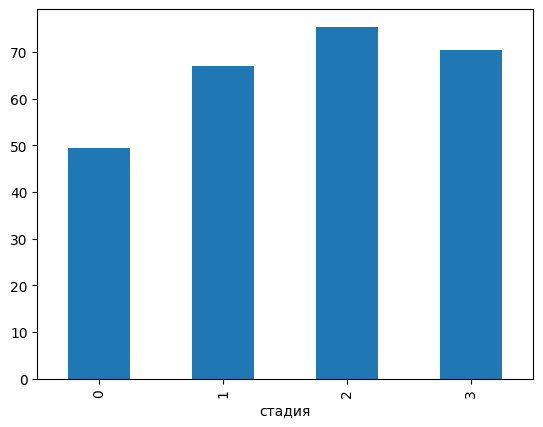

In [ ]:
table_agg['возраст'].plot.bar()

<Axes: xlabel='стадия'>

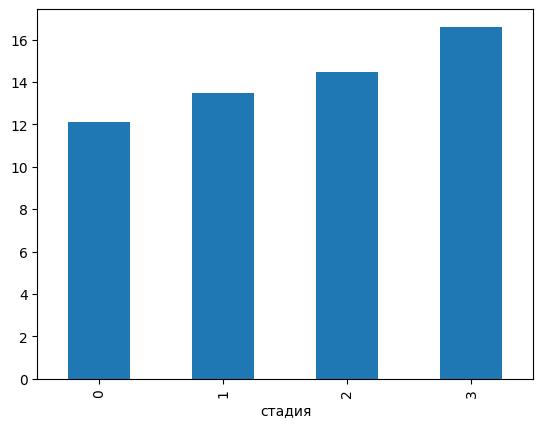

In [ ]:
table_agg['величина внутриглазного давления'].plot.bar()

<Axes: xlabel='стадия'>

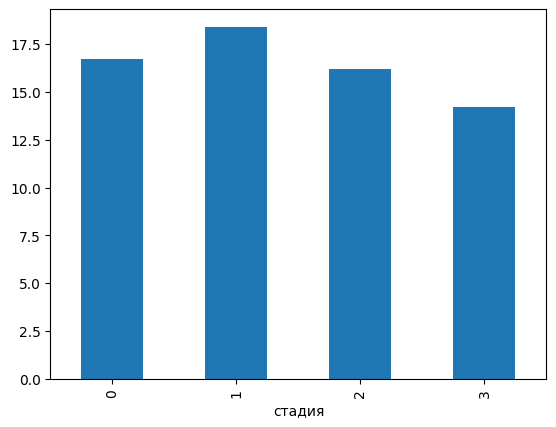

In [ ]:
table_agg['ВГД, корригированного на коэффициент ригидности'].plot.bar()

<Axes: xlabel='стадия'>

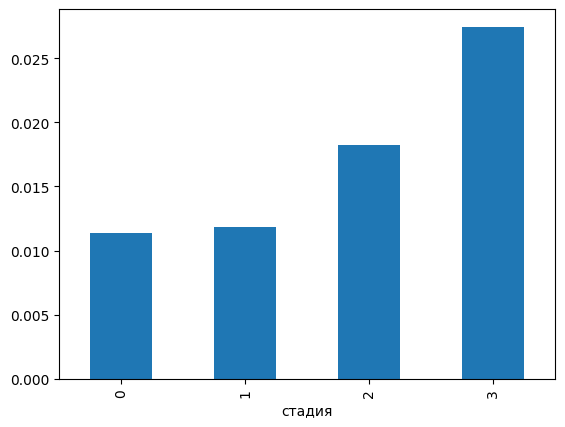

In [ ]:
table_agg['Коэфф ригидности склеральн капсулы глаза'].plot.bar()

<Axes: xlabel='стадия'>

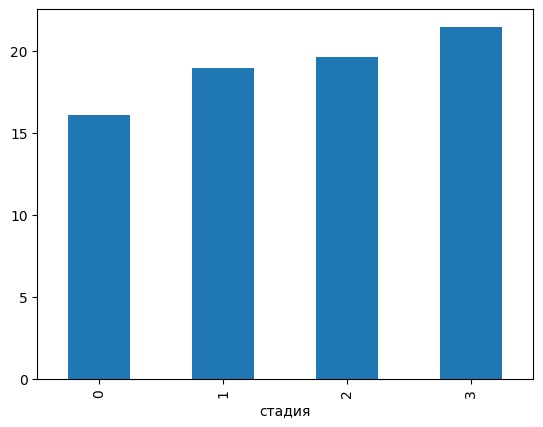

In [ ]:
table_agg['Роговично-компенсированное ВГД'].plot.bar()

<Axes: xlabel='стадия'>

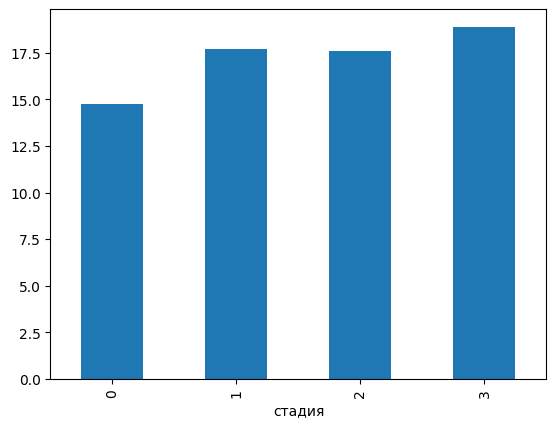

In [ ]:
table_agg['ВГД по Гольдману'].plot.bar()

<Axes: xlabel='стадия'>

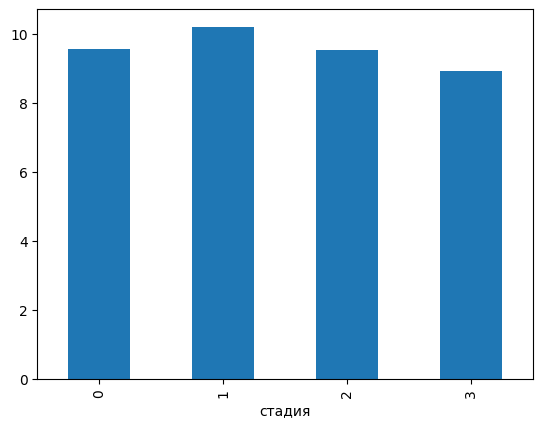

In [ ]:
table_agg['Фактор резистентности роговицы'].plot.bar()

<Axes: xlabel='стадия'>

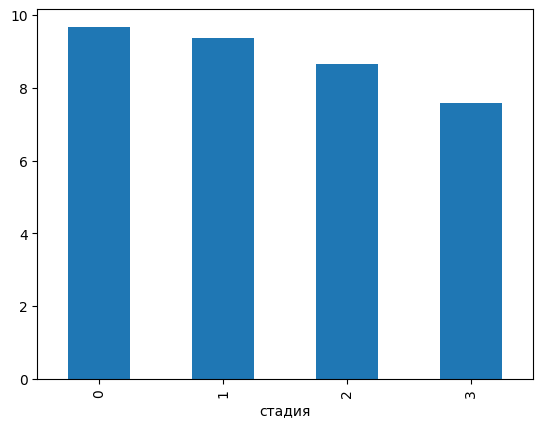

In [ ]:
table_agg['КГ'].plot.bar()

<Axes: xlabel='стадия'>

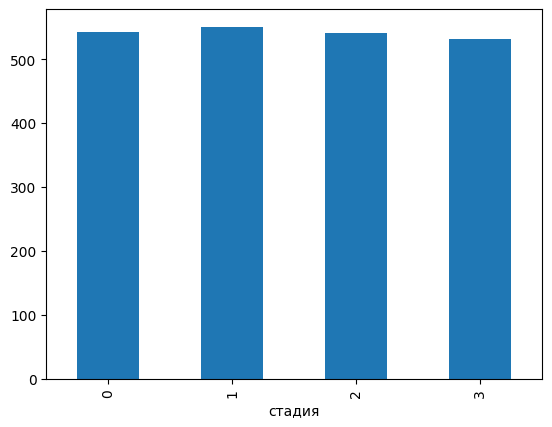

In [ ]:
table_agg['ЦТР'].plot.bar()

<Axes: xlabel='стадия'>

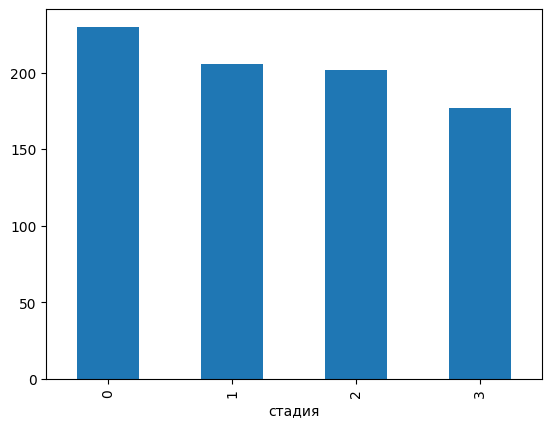

In [ ]:
table_agg['РП'].plot.bar()

<Axes: xlabel='стадия'>

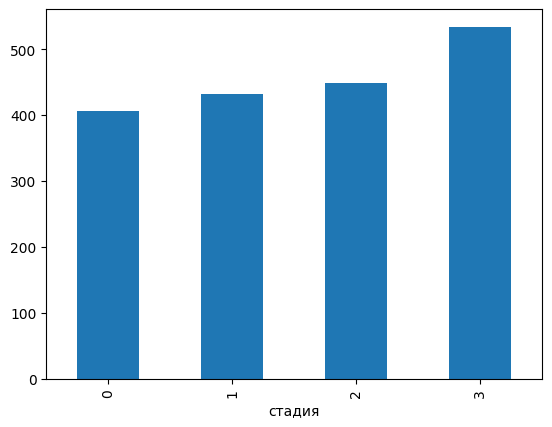

In [ ]:
table_agg['ГлРП'].plot.bar()

<Axes: xlabel='стадия'>

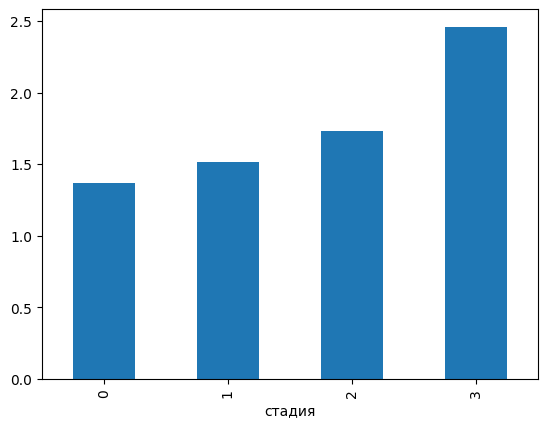

In [ ]:
table_agg['gamma Ш'].plot.bar()

<Axes: xlabel='стадия'>

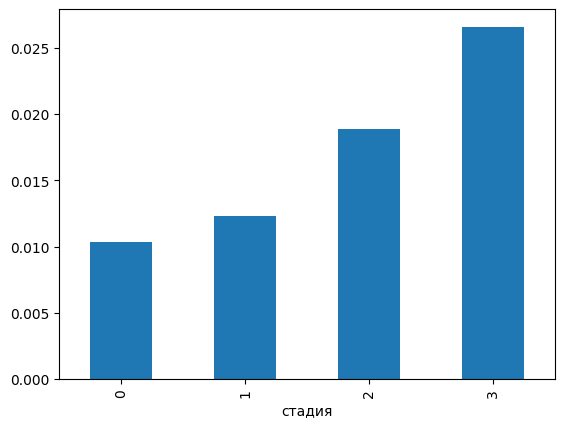

In [ ]:
table_agg['Efrid'].plot.bar()

<Axes: xlabel='стадия'>

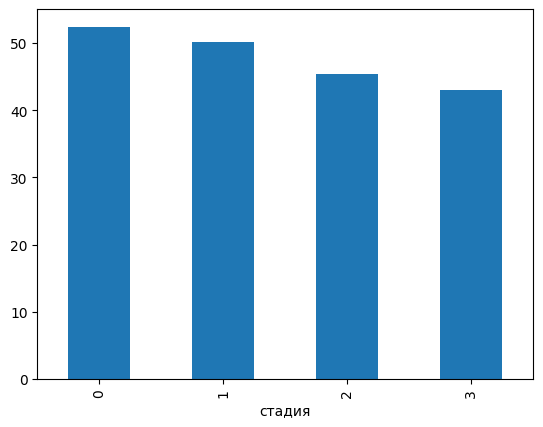

In [ ]:
table_agg['SVL'].plot.bar()

<Axes: xlabel='стадия'>

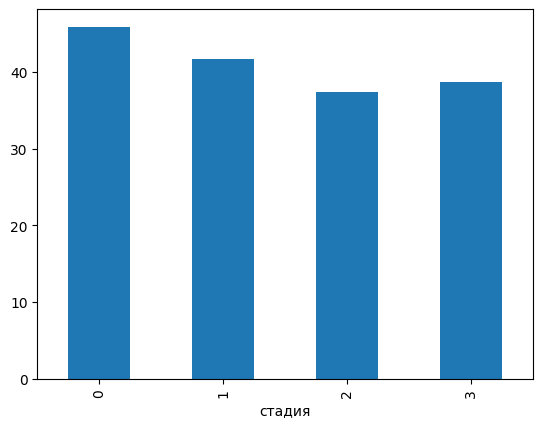

In [ ]:
table_agg['DVL'].plot.bar()

<Axes: xlabel='стадия'>

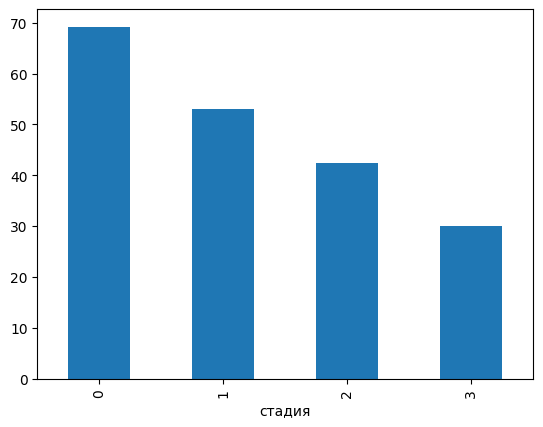

In [ ]:
table_agg['РИ (рео.индекс) мОм'].plot.bar()

<Axes: xlabel='стадия'>

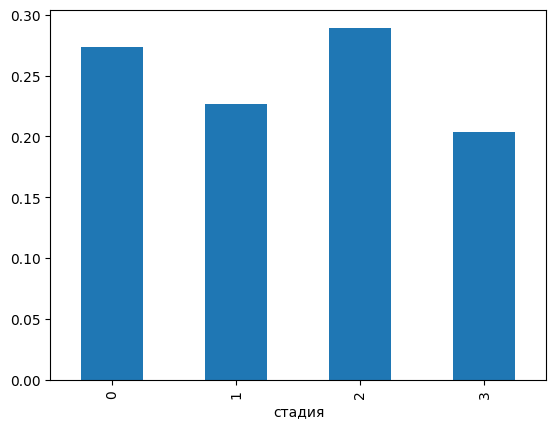

In [ ]:
table_agg['ПМН (макс.нап)'].plot.bar()

<Axes: xlabel='стадия'>

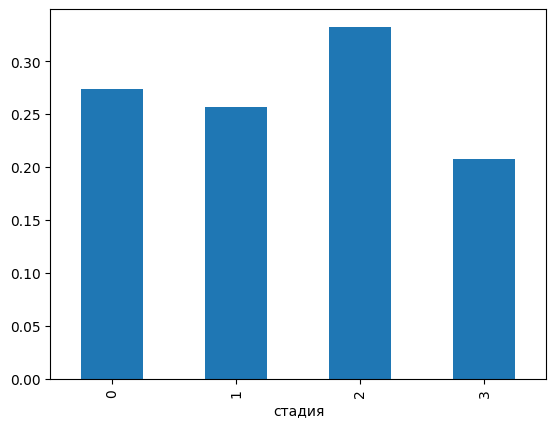

In [ ]:
table_agg['ПМУ (мод.упр.)'].plot.bar()

<Axes: xlabel='стадия'>

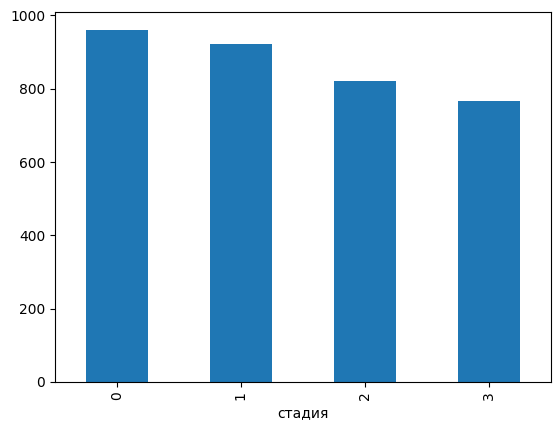

In [ ]:
table_agg['Z баз.(отн.))'].plot.bar()

<Axes: xlabel='стадия'>

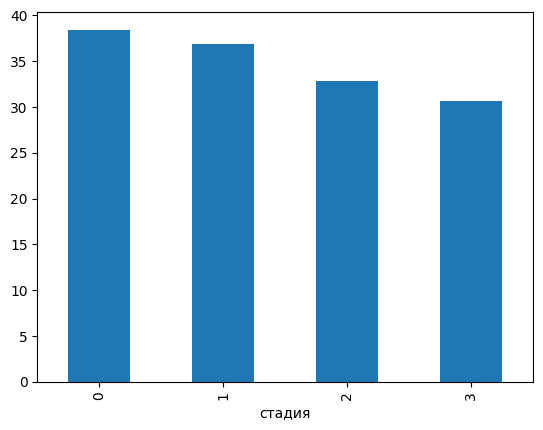

In [ ]:
table_agg['Z баз.(мОм)'].plot.bar()

<Axes: xlabel='стадия'>

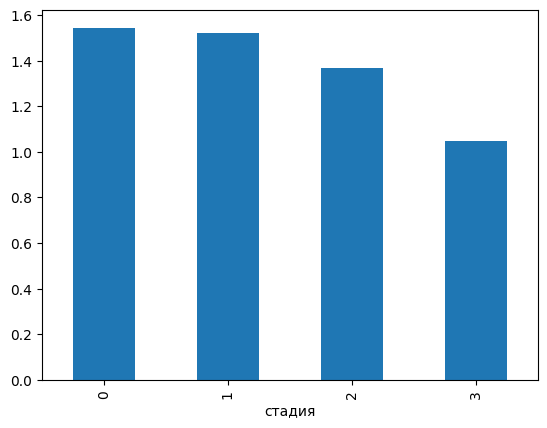

In [ ]:
table_agg['УОК (уд.объем) мкл'].plot.bar()

анализ

## Работа с пропущенными значениями в таблице со **здоровыми** пациентами

In [ ]:
#посмотрим сколько пропущенных значений в данных
data_healthy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Фамилия                                          8 non-null      object 
 1   возраст                                          11 non-null     int64  
 2   стадия                                           11 non-null     int64  
 3   величина внутриглазного давления                 11 non-null     int64  
 4   ВГД, корригированного на коэффициент ригидности  11 non-null     int64  
 5   Коэфф ригидности склеральн капсулы глаза         11 non-null     float64
 6   Роговично-компенсированное ВГД                   9 non-null      float64
 7   ВГД по Гольдману                                 9 non-null      float64
 8   Фактор резистентности роговицы                   9 non-null      float64
 9   КГ                                

Всего в исходных данных 11 строк.
Посмотрим сколько пропущенных значений в каждой колонке

In [ ]:
data_healthy.isnull().sum()

,0
Фамилия,3
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,2
ВГД по Гольдману,2
Фактор резистентности роговицы,2
КГ,2


Можем также оценить процент пропущенных значений

In [ ]:
(data_healthy.isna().sum() / len(data_healthy)).round(4) * 100

,0
Фамилия,27.27
возраст,0.00
стадия,0.00
величина внутриглазного давления,0.00
"ВГД, корригированного на коэффициент ригидности",0.00
Коэфф ригидности склеральн капсулы глаза,0.00
Роговично-компенсированное ВГД,18.18
ВГД по Гольдману,18.18
Фактор резистентности роговицы,18.18
КГ,18.18


**Вывод**: пропуски есть по 15 признакам из 23, что составляет более половины, процент пропущенных данных в основном не превышает 30%, кроме признака DVL(36.36%). На основе этого становится понятно, что удалять данные с пропущенными значениями - неподходящий способ в данной ситуации.

---



### Рассмотрим характер пропусков в данных

In [ ]:
# импортируем библиотеку missingno с псевдонимом msno для визуализации пропусков данных
import missingno as msno

In [ ]:
#настраиваем стиль графиков
sns.set()

<Axes: >

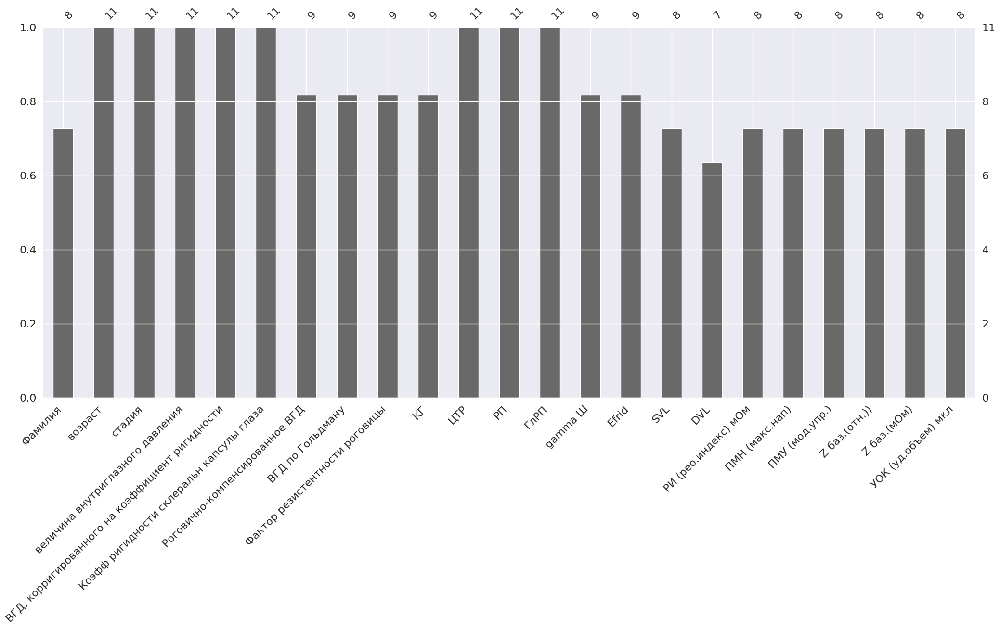

In [ ]:
msno.bar(data_healthy)

На этом графике мы видим процент (слева) и абсолютное количество (справа и сверху) заполненных значений.

При этом столбчатая диаграмма не дает информации о том, где именно больше всего пропущенных значений(есть ли в пропусках какая-то закономерность или нет).

Для наглядности расположения пропусков построим **матрицу пропущенных значений.**

<Axes: >

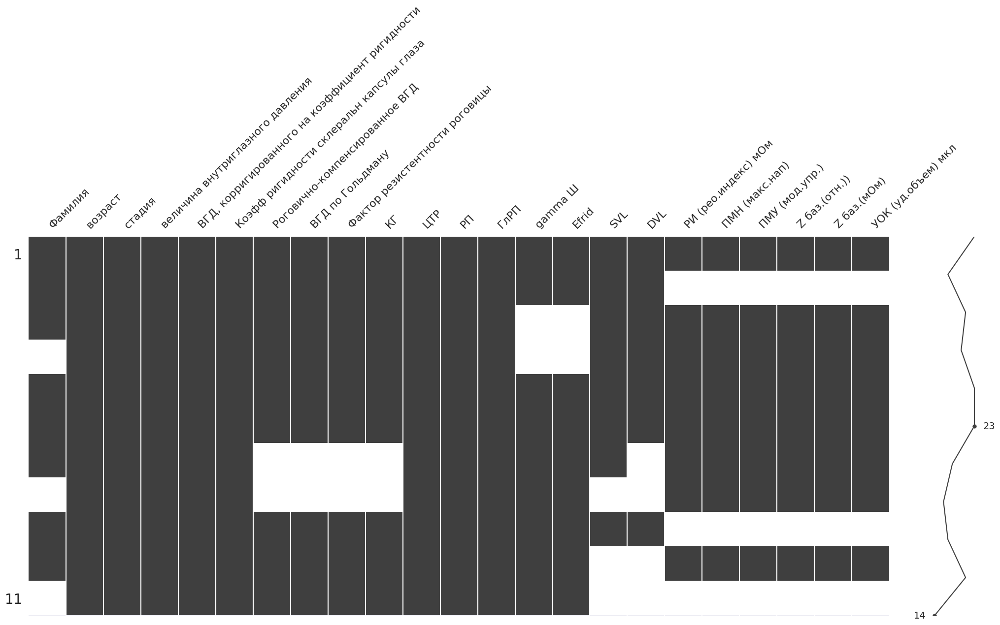

In [ ]:
#матрица пропущенных значений
msno.matrix(data_healthy)

Распределение пропущенных значений выглядит случайным внутри столбцов (закономерностью были бы пропуски, например, только в первой половине наблюдений).

Для того чтобы узнать насколько сильно присутствие или отсутствие значений одного признака влияет на присутствие значений другого, построим **матрицу корреляции пропущенных значений (nullity correlation matrix).**

In [ ]:
tmp_df = data_healthy.iloc[:, [i for i, n in enumerate(np.var(data_healthy.isnull(), axis = 'rows')) if n > 0]]
tmp_df.isnull().corr()

,Фамилия,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
Фамилия,1.000000,0.240563,0.240563,0.240563,0.240563,0.240563,0.240563,0.541667,0.385758,0.083333,0.083333,0.083333,0.083333,0.083333,0.083333
Роговично-компенсированное ВГД,0.240563,1.000000,1.000000,1.000000,1.000000,-0.222222,-0.222222,0.240563,0.623610,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
ВГД по Гольдману,0.240563,1.000000,1.000000,1.000000,1.000000,-0.222222,-0.222222,0.240563,0.623610,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
Фактор резистентности роговицы,0.240563,1.000000,1.000000,1.000000,1.000000,-0.222222,-0.222222,0.240563,0.623610,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
КГ,0.240563,1.000000,1.000000,1.000000,1.000000,-0.222222,-0.222222,0.240563,0.623610,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
gamma Ш,0.240563,-0.222222,-0.222222,-0.222222,-0.222222,1.000000,1.000000,-0.288675,-0.356348,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
Efrid,0.240563,-0.222222,-0.222222,-0.222222,-0.222222,1.000000,1.000000,-0.288675,-0.356348,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675
SVL,0.541667,0.240563,0.240563,0.240563,0.240563,-0.288675,-0.288675,1.000000,0.810093,0.083333,0.083333,0.083333,0.083333,0.083333,0.083333
DVL,0.385758,0.623610,0.623610,0.623610,0.623610,-0.356348,-0.356348,0.810093,1.000000,-0.038576,-0.038576,-0.038576,-0.038576,-0.038576,-0.038576
РИ (рео.индекс) мОм,0.083333,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,-0.288675,0.083333,-0.038576,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Значения корреляции могут быть от −1 (если значения одного признака присутствуют, значения другого — отсутствуют) до 1 (если присутствуют значения одного признака, то присутствуют значения и другого).

Визуально, корреляцию пропущенных значений можно представить с помощью тепловой карты (heatmap). Для этого есть функция msno.heatmap().

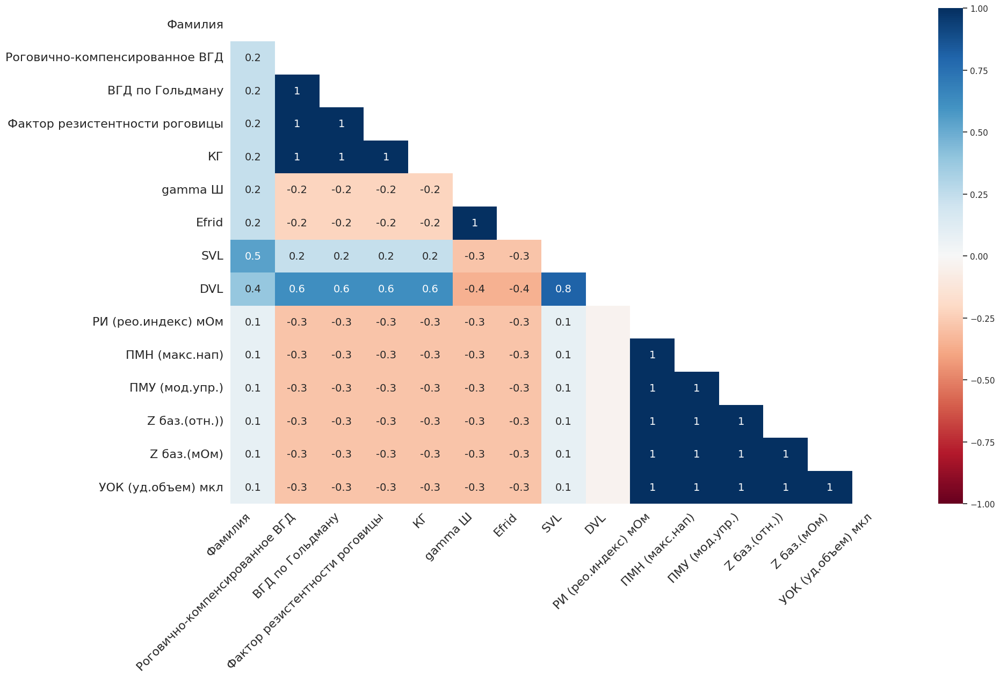

In [ ]:
msno.heatmap(data_healthy);

Заметим, что несколько пропущенных признаков имеют **коэффициент корреляции 1.** Получается, что пропуски одного признака влияют на пропуски другого.

Между собой связаны пропуски по следующим признакам:


*   ВГД по Гольдману и Роговично-компенсированное ВГД
*   Фактор резистентности роговицы и Роговично-компенсированное ВГД
*   Фактор резистентности роговицы и ВГД по Гольдману
*   КГ и Роговично-компенсированное ВГД
*   КГ и ВГД по Гольдману
*   КГ и Фактор резистентности роговицы
*   Efrid и gamma Ш
*   ПМН (макс.нап) и РИ (рео.индекс) мОм
*   ПМУ (мод.упр.) и РИ (рео.индекс) мОм
*   ПМУ (мод.упр.) и ПМН (макс.нап)
*   Z баз.(отн.) и РИ (рео.индекс) мОм  
*   Z баз.(отн.) и ПМН (макс.нап)
*   Z баз.(отн.) и ПМУ (мод.упр.)
*   Z баз.(мОм) и РИ (рео.индекс) мОм
*   Z баз.(мОм) и ПМН (макс.нап)
*   Z баз.(мОм) и ПМУ (мод.упр.)
*   Z баз.(мОм) и Z баз.(отн.)
*   УОК (уд.объем) мкл и РИ (рео.индекс) мОм
*   УОК (уд.объем) мкл и ПМН (макс.нап)
*   УОК (уд.объем) мкл и ПМУ (мод.упр.)
*   УОК (уд.объем) мкл и Z баз.(отн.)
*   УОК (уд.объем) мкл и Z баз.(мОм)

### Заполняем пропуски в категориальных признаках



---
Фамилия - категориальный признак. Заполним значением по умолчанию, например,
"Иванов"

In [ ]:
data_healthy['Фамилия']=data_healthy['Фамилия'].fillna('Иванов')
data_healthy.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,2
ВГД по Гольдману,2
Фактор резистентности роговицы,2
КГ,2


### Заполняем пропуски в количественных признаках

---

Остальные пропущенные значения принадлежат количественным признакам.

Можно заменить средним значением, модой или медианой.

У такого подхода есть ряд недостатков.

Во-первых, когда в данных появляется большое количество одинаковых близких к среднему значений, мы снижаем ценную вариативность в данных.

Во-вторых, такое заполнение пропусков может быть некорректно.


### Роговично-компенсированное ВГД

In [ ]:
# сделаем копию данных
fillna_median = data_healthy.copy()

# заполним пропуски в столбце 'Роговично-компенсированное ВГД' медианным значением признака,
# можно заполнить и средним арифметическим через метод .mean()
fillna_median['Роговично-компенсированное ВГД'].fillna(fillna_median['Роговично-компенсированное ВГД'].median(), inplace = True)

# убедимся, что пропусков не осталось
fillna_median['Роговично-компенсированное ВГД'].isna().sum()

<ipython-input-60-34e4d44380ba>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fillna_median['Роговично-компенсированное ВГД'].fillna(fillna_median['Роговично-компенсированное ВГД'].median(), inplace = True)


0

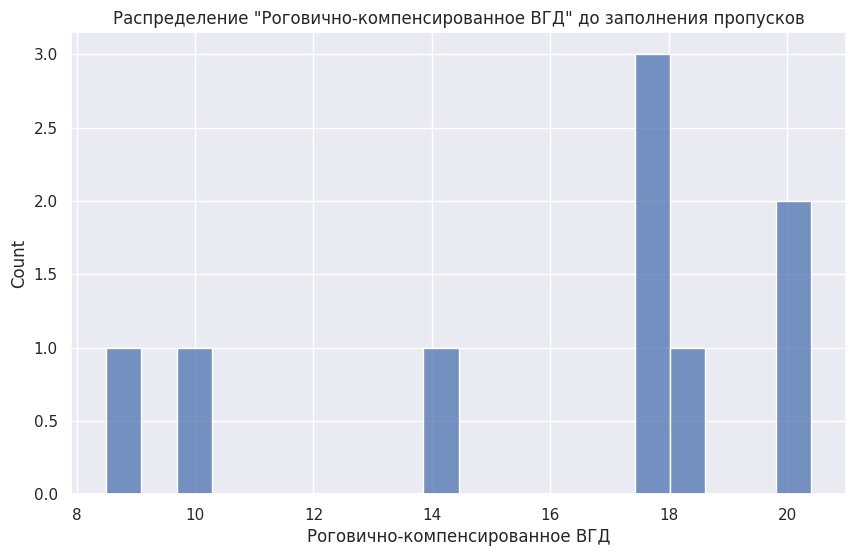

In [ ]:
# изменим размер последующих графиков
sns.set(rc = {'figure.figsize' : (10, 6)})

# скопируем датафрейм
median_imputer = data_healthy.copy()

# посмотрим на распределение 'Роговично-компенсированное ВГД' до заполнения пропусков
sns.histplot(median_imputer['Роговично-компенсированное ВГД'], bins = 20)
plt.title('Распределение "Роговично-компенсированное ВГД" до заполнения пропусков');

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
median_imputer['Роговично-компенсированное ВГД'].mean().round(1), median_imputer['Роговично-компенсированное ВГД'].median()


(16.1, 17.8)

In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
# (для заполнения средним арифметическим используйте strategy = 'mean')
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['Роговично-компенсированное ВГД'] = imp_median.fit_transform(median_imputer[['Роговично-компенсированное ВГД']])

# убедимся, что пропущенных значений не осталось
median_imputer['Роговично-компенсированное ВГД'].isna().sum()

0

Посмотрим на распределение признака и его медианное значение после заполнения пропусков.

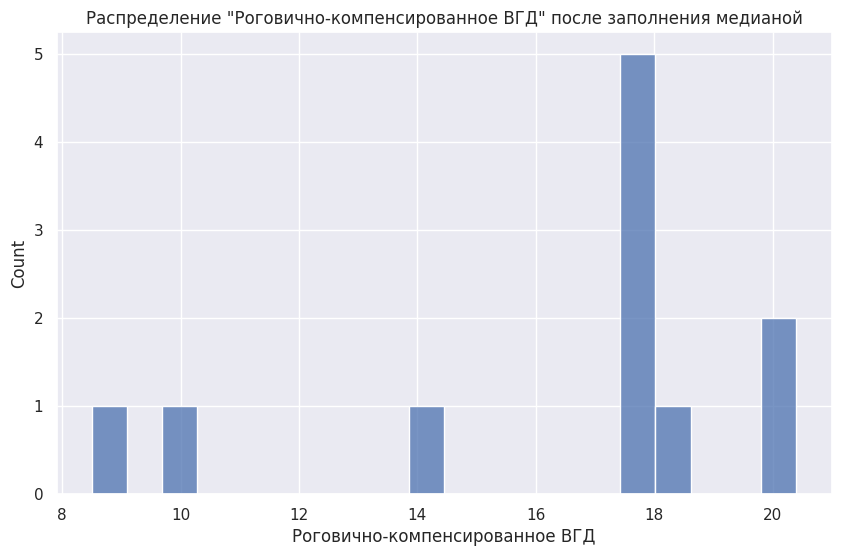

In [ ]:
# посмотрим на распределение после заполнения пропусков
sns.histplot(median_imputer['Роговично-компенсированное ВГД'], bins = 20)
plt.title('Распределение "Роговично-компенсированное ВГД" после заполнения медианой');

In [ ]:
# посмотрим на метрики после заполнения медианой
median_imputer['Роговично-компенсированное ВГД'].mean().round(1), median_imputer['Роговично-компенсированное ВГД'].median()


(16.4, 17.8)

Среднее значение изменилось(увеличилось на 0.3), медиана осталось прежней.

По графикам заметим, что распределение не претерпело существенных изменений. Значит можем заполнить пропуски по этой стратегии.

---



Аналогично попробуем заполнить и другие пропуски медианным значением.

### ВГД по Гольдману

In [ ]:
# заполним пропуски в столбце 'ВГД по Гольдману' медианным значением признака
fillna_median['ВГД по Гольдману'].fillna(fillna_median['ВГД по Гольдману'].median(), inplace = True)

# убедимся, что пропусков не осталось
fillna_median['ВГД по Гольдману'].isna().sum()

<ipython-input-66-787d20d99c93>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fillna_median['ВГД по Гольдману'].fillna(fillna_median['ВГД по Гольдману'].median(), inplace = True)


0

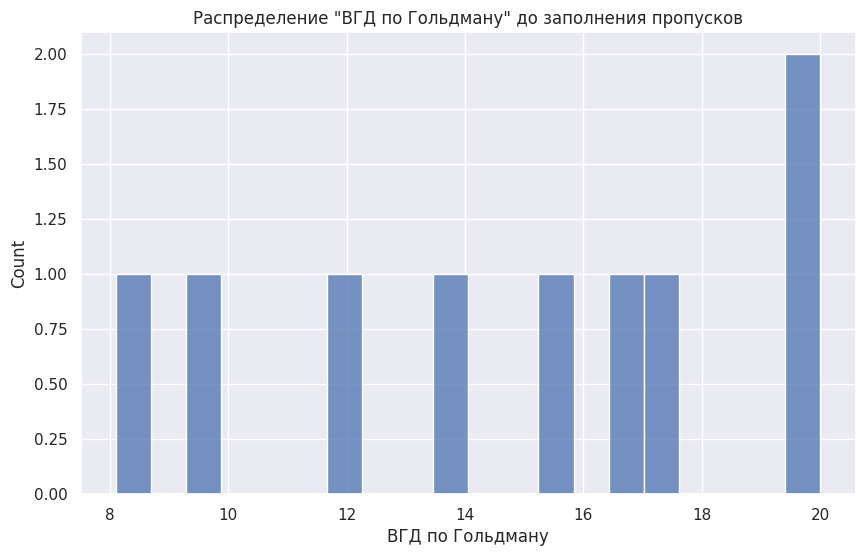

In [ ]:
# посмотрим на распределение 'ВГД по Гольдману' до заполнения пропусков
sns.histplot(data_healthy['ВГД по Гольдману'], bins = 20)
plt.title('Распределение "ВГД по Гольдману" до заполнения пропусков');

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
median_imputer['ВГД по Гольдману'].mean().round(1), median_imputer['ВГД по Гольдману'].median()


(14.7, 15.6)

In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
# (для заполнения средним арифметическим используйте strategy = 'mean')
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['ВГД по Гольдману'] = imp_median.fit_transform(median_imputer[['ВГД по Гольдману']])

# убедимся, что пропущенных значений не осталось
median_imputer['ВГД по Гольдману'].isna().sum()

0

Посмотрим на распределение возраста и его медианное значение после заполнения пропусков.

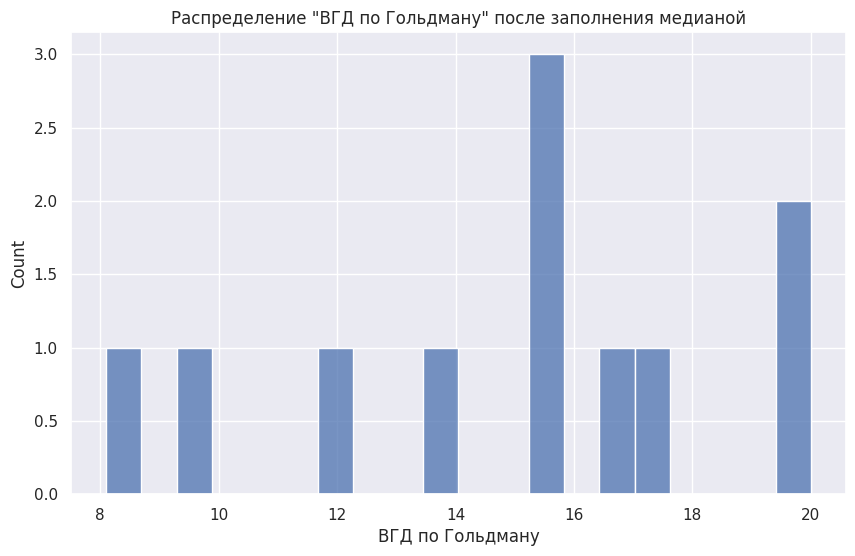

In [ ]:
# посмотрим на распределение после заполнения пропусков
sns.histplot(median_imputer['ВГД по Гольдману'], bins = 20)
plt.title('Распределение "ВГД по Гольдману" после заполнения медианой');

In [ ]:
# посмотрим на метрики после заполнения медианой
median_imputer['ВГД по Гольдману'].mean().round(1), median_imputer['ВГД по Гольдману'].median()


(14.9, 15.6)

Среднее значение изменилось(увеличилось на 0.2), медиана осталось прежней.

График распределения визуально **изменился**.

### Фактор резистентности роговицы

In [ ]:
# заполним пропуски в столбце 'Фактор резистентности роговицы' медианным значением признака
fillna_median['Фактор резистентности роговицы'].fillna(fillna_median['Фактор резистентности роговицы'].median(), inplace = True)

# убедимся, что пропусков не осталось
fillna_median['Фактор резистентности роговицы'].isna().sum()

<ipython-input-72-42e70bed7aaa>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fillna_median['Фактор резистентности роговицы'].fillna(fillna_median['Фактор резистентности роговицы'].median(), inplace = True)


0

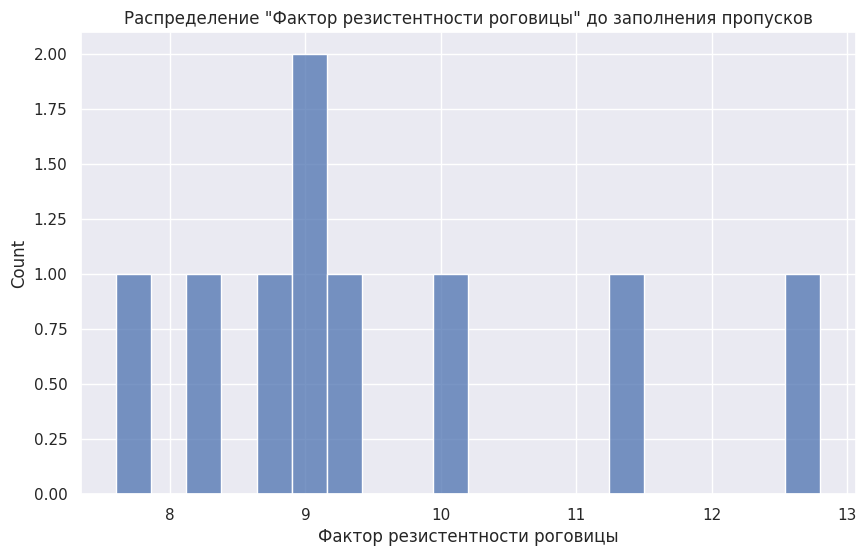

In [ ]:
# посмотрим на распределение 'Фактор резистентности роговицы' до заполнения пропусков
sns.histplot(data_healthy['Фактор резистентности роговицы'], bins = 20)
plt.title('Распределение "Фактор резистентности роговицы" до заполнения пропусков');

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
median_imputer['Фактор резистентности роговицы'].mean().round(1), median_imputer['Фактор резистентности роговицы'].median()


(9.6, 9.1)

In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
# (для заполнения средним арифметическим используйте strategy = 'mean')
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['Фактор резистентности роговицы'] = imp_median.fit_transform(median_imputer[['Фактор резистентности роговицы']])

# убедимся, что пропущенных значений не осталось
median_imputer['Фактор резистентности роговицы'].isna().sum()

0

Посмотрим на распределение возраста и его медианное значение после заполнения пропусков.

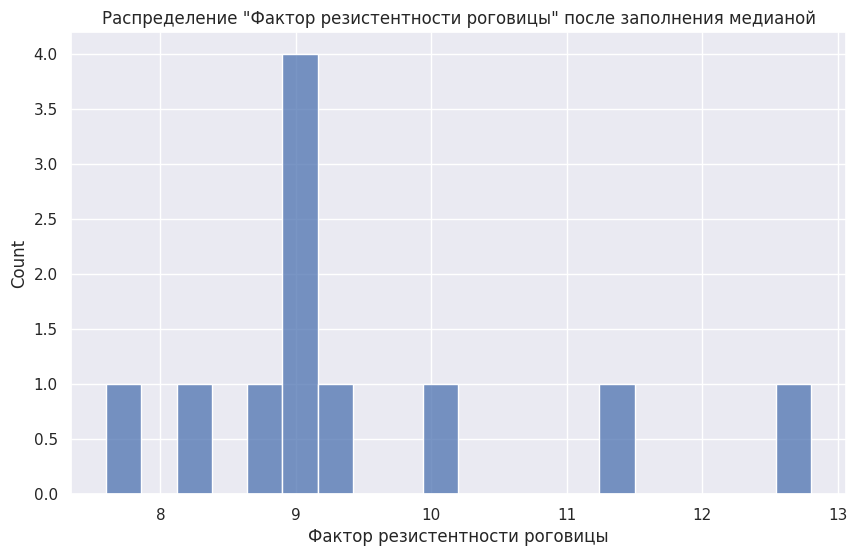

In [ ]:
# посмотрим на распределение после заполнения пропусков
sns.histplot(median_imputer['Фактор резистентности роговицы'], bins = 20)
plt.title('Распределение "Фактор резистентности роговицы" после заполнения медианой');

In [ ]:
# посмотрим на метрики после заполнения медианой
median_imputer['Фактор резистентности роговицы'].mean().round(1), median_imputer['Фактор резистентности роговицы'].median()


(9.5, 9.1)

Среднее значение изменилось(увеличилось на 0.1), медиана осталось прежней.

График распределения визуально **незначительно изменился**, форма осталась прежней.



### КГ

In [ ]:
# заполним пропуски в столбце 'КГ' медианным значением признака
fillna_median['КГ'].fillna(fillna_median['КГ'].median(), inplace = True)

# убедимся, что пропусков не осталось
fillna_median['КГ'].isna().sum()

<ipython-input-78-11e3c6bd54cf>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fillna_median['КГ'].fillna(fillna_median['КГ'].median(), inplace = True)


0

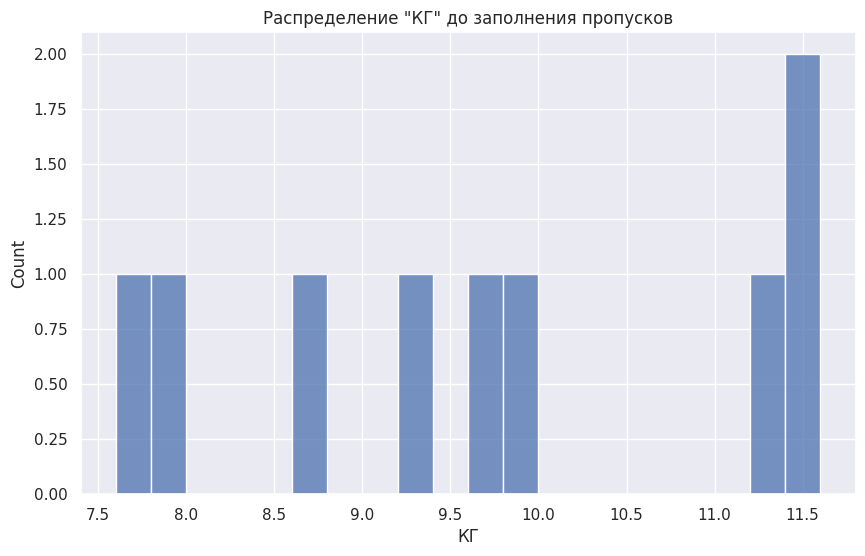

In [ ]:
# посмотрим на распределение 'КГ' до заполнения пропусков
sns.histplot(data_healthy['КГ'], bins = 20)
plt.title('Распределение "КГ" до заполнения пропусков');

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
median_imputer['КГ'].mean().round(1), median_imputer['КГ'].median()


(9.7, 9.6)

In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
# (для заполнения средним арифметическим используйте strategy = 'mean')
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['КГ'] = imp_median.fit_transform(median_imputer[['КГ']])

# убедимся, что пропущенных значений не осталось
median_imputer['КГ'].isna().sum()

0

Посмотрим на распределение возраста и его медианное значение после заполнения пропусков.

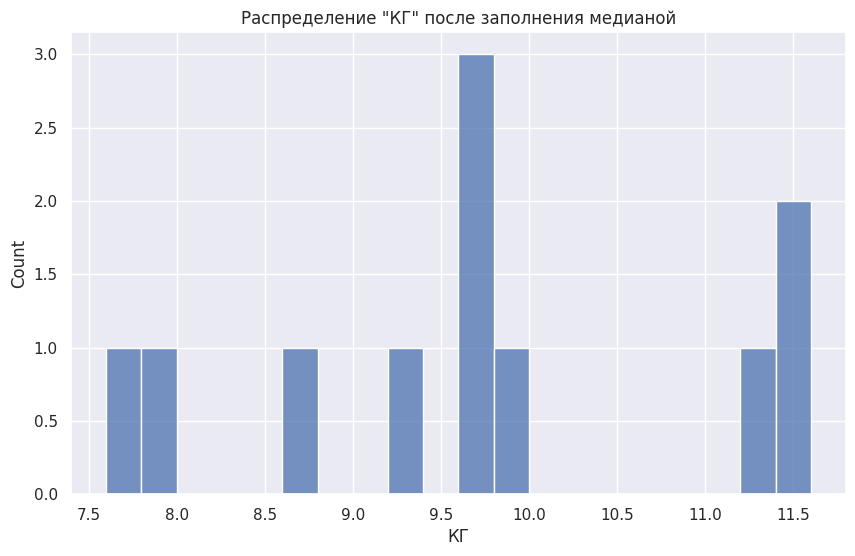

In [ ]:
# посмотрим на распределение после заполнения пропусков
sns.histplot(median_imputer['КГ'], bins = 20)
plt.title('Распределение "КГ" после заполнения медианой');

In [ ]:
# посмотрим на метрики после заполнения медианой
median_imputer['КГ'].mean().round(1), median_imputer['КГ'].median()


(9.7, 9.6)

Среднее значение и медиана не изменились.

График распределения визуально **изменился**.

### gamma Ш

In [ ]:
# заполним пропуски в столбце 'gamma Ш' медианным значением признака
fillna_median['gamma Ш'].fillna(fillna_median['gamma Ш'].median(), inplace = True)

# убедимся, что пропусков не осталось
fillna_median['gamma Ш'].isna().sum()

<ipython-input-84-5bec7635ab5b>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  fillna_median['gamma Ш'].fillna(fillna_median['gamma Ш'].median(), inplace = True)


0

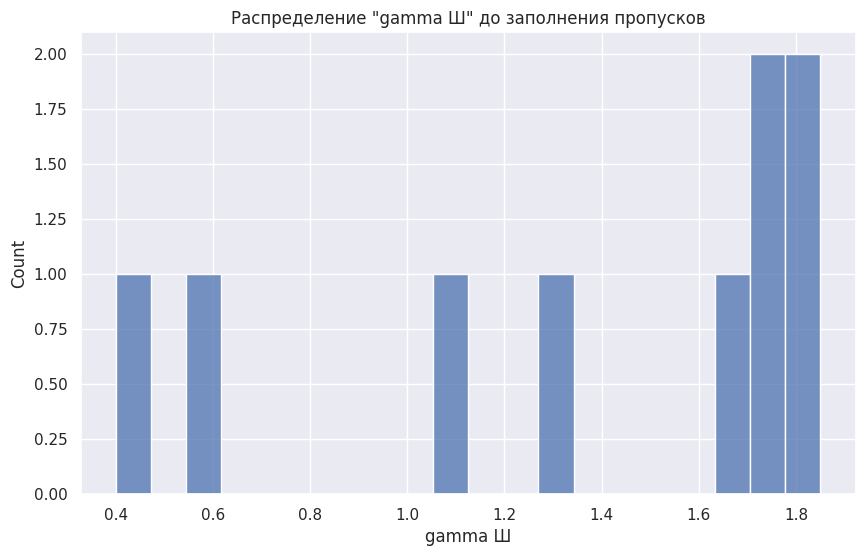

In [ ]:
# посмотрим на распределение 'gamma Ш' до заполнения пропусков
sns.histplot(data_healthy['gamma Ш'], bins = 20)
plt.title('Распределение "gamma Ш" до заполнения пропусков');

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
median_imputer['gamma Ш'].mean().round(1), median_imputer['gamma Ш'].median()


(1.4, 1.7)

In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
# (для заполнения средним арифметическим используйте strategy = 'mean')
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['gamma Ш'] = imp_median.fit_transform(median_imputer[['gamma Ш']])

# убедимся, что пропущенных значений не осталось
median_imputer['gamma Ш'].isna().sum()

0

Посмотрим на распределение возраста и его медианное значение после заполнения пропусков.

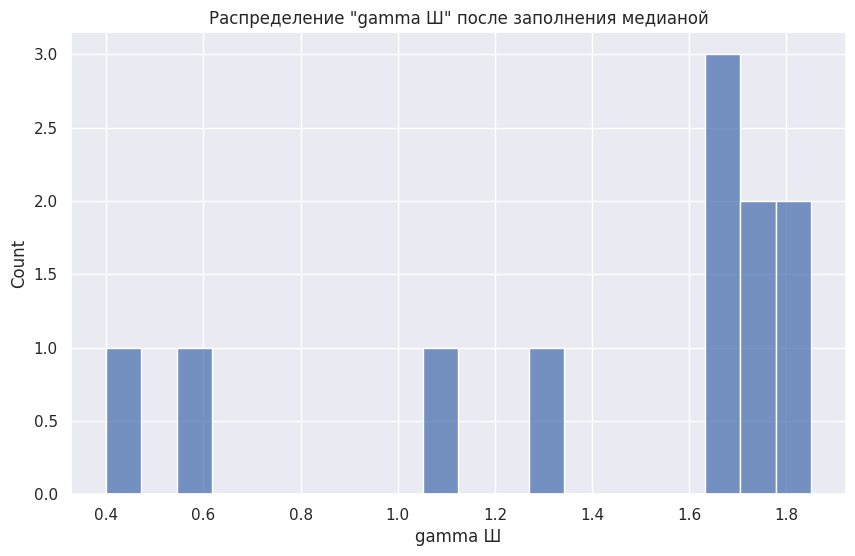

In [ ]:
# посмотрим на распределение после заполнения пропусков
sns.histplot(median_imputer['gamma Ш'], bins = 20)
plt.title('Распределение "gamma Ш" после заполнения медианой');

In [ ]:
# посмотрим на метрики после заполнения медианой
median_imputer['gamma Ш'].mean().round(1), median_imputer['gamma Ш'].median()


(1.4, 1.7)

Среднее значение и медиана не изменились.

График распределения визуально **изменился**.

Остальные пропуски также заполним медианным значением

### Остальные пропуски

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())


Efrid -  0.0    0.0138
SVL -  52.4    52.44
DVL -  45.9    45.88
РИ (рео.индекс) мОм -  69.2    51.555
ПМН (макс.нап) -  0.3    0.28
ПМУ (мод.упр.) -  0.3    0.275
Z баз.(отн.)) -  960.8    948.0
Z баз.(мОм) -  38.4    37.92
УОК (уд.объем) мкл -  1.5    1.25286723


In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['Efrid'] = imp_median.fit_transform(median_imputer[['Efrid']])
median_imputer['SVL'] = imp_median.fit_transform(median_imputer[['SVL']])
median_imputer['DVL'] = imp_median.fit_transform(median_imputer[['DVL']])
median_imputer['РИ (рео.индекс) мОм'] = imp_median.fit_transform(median_imputer[['РИ (рео.индекс) мОм']])
median_imputer['ПМН (макс.нап)'] = imp_median.fit_transform(median_imputer[['ПМН (макс.нап)']])
median_imputer['ПМУ (мод.упр.)'] = imp_median.fit_transform(median_imputer[['ПМУ (мод.упр.)']])
median_imputer['Z баз.(отн.))'] = imp_median.fit_transform(median_imputer[['Z баз.(отн.))']])
median_imputer['Z баз.(мОм)'] = imp_median.fit_transform(median_imputer[['Z баз.(мОм)']])
median_imputer['УОК (уд.объем) мкл'] = imp_median.fit_transform(median_imputer[['УОК (уд.объем) мкл']])

# убедимся, что пропущенных значений не осталось
median_imputer['УОК (уд.объем) мкл'].isna().sum()

0

In [ ]:
# посмотрим на метрики после заполнения медианой
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())


Efrid -  0.0    0.0138
SVL -  52.4    52.44
DVL -  45.9    45.88
РИ (рео.индекс) мОм -  64.4    51.555
ПМН (макс.нап) -  0.3    0.28
ПМУ (мод.упр.) -  0.3    0.275
Z баз.(отн.)) -  957.3    948.0
Z баз.(мОм) -  38.3    37.92
УОК (уд.объем) мкл -  1.5    1.25286723


Среднее значение и медиана не изменились для признаков Efrid, SVL, DVL, ПМН(макс.нап), ПМН(мод.упр.), УОК (уд.объем) мкл.

Заметно изменение среднего значения РИ (рео.индекс) мОм, Z баз.(отн.) и Z баз.(мОм).

Проверяем, что заполнили все пропуски.

In [ ]:
median_imputer.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


## Сравниваем взаимосвязь признаков до и после заполнения пропусков

In [ ]:
corr_matrix_before=data_healthy.iloc [:, 1:11].corr().round(3)

<Axes: >

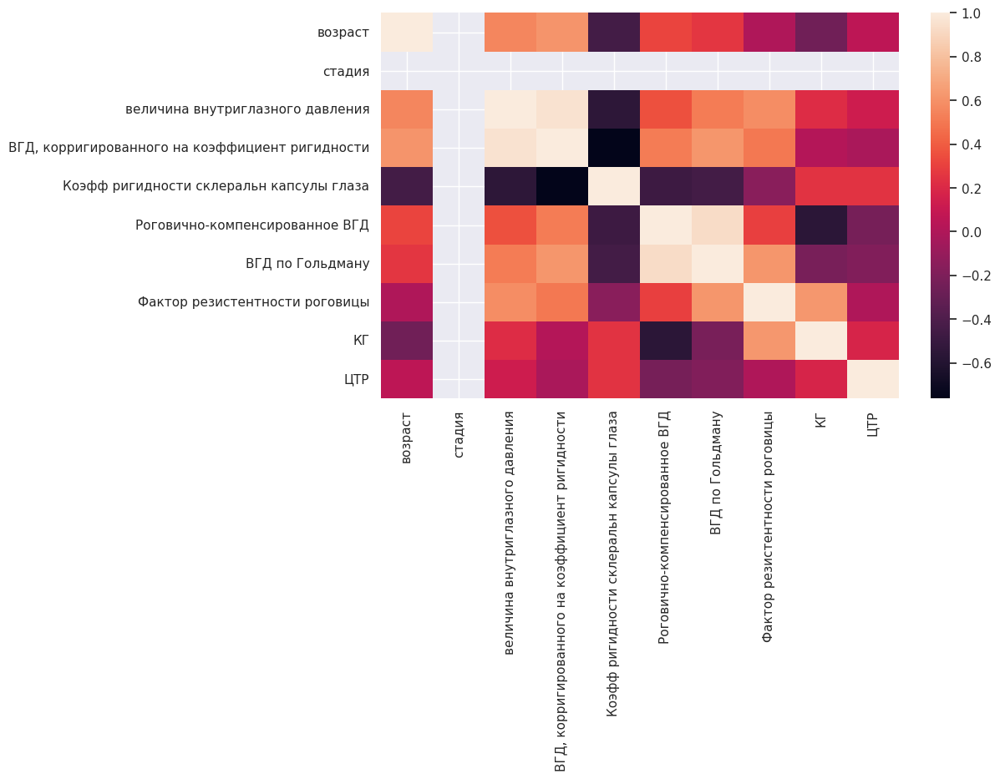

In [ ]:
sns.heatmap(corr_matrix_before)

In [ ]:
corr_matrix_after=median_imputer.iloc [:, 1:11].corr().round(3)

<Axes: >

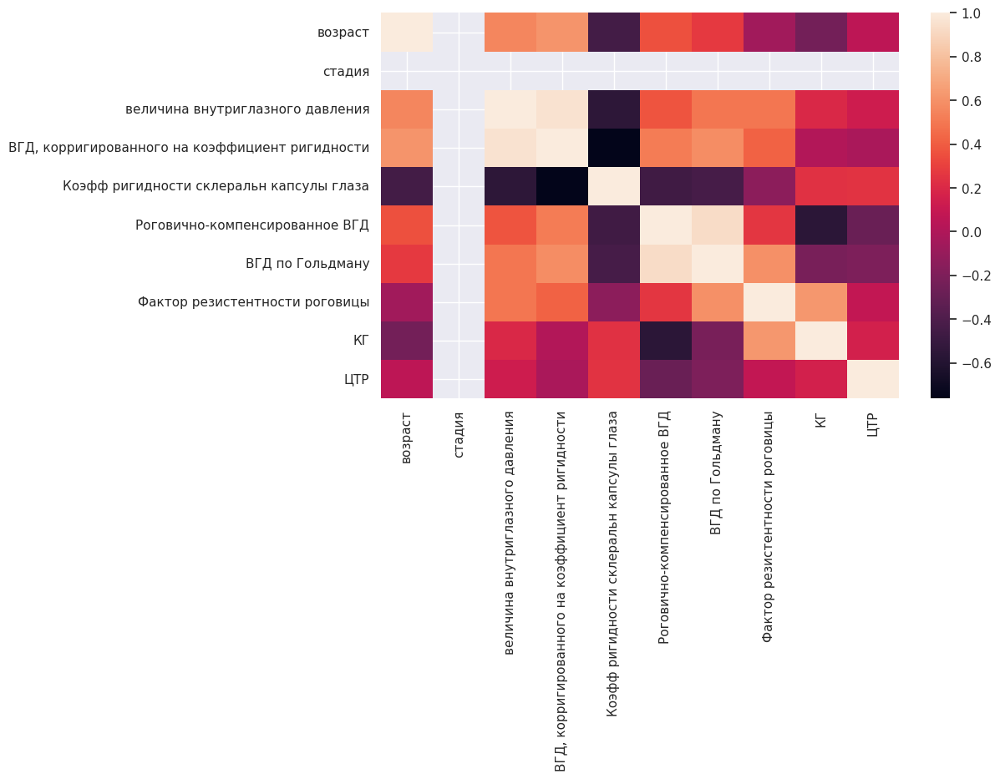

In [ ]:
sns.heatmap(corr_matrix_after)

Визуально взаимосвязь дополненных показателей с другими не изменилась.

In [ ]:
changes_in_corr=corr_matrix_before-corr_matrix_after

In [ ]:
changes_in_corr

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР
возраст,0.000,NaN,0.000,0.000,0.000,-0.041,-0.011,0.061,-0.019,0.000
стадия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
величина внутриглазного давления,0.000,NaN,0.000,0.000,0.000,-0.016,0.017,0.088,0.024,0.000
"ВГД, корригированного на коэффициент ригидности",0.000,NaN,0.000,0.000,0.000,0.005,0.031,0.082,0.008,0.000
Коэфф ригидности склеральн капсулы глаза,0.000,NaN,0.000,0.000,0.000,-0.012,-0.011,-0.012,0.006,0.000
Роговично-компенсированное ВГД,-0.041,NaN,-0.016,0.005,-0.012,0.000,0.002,0.030,-0.005,0.055
ВГД по Гольдману,-0.011,NaN,0.017,0.031,-0.011,0.002,0.000,0.020,0.001,0.014
Фактор резистентности роговицы,0.061,NaN,0.088,0.082,-0.012,0.030,0.020,0.000,0.002,-0.082
КГ,-0.019,NaN,0.024,0.008,0.006,-0.005,0.001,0.002,0.000,0.026
ЦТР,0.000,NaN,0.000,0.000,0.000,0.055,0.014,-0.082,0.026,0.000


Изменения произошли, но они достаточно малы.

<Axes: >

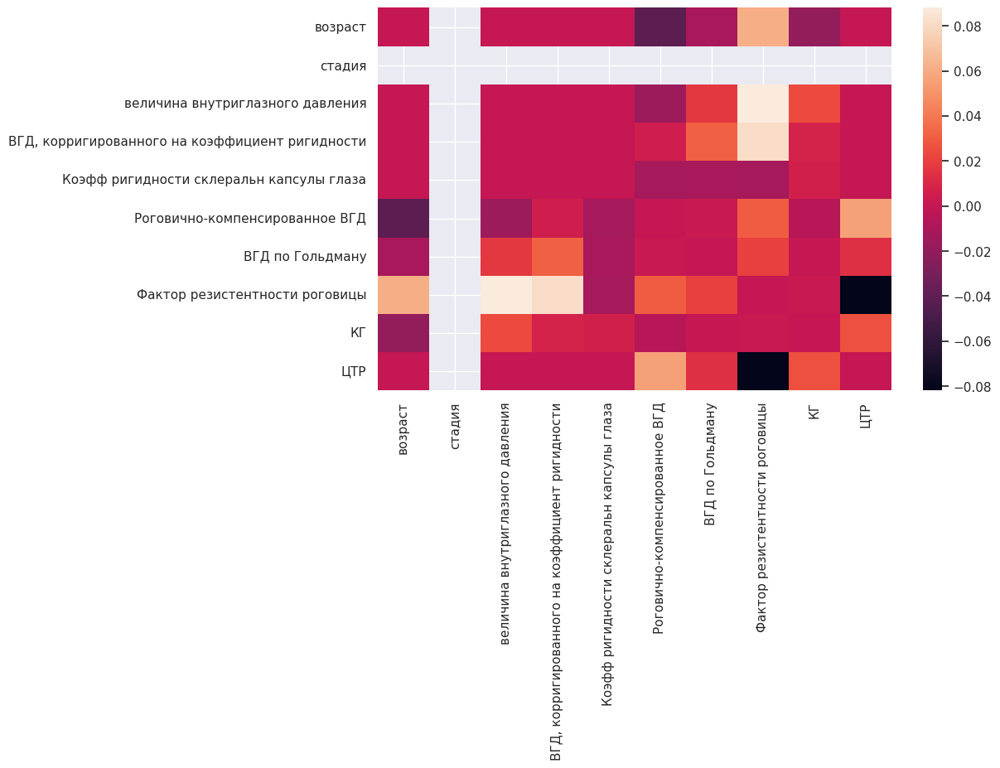

In [ ]:
sns.heatmap(changes_in_corr)

In [ ]:
data_healthy=median_imputer

Аналогично будут обработаны таблицы для 1й, 2й и 3й стадий

## Работа с пропущенными значениями в таблице с пациентами **1 стадии заболевания**

In [ ]:
data_1_stage

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,горнева,84,1,13,27,0.0007,16.1,14.7,9.5,9.6,...,0.45,0.0007,NaN,NaN,30.27,0.27,0.31,NaN,NaN,NaN
1,фокина,64,1,20,30,0.0053,20.0,20.0,11.0,10.0,...,0.55,0.0053,46.73000,34.530000,44.00,0.11,0.20,982.0,39.28,1.022709
2,петрова,56,1,18,21,0.0148,23.7,23.1,11.7,9.3,...,2.00,0.0148,54.63000,42.690000,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,56,1,21,18,0.0268,26.8,25.6,11.8,8.5,...,2.10,0.0268,53.75000,41.320000,NaN,NaN,NaN,NaN,NaN,NaN
4,ефременкова,65,1,7,9,0.0167,17.7,14.4,8.0,8.0,...,1.95,0.0167,50.50000,47.950000,76.00,0.05,0.09,1077.0,43.08,1.610678
5,NaN,65,1,13,24,0.0040,21.5,17.8,8.3,7.1,...,1.00,0.0040,45.15000,34.910000,71.00,0.04,0.07,972.0,38.88,1.667258
6,набатчикова,72,1,11,12,0.0032,21.0,20.0,11.7,9.3,...,NaN,NaN,51.60000,46.270000,44.47,0.44,0.38,1060.0,42.40,0.957573
7,огулева,65,1,8,19,0.0038,12.2,13.5,11.5,12.3,...,0.95,0.0038,50.21000,35.930000,66.77,0.23,0.26,1193.0,47.72,1.277473
8,калядова,73,1,14,17,0.0167,21.2,19.1,9.8,8.4,...,1.85,0.0167,43.23000,35.580000,66.97,0.34,0.32,900.0,36.00,1.698434
9,казакова,66,1,13,17,0.0147,12.4,12.3,10.1,11.2,...,1.90,0.0147,51.05000,48.600000,60.47,0.62,0.58,878.0,35.12,1.572013


In [ ]:
#посмотрим сколько пропущенных значений в данных
data_1_stage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Фамилия                                          12 non-null     object 
 1   возраст                                          15 non-null     int64  
 2   стадия                                           15 non-null     int64  
 3   величина внутриглазного давления                 15 non-null     int64  
 4   ВГД, корригированного на коэффициент ригидности  15 non-null     int64  
 5   Коэфф ригидности склеральн капсулы глаза         15 non-null     float64
 6   Роговично-компенсированное ВГД                   14 non-null     float64
 7   ВГД по Гольдману                                 14 non-null     float64
 8   Фактор резистентности роговицы                   14 non-null     float64
 9   КГ                                

In [ ]:
data_1_stage.isnull().sum()

,0
Фамилия,3
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,1
ВГД по Гольдману,1
Фактор резистентности роговицы,1
КГ,1


Рассчитаем процент пропусков

In [ ]:
(data_1_stage.isna().sum() / len(data_1_stage)).round(4) * 100

,0
Фамилия,20.00
возраст,0.00
стадия,0.00
величина внутриглазного давления,0.00
"ВГД, корригированного на коэффициент ригидности",0.00
Коэфф ригидности склеральн капсулы глаза,0.00
Роговично-компенсированное ВГД,6.67
ВГД по Гольдману,6.67
Фактор резистентности роговицы,6.67
КГ,6.67


Вывод: пропуски есть по 18 признакам из 23, процент пропущенных данных в основном около 13-20%. На основе этого становится понятно, что удалять данные с пропущенными значениями - неподходящий способ в данной ситуации.

<Axes: >

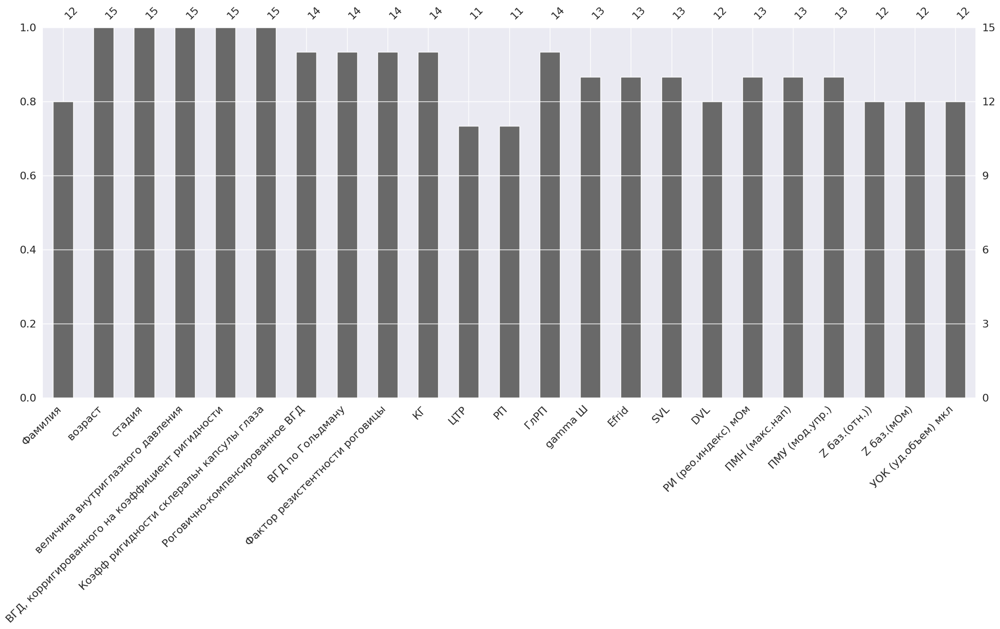

In [ ]:
msno.bar(data_1_stage)

<Axes: >

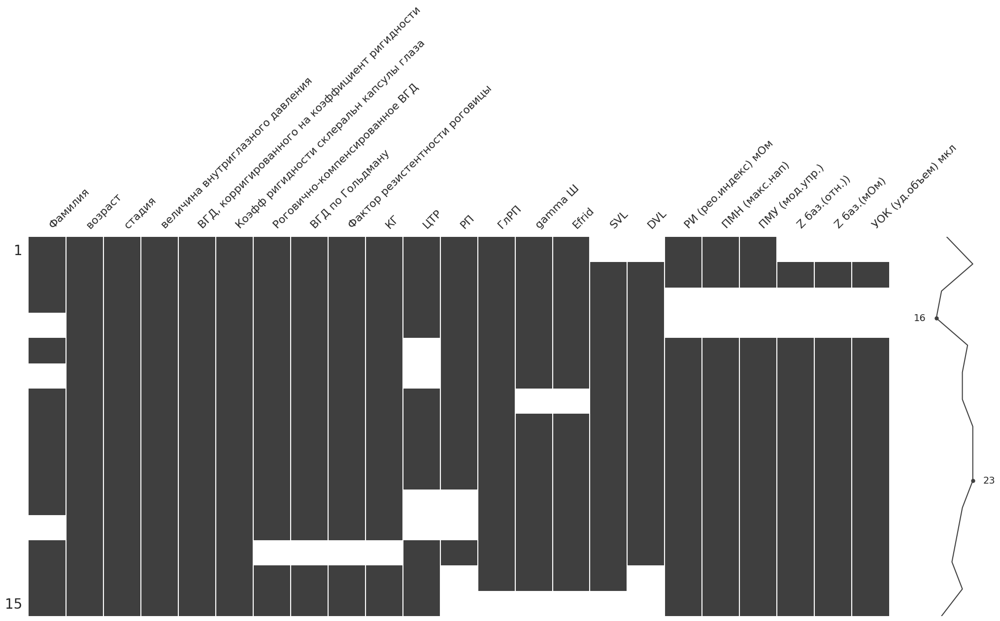

In [ ]:
#матрица пропущенных значений
msno.matrix(data_1_stage)

Выяснили, что пропуски носят случайный характер. Приступаем к их заполнению.

Построим **матрицу корреляции пропущенных значений** (nullity correlation matrix).

In [ ]:
tmp_df = data_1_stage.iloc[:, [i for i, n in enumerate(np.var(data_1_stage.isnull(), axis = 'rows')) if n > 0]]
tmp_df.isnull().corr()

,Фамилия,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР,РП,ГлРП,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
Фамилия,1.000000,-0.133631,-0.133631,-0.133631,-0.133631,0.452267,0.075378,-0.133631,-0.196116,-0.196116,-0.196116,-0.250000,0.294174,0.294174,0.294174,0.166667,0.166667,0.166667
Роговично-компенсированное ВГД,-0.133631,1.000000,1.000000,1.000000,1.000000,-0.161165,-0.161165,-0.071429,-0.104828,-0.104828,-0.104828,-0.133631,-0.104828,-0.104828,-0.104828,-0.133631,-0.133631,-0.133631
ВГД по Гольдману,-0.133631,1.000000,1.000000,1.000000,1.000000,-0.161165,-0.161165,-0.071429,-0.104828,-0.104828,-0.104828,-0.133631,-0.104828,-0.104828,-0.104828,-0.133631,-0.133631,-0.133631
Фактор резистентности роговицы,-0.133631,1.000000,1.000000,1.000000,1.000000,-0.161165,-0.161165,-0.071429,-0.104828,-0.104828,-0.104828,-0.133631,-0.104828,-0.104828,-0.104828,-0.133631,-0.133631,-0.133631
КГ,-0.133631,1.000000,1.000000,1.000000,1.000000,-0.161165,-0.161165,-0.071429,-0.104828,-0.104828,-0.104828,-0.133631,-0.104828,-0.104828,-0.104828,-0.133631,-0.133631,-0.133631
ЦТР,0.452267,-0.161165,-0.161165,-0.161165,-0.161165,1.000000,0.318182,-0.161165,-0.236525,-0.236525,-0.236525,-0.301511,-0.236525,-0.236525,-0.236525,-0.301511,-0.301511,-0.301511
РП,0.075378,-0.161165,-0.161165,-0.161165,-0.161165,0.318182,1.000000,0.443203,0.206959,0.206959,0.206959,0.452267,-0.236525,-0.236525,-0.236525,-0.301511,-0.301511,-0.301511
ГлРП,-0.133631,-0.071429,-0.071429,-0.071429,-0.071429,-0.161165,0.443203,1.000000,0.681385,0.681385,0.681385,0.534522,-0.104828,-0.104828,-0.104828,-0.133631,-0.133631,-0.133631
gamma Ш,-0.196116,-0.104828,-0.104828,-0.104828,-0.104828,-0.236525,0.206959,0.681385,1.000000,1.000000,0.423077,0.294174,-0.153846,-0.153846,-0.153846,-0.196116,-0.196116,-0.196116
Efrid,-0.196116,-0.104828,-0.104828,-0.104828,-0.104828,-0.236525,0.206959,0.681385,1.000000,1.000000,0.423077,0.294174,-0.153846,-0.153846,-0.153846,-0.196116,-0.196116,-0.196116


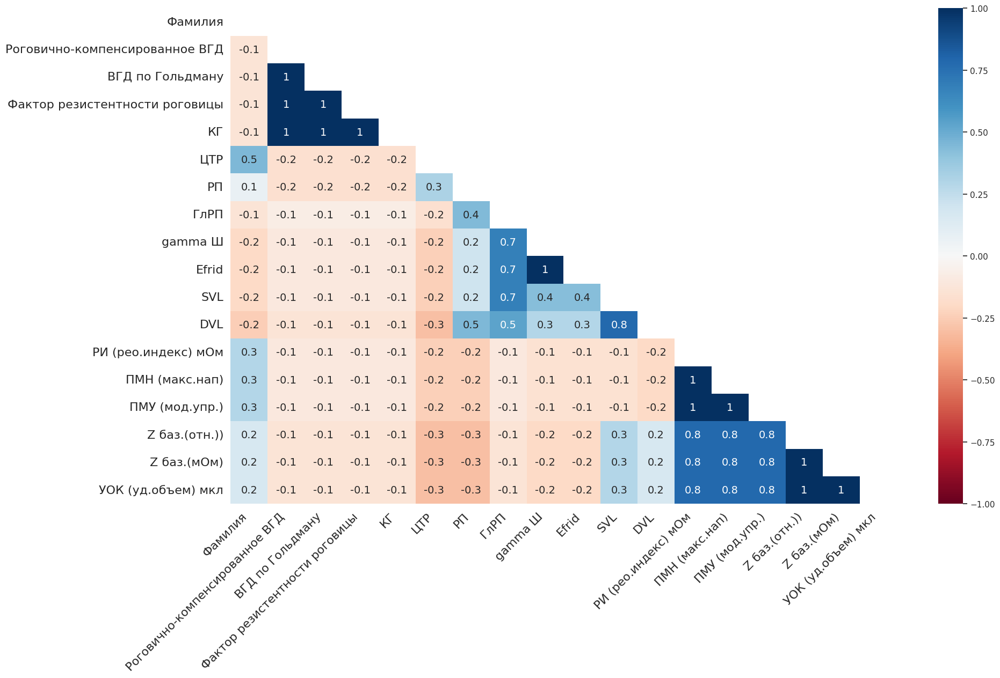

In [ ]:
msno.heatmap(data_1_stage);

### Заполняем пропуски в категориальных признаках



---


Фамилия - категориальный признак. Заполним значением по умолчанию, например, "Иванов"

In [ ]:
data_1_stage['Фамилия']=data_1_stage['Фамилия'].fillna('Иванов')
data_1_stage.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,1
ВГД по Гольдману,1
Фактор резистентности роговицы,1
КГ,1


### Заполняем пропуски в количественных признаках



---

Остальные пропущенные значения принадлежат количественным признакам.

Можно заменить медианой.

In [ ]:
# скопируем датафрейм
median_imputer = data_1_stage.copy()

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
print('Роговично-компенсированное ВГД - ', median_imputer['Роговично-компенсированное ВГД'].mean().round(1), '  ', median_imputer['Роговично-компенсированное ВГД'].median())
print('ВГД по Гольдману - ', median_imputer['ВГД по Гольдману'].mean().round(1), '  ', median_imputer['ВГД по Гольдману'].median())
print('Фактор резистентности роговицы - ', median_imputer['Фактор резистентности роговицы'].mean().round(1), '  ', median_imputer['Фактор резистентности роговицы'].median())
print('КГ - ', median_imputer['КГ'].mean().round(1), '  ', median_imputer['КГ'].median())
print('ЦТР - ', median_imputer['ЦТР'].mean().round(1), '  ', median_imputer['ЦТР'].median())
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



Роговично-компенсированное ВГД -  19.0    19.35
ВГД по Гольдману -  17.7    17.15
Фактор резистентности роговицы -  10.2    9.95
КГ -  9.4    9.3
ЦТР -  550.8    562.0
РП -  205.5    205.0
ГлРП -  432.6    437.5
gamma Ш -  1.5    1.8
Efrid -  0.0    0.0147
SVL -  50.2    50.5
DVL -  41.6    42.04
РИ (рео.индекс) мОм -  53.1    58.89
ПМН (макс.нап) -  0.2    0.23
ПМУ (мод.упр.) -  0.3    0.26
Z баз.(отн.)) -  922.3    956.0
Z баз.(мОм) -  36.9    38.24
УОК (уд.объем) мкл -  1.5    1.3537174676972055


In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['Роговично-компенсированное ВГД'] = imp_median.fit_transform(median_imputer[['Роговично-компенсированное ВГД']])
median_imputer['ВГД по Гольдману'] = imp_median.fit_transform(median_imputer[['ВГД по Гольдману']])
median_imputer['Фактор резистентности роговицы'] = imp_median.fit_transform(median_imputer[['Фактор резистентности роговицы']])
median_imputer['КГ'] = imp_median.fit_transform(median_imputer[['КГ']])
median_imputer['ЦТР'] = imp_median.fit_transform(median_imputer[['ЦТР']])
median_imputer['РП'] = imp_median.fit_transform(median_imputer[['РП']])
median_imputer['ГлРП'] = imp_median.fit_transform(median_imputer[['ГлРП']])
median_imputer['gamma Ш'] = imp_median.fit_transform(median_imputer[['gamma Ш']])
median_imputer['Efrid'] = imp_median.fit_transform(median_imputer[['Efrid']])
median_imputer['SVL'] = imp_median.fit_transform(median_imputer[['SVL']])
median_imputer['DVL'] = imp_median.fit_transform(median_imputer[['DVL']])
median_imputer['РИ (рео.индекс) мОм'] = imp_median.fit_transform(median_imputer[['РИ (рео.индекс) мОм']])
median_imputer['ПМН (макс.нап)'] = imp_median.fit_transform(median_imputer[['ПМН (макс.нап)']])
median_imputer['ПМУ (мод.упр.)'] = imp_median.fit_transform(median_imputer[['ПМУ (мод.упр.)']])
median_imputer['Z баз.(отн.))'] = imp_median.fit_transform(median_imputer[['Z баз.(отн.))']])
median_imputer['Z баз.(мОм)'] = imp_median.fit_transform(median_imputer[['Z баз.(мОм)']])
median_imputer['УОК (уд.объем) мкл'] = imp_median.fit_transform(median_imputer[['УОК (уд.объем) мкл']])

# убедимся, что пропущенных значений не осталось
median_imputer['УОК (уд.объем) мкл'].isna().sum()

0

In [ ]:
# посмотрим на метрики после заполнения медианой
print('Роговично-компенсированное ВГД - ', median_imputer['Роговично-компенсированное ВГД'].mean().round(1), '  ', median_imputer['Роговично-компенсированное ВГД'].median())
print('ВГД по Гольдману - ', median_imputer['ВГД по Гольдману'].mean().round(1), '  ', median_imputer['ВГД по Гольдману'].median())
print('Фактор резистентности роговицы - ', median_imputer['Фактор резистентности роговицы'].mean().round(1), '  ', median_imputer['Фактор резистентности роговицы'].median())
print('КГ - ', median_imputer['КГ'].mean().round(1), '  ', median_imputer['КГ'].median())
print('ЦТР - ', median_imputer['ЦТР'].mean().round(1), '  ', median_imputer['ЦТР'].median())
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



Роговично-компенсированное ВГД -  19.0    19.35
ВГД по Гольдману -  17.7    17.15
Фактор резистентности роговицы -  10.2    9.95
КГ -  9.4    9.3
ЦТР -  553.8    562.0
РП -  205.3    205.0
ГлРП -  432.9    437.5
gamma Ш -  1.6    1.8
Efrid -  0.0    0.0147
SVL -  50.3    50.5
DVL -  41.7    42.04
РИ (рео.индекс) мОм -  53.9    58.89
ПМН (макс.нап) -  0.2    0.23
ПМУ (мод.упр.) -  0.3    0.26
Z баз.(отн.)) -  929.1    956.0
Z баз.(мОм) -  37.2    38.24
УОК (уд.объем) мкл -  1.5    1.3537174676972055


Проверяем, что заполнили все пропуски.

In [ ]:
median_imputer.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


### Сравниваем взаимосвязь признаков до и после заполнения пропусков

In [ ]:
corr_matrix_before=data_1_stage.iloc [:, 1:11].corr().round(3)

<Axes: >

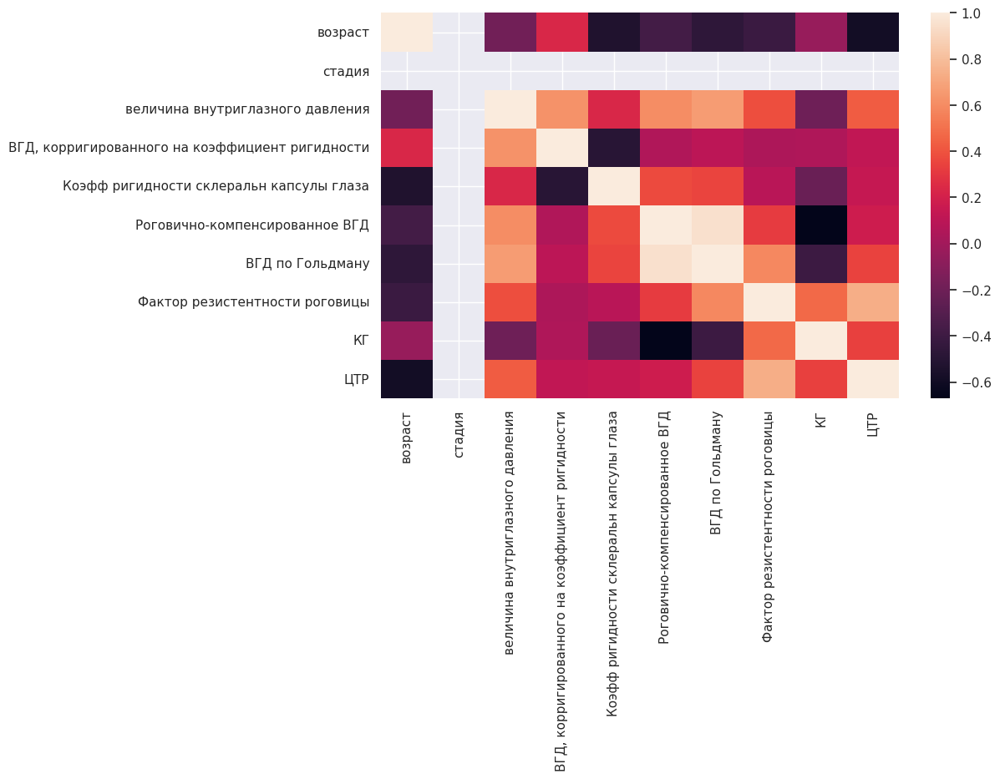

In [ ]:
sns.heatmap(corr_matrix_before)

In [ ]:
corr_matrix_after=median_imputer.iloc [:, 1:11].corr().round(3)

<Axes: >

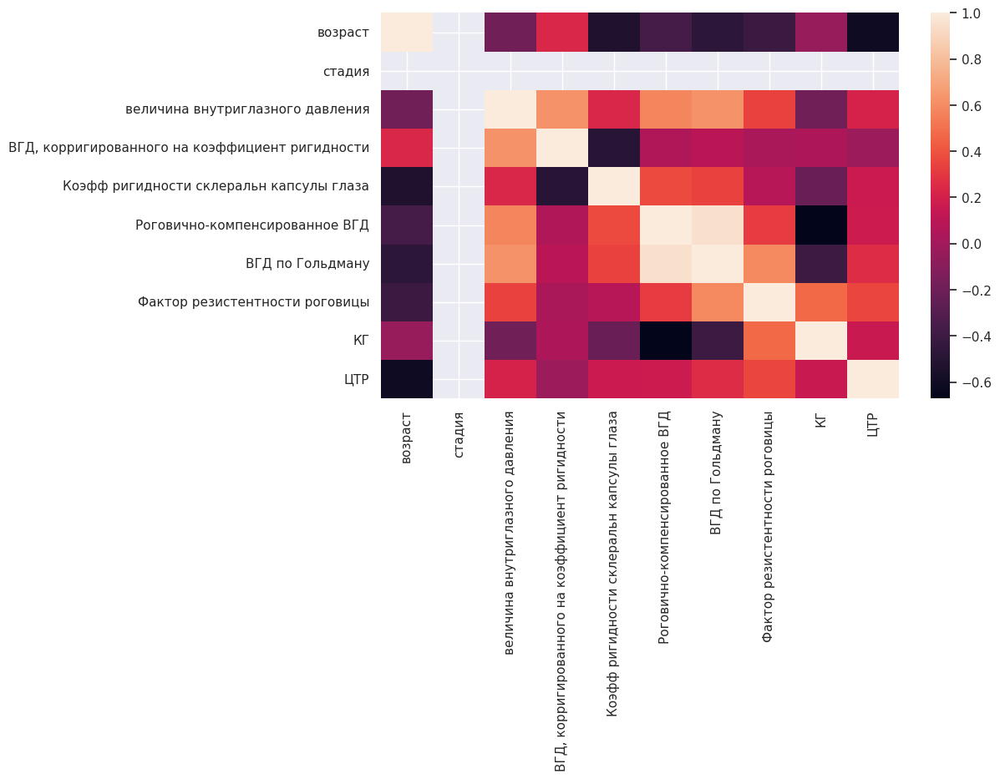

In [ ]:
sns.heatmap(corr_matrix_after)

In [ ]:
changes_in_corr=corr_matrix_before-corr_matrix_after

In [ ]:
changes_in_corr

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР
возраст,0.000,NaN,0.000,0.000,0.000,-0.001,0.001,0.002,0.001,0.020
стадия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
величина внутриглазного давления,0.000,NaN,0.000,0.000,0.000,0.020,0.041,0.034,-0.005,0.217
"ВГД, корригированного на коэффициент ригидности",0.000,NaN,0.000,0.000,0.000,-0.003,0.007,0.009,0.003,0.146
Коэфф ригидности склеральн капсулы глаза,0.000,NaN,0.000,0.000,0.000,0.000,0.005,0.005,0.000,-0.019
Роговично-компенсированное ВГД,-0.001,NaN,0.020,-0.003,0.000,0.000,0.001,0.002,0.000,0.008
ВГД по Гольдману,0.001,NaN,0.041,0.007,0.005,0.001,0.000,-0.001,0.000,0.085
Фактор резистентности роговицы,0.002,NaN,0.034,0.009,0.005,0.002,-0.001,0.000,0.000,0.378
КГ,0.001,NaN,-0.005,0.003,0.000,0.000,0.000,0.000,0.000,0.181
ЦТР,0.020,NaN,0.217,0.146,-0.019,0.008,0.085,0.378,0.181,0.000


<Axes: >

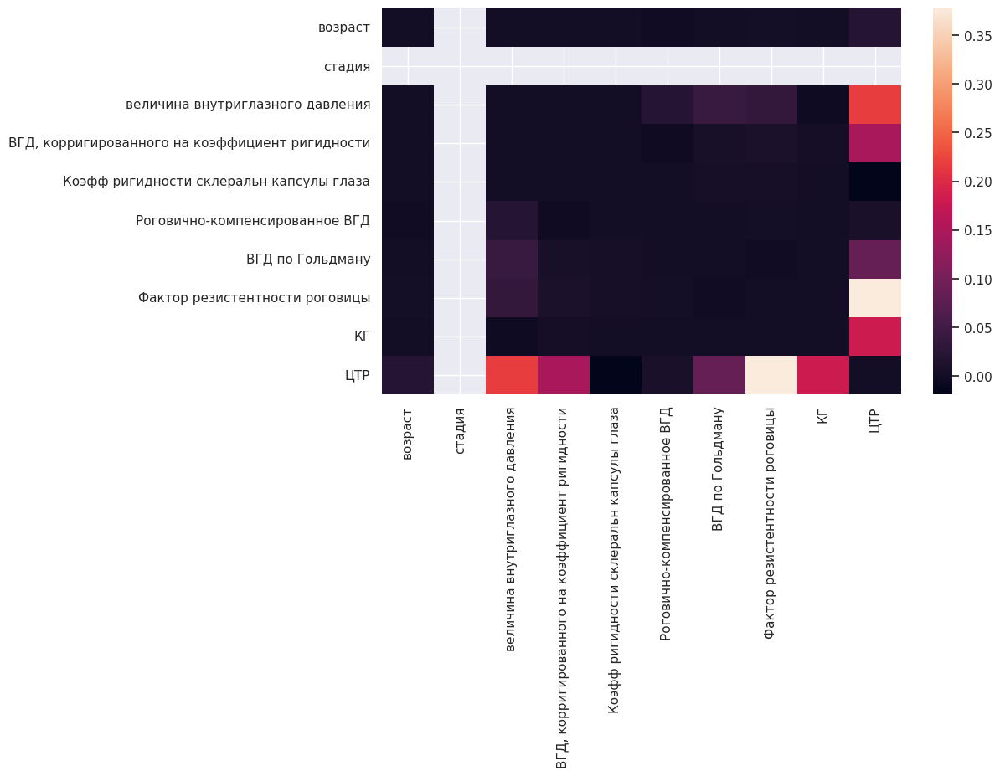

In [ ]:
sns.heatmap(changes_in_corr)

In [ ]:
data_1_stage=median_imputer

## Работа с пропущенными значениями в таблице с пациентами **2 стадии заболевания**

In [ ]:
data_2_stage

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,горнева,84,2,13,17,0.0132,16.2,14.1,8.8,9.0,...,1.65,0.0132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,64,2,19,24,0.0127,15.7,15.7,10.0,10.0,...,1.65,0.0127,44.11,32.11,NaN,NaN,NaN,NaN,NaN,NaN
2,близнюк,70,2,11,11,0.0214,19.8,18.0,9.9,8.9,...,2.40,0.0343,51.47,47.28,43.37,0.11,0.26,960.0,38.40,1.031167
3,NaN,68,2,11,12,0.0190,17.1,14.0,8.1,8.2,...,0.70,0.0190,50.96,41.77,33.20,0.71,0.75,925.0,37.00,0.819232
4,митина,80,2,17,21,0.0146,23.5,21.0,9.9,7.9,...,1.75,0.0146,44.14,29.78,27.39,0.16,0.19,1080.0,43.20,0.578867
5,якубова,71,2,15,20,0.0133,26.5,25.7,12.1,8.8,...,1.70,0.0133,47.36,36.07,NaN,NaN,NaN,NaN,NaN,NaN
6,емельянова,77,2,16,17,0.0199,20.2,18.0,9.6,8.6,...,2.00,0.0199,NaN,NaN,29.34,0.26,0.28,911.0,36.44,0.735110
7,Мациева,68,2,17,12,0.0325,22.6,19.4,9.0,7.4,...,2.30,0.0325,NaN,NaN,44.28,0.08,0.09,878.0,35.12,1.151129
8,Попова,80,2,14,14,0.0204,24.3,19.9,8.1,6.1,...,NaN,0.0204,49.31,NaN,11.36,0.12,0.27,766.0,30.64,0.338501
9,NaN,72,2,18,25,0.0092,20.7,19.6,10.7,9.3,...,1.45,0.0092,NaN,NaN,58.26,0.18,0.23,947.0,37.88,1.404207


In [ ]:
#посмотрим сколько пропущенных значений в данных
data_2_stage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Фамилия                                          10 non-null     object 
 1   возраст                                          15 non-null     int64  
 2   стадия                                           15 non-null     int64  
 3   величина внутриглазного давления                 15 non-null     int64  
 4   ВГД, корригированного на коэффициент ригидности  15 non-null     int64  
 5   Коэфф ригидности склеральн капсулы глаза         15 non-null     float64
 6   Роговично-компенсированное ВГД                   15 non-null     float64
 7   ВГД по Гольдману                                 15 non-null     float64
 8   Фактор резистентности роговицы                   15 non-null     float64
 9   КГ                                

In [ ]:
data_2_stage.isnull().sum()

,0
Фамилия,5
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


Рассчитаем процент пропусков

In [ ]:
(data_2_stage.isna().sum() / len(data_2_stage)).round(4) * 100

,0
Фамилия,33.33
возраст,0.00
стадия,0.00
величина внутриглазного давления,0.00
"ВГД, корригированного на коэффициент ригидности",0.00
Коэфф ригидности склеральн капсулы глаза,0.00
Роговично-компенсированное ВГД,0.00
ВГД по Гольдману,0.00
Фактор резистентности роговицы,0.00
КГ,0.00


Вывод: пропуски есть по 13 признакам из 23, процент пропущенных данных в основном около 20%. На основе этого становится понятно, что удалять данные с пропущенными значениями - неподходящий способ в данной ситуации.

<Axes: >

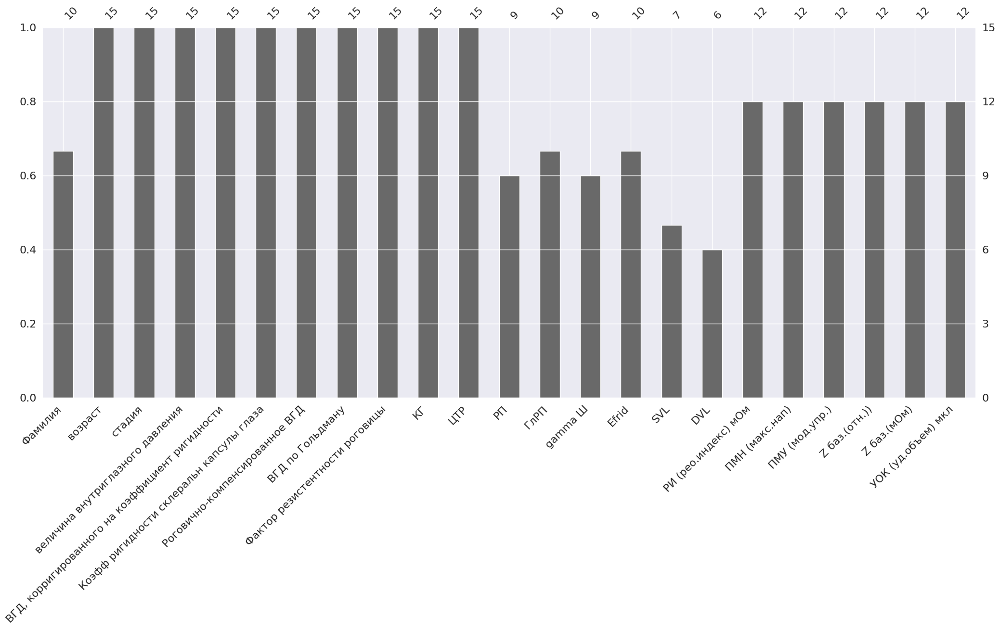

In [ ]:
msno.bar(data_2_stage)

<Axes: >

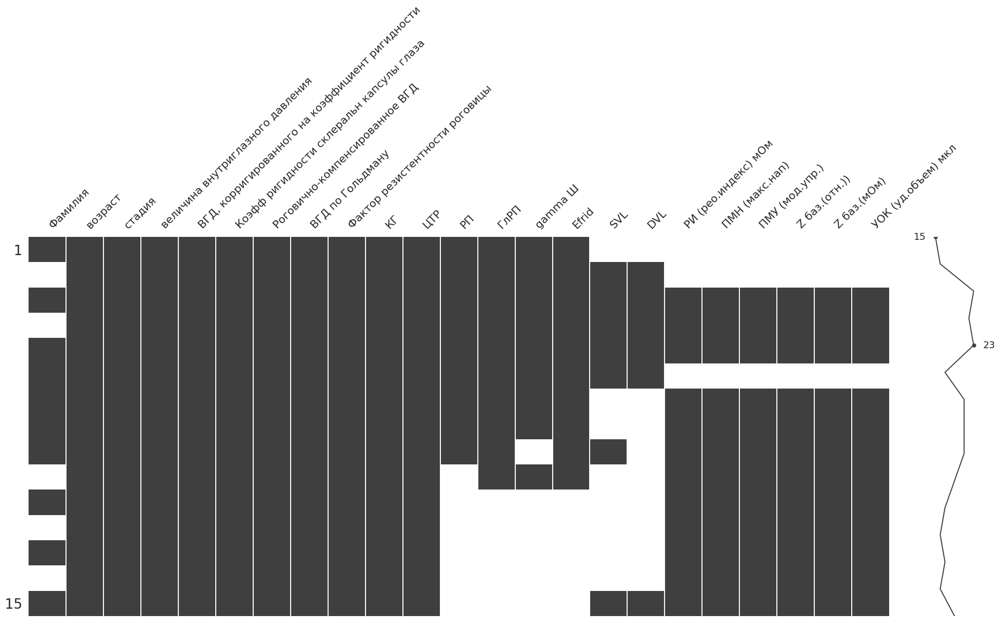

In [ ]:
#матрица пропущенных значений
msno.matrix(data_2_stage)

Выяснили, что пропуски носят случайный характер. Приступаем к их заполнению.

Построим **матрицу корреляции пропущенных значений** (nullity correlation matrix).

In [ ]:
tmp_df = data_2_stage.iloc[:, [i for i, n in enumerate(np.var(data_2_stage.isnull(), axis = 'rows')) if n > 0]]
tmp_df.isnull().corr()

,Фамилия,РП,ГлРП,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
Фамилия,1.000000e+00,0.288675,0.100000,-5.608641e-17,0.100000,0.094491,-8.012345e-17,7.850462e-17,7.850462e-17,7.850462e-17,7.850462e-17,7.850462e-17,7.850462e-17
РП,2.886751e-01,1.000000,0.866025,7.222222e-01,0.866025,0.490990,3.888889e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01
ГлРП,1.000000e-01,0.866025,1.000000,8.660254e-01,1.000000,0.377964,2.886751e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01
gamma Ш,-5.608641e-17,0.722222,0.866025,1.000000e+00,0.866025,0.218218,3.888889e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01,-4.082483e-01
Efrid,1.000000e-01,0.866025,1.000000,8.660254e-01,1.000000,0.377964,2.886751e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01,-3.535534e-01
SVL,9.449112e-02,0.490990,0.377964,2.182179e-01,0.377964,1.000000,8.728716e-01,-2.004459e-01,-2.004459e-01,-2.004459e-01,-2.004459e-01,-2.004459e-01,-2.004459e-01
DVL,-8.012345e-17,0.388889,0.288675,3.888889e-01,0.288675,0.872872,1.000000e+00,-2.721655e-01,-2.721655e-01,-2.721655e-01,-2.721655e-01,-2.721655e-01,-2.721655e-01
РИ (рео.индекс) мОм,7.850462e-17,-0.408248,-0.353553,-4.082483e-01,-0.353553,-0.200446,-2.721655e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
ПМН (макс.нап),7.850462e-17,-0.408248,-0.353553,-4.082483e-01,-0.353553,-0.200446,-2.721655e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
ПМУ (мод.упр.),7.850462e-17,-0.408248,-0.353553,-4.082483e-01,-0.353553,-0.200446,-2.721655e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


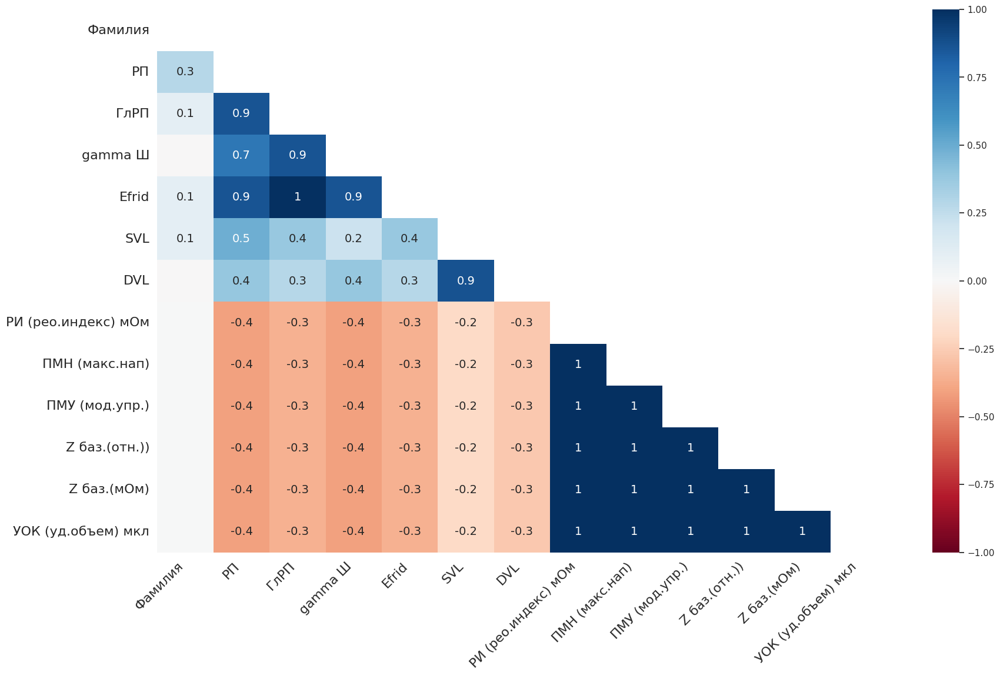

In [ ]:
msno.heatmap(data_2_stage);

### Заполняем пропуски в категориальных признаках



---


Фамилия - категориальный признак. Заполним значением по умолчанию, например, "Иванов"

In [ ]:
data_2_stage['Фамилия']=data_2_stage['Фамилия'].fillna('Иванов')
data_2_stage.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


### Заполняем пропуски в количественных признаках



---

Остальные пропущенные значения принадлежат количественным признакам.

Можно заменить медианой.

In [ ]:
# скопируем датафрейм
median_imputer = data_2_stage.copy()

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



РП -  201.9    195.0
ГлРП -  449.2    443.0
gamma Ш -  1.7    1.7
Efrid -  0.0    0.0168
SVL -  45.4    47.36
DVL -  37.3    36.519999999999996
РИ (рео.индекс) мОм -  42.4    38.285
ПМН (макс.нап) -  0.3    0.26
ПМУ (мод.упр.) -  0.3    0.275
Z баз.(отн.)) -  820.4    894.0
Z баз.(мОм) -  32.8    35.76
УОК (уд.объем) мкл -  1.4    1.017857176278794


In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['РП'] = imp_median.fit_transform(median_imputer[['РП']])
median_imputer['ГлРП'] = imp_median.fit_transform(median_imputer[['ГлРП']])
median_imputer['gamma Ш'] = imp_median.fit_transform(median_imputer[['gamma Ш']])
median_imputer['Efrid'] = imp_median.fit_transform(median_imputer[['Efrid']])
median_imputer['SVL'] = imp_median.fit_transform(median_imputer[['SVL']])
median_imputer['DVL'] = imp_median.fit_transform(median_imputer[['DVL']])
median_imputer['РИ (рео.индекс) мОм'] = imp_median.fit_transform(median_imputer[['РИ (рео.индекс) мОм']])
median_imputer['ПМН (макс.нап)'] = imp_median.fit_transform(median_imputer[['ПМН (макс.нап)']])
median_imputer['ПМУ (мод.упр.)'] = imp_median.fit_transform(median_imputer[['ПМУ (мод.упр.)']])
median_imputer['Z баз.(отн.))'] = imp_median.fit_transform(median_imputer[['Z баз.(отн.))']])
median_imputer['Z баз.(мОм)'] = imp_median.fit_transform(median_imputer[['Z баз.(мОм)']])
median_imputer['УОК (уд.объем) мкл'] = imp_median.fit_transform(median_imputer[['УОК (уд.объем) мкл']])

# убедимся, что пропущенных значений не осталось
median_imputer['УОК (уд.объем) мкл'].isna().sum()

0

In [ ]:
# посмотрим на метрики после заполнения медианой
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



РП -  199.1    195.0
ГлРП -  447.1    443.0
gamma Ш -  1.7    1.7
Efrid -  0.0    0.0168
SVL -  46.4    47.36
DVL -  36.8    36.519999999999996
РИ (рео.индекс) мОм -  41.6    38.285
ПМН (макс.нап) -  0.3    0.26
ПМУ (мод.упр.) -  0.3    0.275
Z баз.(отн.)) -  835.1    894.0
Z баз.(мОм) -  33.4    35.76
УОК (уд.объем) мкл -  1.3    1.017857176278794


Проверяем, что заполнили все пропуски.

In [ ]:
median_imputer.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


### Сравниваем взаимосвязь признаков до и после заполнения пропусков

In [ ]:
corr_matrix_before=data_2_stage.iloc [:, 1:11].corr().round(3)

<Axes: >

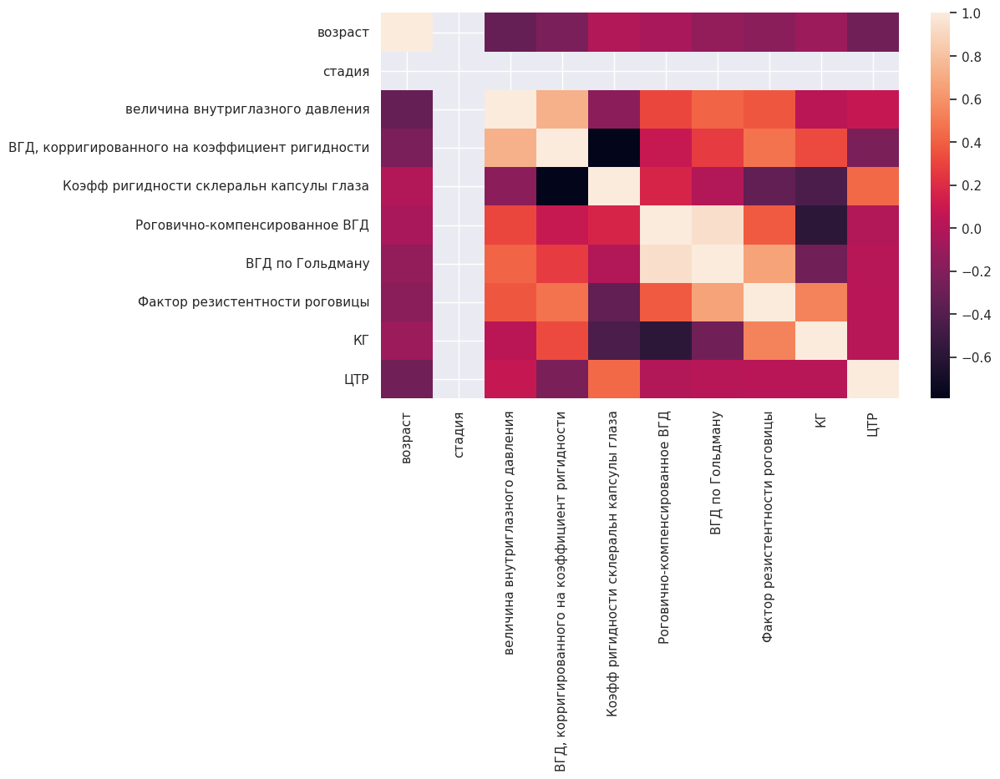

In [ ]:
sns.heatmap(corr_matrix_before)

In [ ]:
corr_matrix_after=median_imputer.iloc [:, 1:11].corr().round(3)

<Axes: >

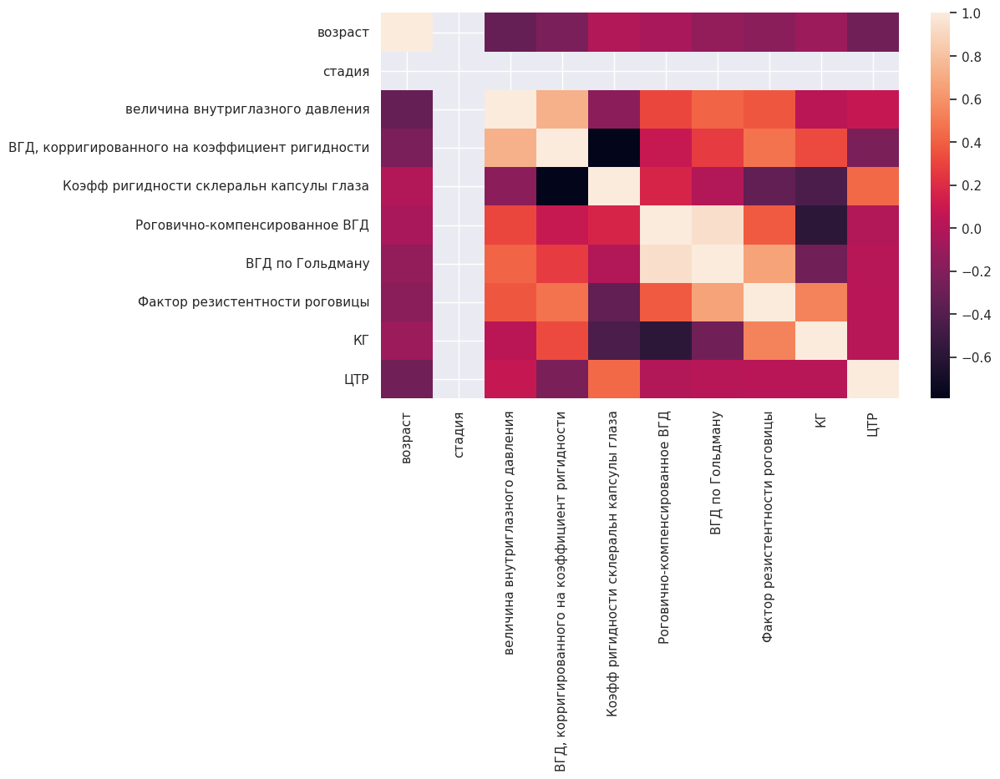

In [ ]:
sns.heatmap(corr_matrix_after)

In [ ]:
changes_in_corr=corr_matrix_before-corr_matrix_after

In [ ]:
changes_in_corr

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР
возраст,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
стадия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
величина внутриглазного давления,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"ВГД, корригированного на коэффициент ригидности",0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Коэфф ригидности склеральн капсулы глаза,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Роговично-компенсированное ВГД,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ВГД по Гольдману,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Фактор резистентности роговицы,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
КГ,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ЦТР,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: >

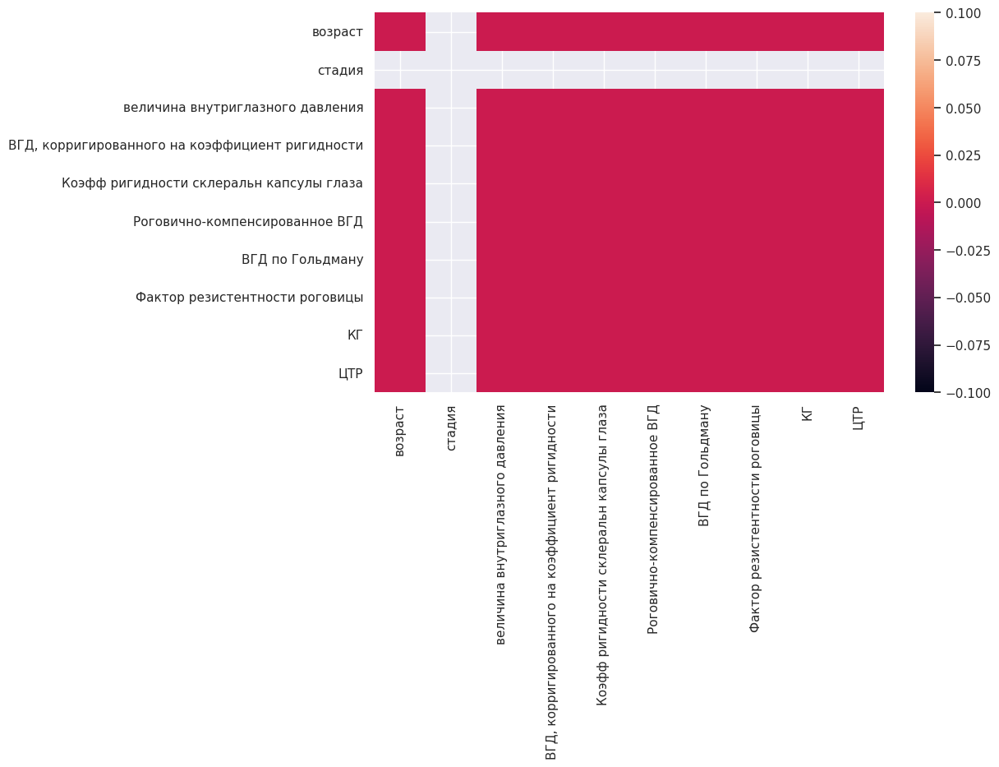

In [ ]:
sns.heatmap(changes_in_corr)

In [ ]:
data_2_stage=median_imputer

In [ ]:
data_2_stage

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,горнева,84,2,13,17,0.0132,16.2,14.1,8.8,9.0,...,1.65,0.0132,47.36,36.52,38.285,0.26,0.275,894.0,35.76,1.017857
1,Иванов,64,2,19,24,0.0127,15.7,15.7,10.0,10.0,...,1.65,0.0127,44.11,32.11,38.285,0.26,0.275,894.0,35.76,1.017857
2,близнюк,70,2,11,11,0.0214,19.8,18.0,9.9,8.9,...,2.40,0.0343,51.47,47.28,43.370,0.11,0.260,960.0,38.40,1.031167
3,Иванов,68,2,11,12,0.0190,17.1,14.0,8.1,8.2,...,0.70,0.0190,50.96,41.77,33.200,0.71,0.750,925.0,37.00,0.819232
4,митина,80,2,17,21,0.0146,23.5,21.0,9.9,7.9,...,1.75,0.0146,44.14,29.78,27.390,0.16,0.190,1080.0,43.20,0.578867
5,якубова,71,2,15,20,0.0133,26.5,25.7,12.1,8.8,...,1.70,0.0133,47.36,36.07,38.285,0.26,0.275,894.0,35.76,1.017857
6,емельянова,77,2,16,17,0.0199,20.2,18.0,9.6,8.6,...,2.00,0.0199,47.36,36.52,29.340,0.26,0.280,911.0,36.44,0.735110
7,Мациева,68,2,17,12,0.0325,22.6,19.4,9.0,7.4,...,2.30,0.0325,47.36,36.52,44.280,0.08,0.090,878.0,35.12,1.151129
8,Попова,80,2,14,14,0.0204,24.3,19.9,8.1,6.1,...,1.70,0.0204,49.31,36.52,11.360,0.12,0.270,766.0,30.64,0.338501
9,Иванов,72,2,18,25,0.0092,20.7,19.6,10.7,9.3,...,1.45,0.0092,47.36,36.52,58.260,0.18,0.230,947.0,37.88,1.404207


## Работа с пропущенными значениями в таблице с пациентами **3 стадии заболевания**

In [ ]:
data_3_stage

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,клычникова,68,3,13,7,0.0365,24.9,19.5,7.3,5.3,...,2.40,0.0365,49.90,43.40,NaN,NaN,NaN,NaN,NaN,NaN
1,кадушкин,68,3,15,11,0.0306,20.7,16.5,8.0,7.1,...,3.55,0.0306,49.31,39.83,15.10,0.04,0.08,917.0,36.68,0.375853
2,якубова,71,3,22,21,0.0227,26.0,23.8,10.6,7.7,...,2.20,0.0227,45.52,43.11,25.43,0.27,0.26,811.0,32.44,0.715709
3,певзнер,74,3,22,23,0.0205,20.9,18.9,9.9,8.6,...,1.95,0.0205,42.12,26.86,15.48,0.11,0.13,822.0,32.88,0.429843
4,Хохлова,64,3,14,14,0.0201,19.3,18.3,10.5,9.6,...,NaN,NaN,NaN,NaN,16.72,0.07,0.09,888.0,35.52,0.429768
5,NaN,64,3,13,10,0.0315,19.6,18.6,10.6,9.5,...,NaN,NaN,NaN,NaN,38.82,0.08,0.09,872.0,34.88,1.016131
6,Соловьева Е.,72,3,16,12,0.0306,20.0,18.0,8.7,7.6,...,NaN,NaN,NaN,NaN,49.61,0.09,0.14,877.0,35.08,1.291161
7,Зайченко,76,3,17,16,0.0246,23.1,17.1,6.5,5.1,...,NaN,NaN,NaN,NaN,57.32,0.75,0.66,410.0,16.40,3.191046
8,Вакалова,80,3,16,11,0.0347,21.0,17.8,8.7,7.6,...,NaN,NaN,28.82,38.87,26.61,0.15,0.16,483.0,19.32,1.257502
9,Колесова,67,3,18,17,0.0227,19.0,20.5,8.5,7.7,...,2.20,0.0227,42.70,40.10,25.43,0.27,0.26,811.0,32.44,0.715709


In [ ]:
#посмотрим сколько пропущенных значений в данных
data_3_stage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 23 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Фамилия                                          9 non-null      object 
 1   возраст                                          10 non-null     int64  
 2   стадия                                           10 non-null     int64  
 3   величина внутриглазного давления                 10 non-null     int64  
 4   ВГД, корригированного на коэффициент ригидности  10 non-null     int64  
 5   Коэфф ригидности склеральн капсулы глаза         10 non-null     float64
 6   Роговично-компенсированное ВГД                   10 non-null     float64
 7   ВГД по Гольдману                                 10 non-null     float64
 8   Фактор резистентности роговицы                   10 non-null     float64
 9   КГ                                 

In [ ]:
data_3_stage.isnull().sum()

,0
Фамилия,1
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


Рассчитаем процент пропусков

In [ ]:
(data_3_stage.isna().sum() / len(data_3_stage)).round(4) * 100

,0
Фамилия,10.0
возраст,0.0
стадия,0.0
величина внутриглазного давления,0.0
"ВГД, корригированного на коэффициент ригидности",0.0
Коэфф ригидности склеральн капсулы глаза,0.0
Роговично-компенсированное ВГД,0.0
ВГД по Гольдману,0.0
Фактор резистентности роговицы,0.0
КГ,0.0


Вывод: пропуски есть по 14 признакам из 23, процент пропущенных данных в основном от 10% до 50%. На основе этого становится понятно, что удалять данные с пропущенными значениями - неподходящий способ в данной ситуации.

<Axes: >

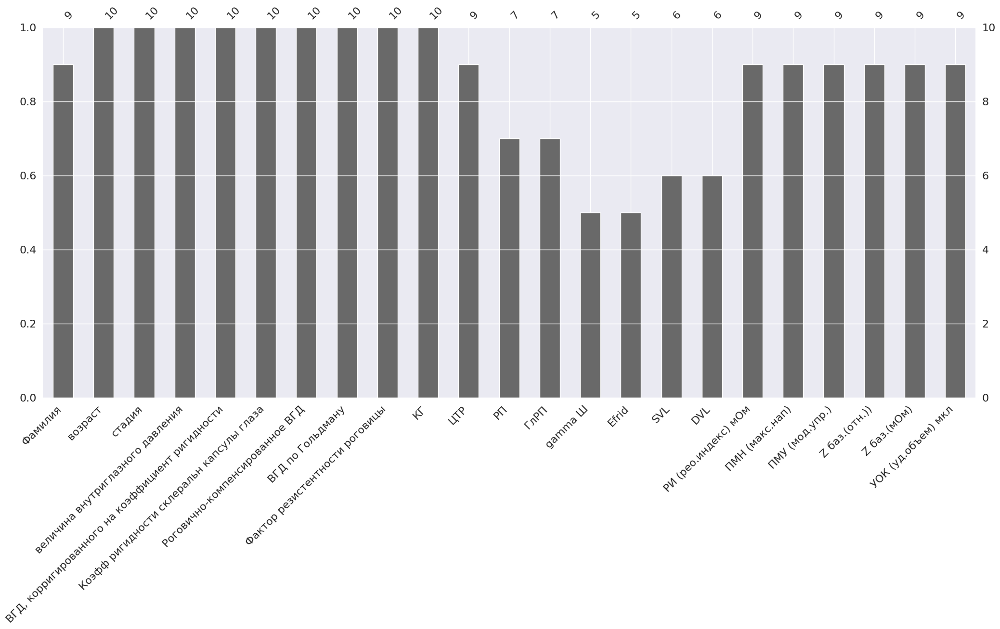

In [ ]:
msno.bar(data_3_stage)

<Axes: >

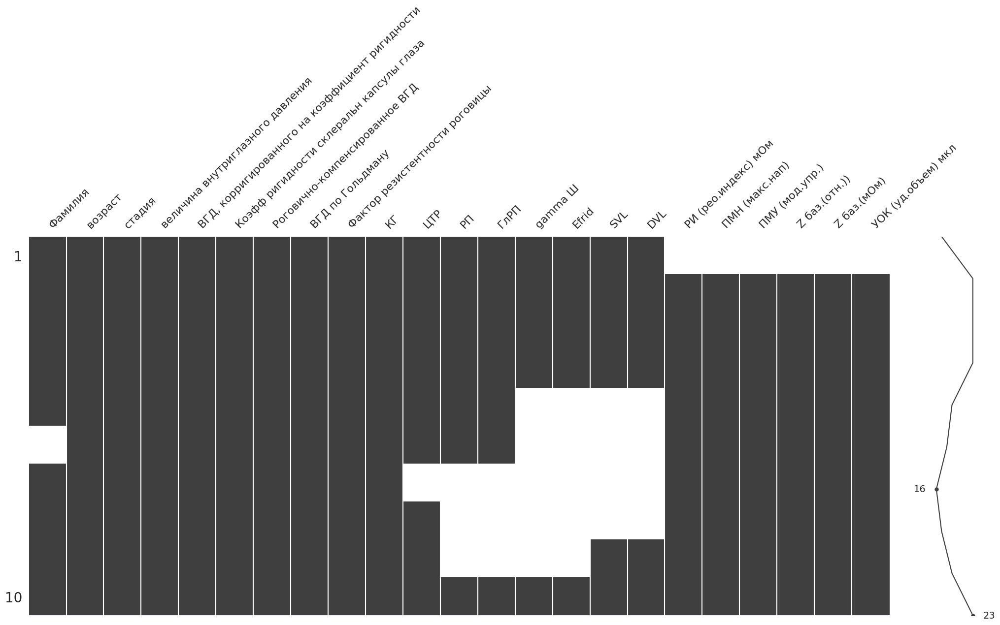

In [ ]:
#матрица пропущенных значений
msno.matrix(data_3_stage)

Выяснили, что пропуски носят случайный характер. Приступаем к их заполнению.

Построим **матрицу корреляции пропущенных значений** (nullity correlation matrix).

In [ ]:
tmp_df = data_3_stage.iloc[:, [i for i, n in enumerate(np.var(data_3_stage.isnull(), axis = 'rows')) if n > 0]]
tmp_df.isnull().corr()

,Фамилия,ЦТР,РП,ГлРП,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
Фамилия,1.000000,-0.111111,-0.218218,-0.218218,0.333333,0.333333,0.408248,0.408248,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111
ЦТР,-0.111111,1.000000,0.509175,0.509175,0.333333,0.333333,0.408248,0.408248,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111,-0.111111
РП,-0.218218,0.509175,1.000000,1.000000,0.654654,0.654654,0.356348,0.356348,-0.218218,-0.218218,-0.218218,-0.218218,-0.218218,-0.218218
ГлРП,-0.218218,0.509175,1.000000,1.000000,0.654654,0.654654,0.356348,0.356348,-0.218218,-0.218218,-0.218218,-0.218218,-0.218218,-0.218218
gamma Ш,0.333333,0.333333,0.654654,0.654654,1.000000,1.000000,0.816497,0.816497,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333
Efrid,0.333333,0.333333,0.654654,0.654654,1.000000,1.000000,0.816497,0.816497,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333
SVL,0.408248,0.408248,0.356348,0.356348,0.816497,0.816497,1.000000,1.000000,-0.272166,-0.272166,-0.272166,-0.272166,-0.272166,-0.272166
DVL,0.408248,0.408248,0.356348,0.356348,0.816497,0.816497,1.000000,1.000000,-0.272166,-0.272166,-0.272166,-0.272166,-0.272166,-0.272166
РИ (рео.индекс) мОм,-0.111111,-0.111111,-0.218218,-0.218218,-0.333333,-0.333333,-0.272166,-0.272166,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ПМН (макс.нап),-0.111111,-0.111111,-0.218218,-0.218218,-0.333333,-0.333333,-0.272166,-0.272166,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


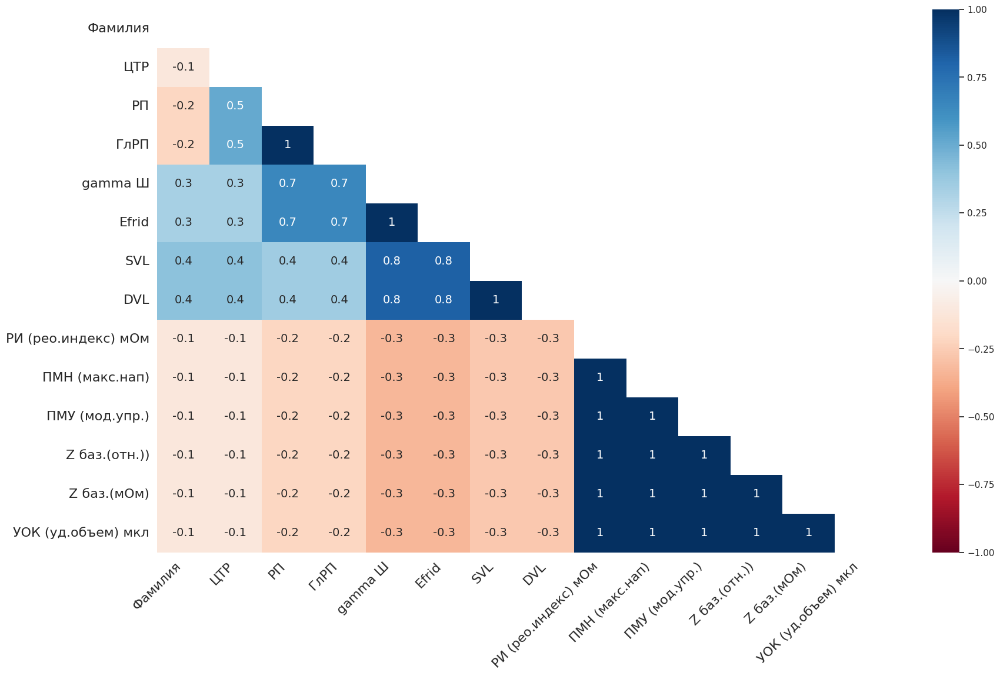

In [ ]:
msno.heatmap(data_3_stage);

### Заполняем пропуски в категориальных признаках



---


Фамилия - категориальный признак. Заполним значением по умолчанию, например, "Иванов"

In [ ]:
data_3_stage['Фамилия']=data_3_stage['Фамилия'].fillna('Иванов')
data_3_stage.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


### Заполняем пропуски в количественных признаках



---

Остальные пропущенные значения принадлежат количественным признакам.

Можно заменить медианой.

In [ ]:
# скопируем датафрейм
median_imputer = data_3_stage.copy()

In [ ]:
#Посмотрим на среднее арифметическое и медиану.
print('ЦТР - ', median_imputer['ЦТР'].mean().round(1), '  ', median_imputer['ЦТР'].median())
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



ЦТР -  532.4    527.0
РП -  176.7    180.0
ГлРП -  534.0    520.0
gamma Ш -  2.5    2.2
Efrid -  0.0    0.0227
SVL -  43.1    44.11
DVL -  38.7    39.965
РИ (рео.индекс) мОм -  30.1    25.43
ПМН (макс.нап) -  0.2    0.11
ПМУ (мод.упр.) -  0.2    0.14
Z баз.(отн.)) -  765.7    822.0
Z баз.(мОм) -  30.6    32.88
УОК (уд.объем) мкл -  1.0    0.7157086929716401


In [ ]:
# создадим объект класса SimpleImputer с параметром strategy = 'median'
imp_median = SimpleImputer(strategy = 'median')

# применим метод .fit_transform() для одновременного обучения модели и заполнения пропусков
median_imputer['ЦТР'] = imp_median.fit_transform(median_imputer[['ЦТР']])
median_imputer['РП'] = imp_median.fit_transform(median_imputer[['РП']])
median_imputer['ГлРП'] = imp_median.fit_transform(median_imputer[['ГлРП']])
median_imputer['gamma Ш'] = imp_median.fit_transform(median_imputer[['gamma Ш']])
median_imputer['Efrid'] = imp_median.fit_transform(median_imputer[['Efrid']])
median_imputer['SVL'] = imp_median.fit_transform(median_imputer[['SVL']])
median_imputer['DVL'] = imp_median.fit_transform(median_imputer[['DVL']])
median_imputer['РИ (рео.индекс) мОм'] = imp_median.fit_transform(median_imputer[['РИ (рео.индекс) мОм']])
median_imputer['ПМН (макс.нап)'] = imp_median.fit_transform(median_imputer[['ПМН (макс.нап)']])
median_imputer['ПМУ (мод.упр.)'] = imp_median.fit_transform(median_imputer[['ПМУ (мод.упр.)']])
median_imputer['Z баз.(отн.))'] = imp_median.fit_transform(median_imputer[['Z баз.(отн.))']])
median_imputer['Z баз.(мОм)'] = imp_median.fit_transform(median_imputer[['Z баз.(мОм)']])
median_imputer['УОК (уд.объем) мкл'] = imp_median.fit_transform(median_imputer[['УОК (уд.объем) мкл']])

# убедимся, что пропущенных значений не осталось
median_imputer['УОК (уд.объем) мкл'].isna().sum()

0

In [ ]:
# посмотрим на метрики после заполнения медианой
print('ЦТР - ', median_imputer['ЦТР'].mean().round(1), '  ', median_imputer['ЦТР'].median())
print('РП - ', median_imputer['РП'].mean().round(1), '  ', median_imputer['РП'].median())
print('ГлРП - ', median_imputer['ГлРП'].mean().round(1), '  ', median_imputer['ГлРП'].median())
print('gamma Ш - ', median_imputer['gamma Ш'].mean().round(1), '  ', median_imputer['gamma Ш'].median())
print('Efrid - ', median_imputer['Efrid'].mean().round(1), '  ', median_imputer['Efrid'].median())
print('SVL - ', median_imputer['SVL'].mean().round(1), '  ', median_imputer['SVL'].median())
print('DVL - ', median_imputer['DVL'].mean().round(1), '  ', median_imputer['DVL'].median())
print('РИ (рео.индекс) мОм - ', median_imputer['РИ (рео.индекс) мОм'].mean().round(1), '  ', median_imputer['РИ (рео.индекс) мОм'].median())
print('ПМН (макс.нап) - ', median_imputer['ПМН (макс.нап)'].mean().round(1), '  ', median_imputer['ПМН (макс.нап)'].median())
print('ПМУ (мод.упр.) - ', median_imputer['ПМУ (мод.упр.)'].mean().round(1), '  ', median_imputer['ПМУ (мод.упр.)'].median())
print('Z баз.(отн.)) - ', median_imputer['Z баз.(отн.))'].mean().round(1), '  ', median_imputer['Z баз.(отн.))'].median())
print('Z баз.(мОм) - ', median_imputer['Z баз.(мОм)'].mean().round(1), '  ', median_imputer['Z баз.(мОм)'].median())
print('УОК (уд.объем) мкл - ', median_imputer['УОК (уд.объем) мкл'].mean().round(1), '  ', median_imputer['УОК (уд.объем) мкл'].median())



ЦТР -  531.9    527.0
РП -  177.7    180.0
ГлРП -  529.8    520.0
gamma Ш -  2.3    2.2
Efrid -  0.0    0.0227
SVL -  43.5    44.11
DVL -  39.2    39.965
РИ (рео.индекс) мОм -  29.6    25.43
ПМН (макс.нап) -  0.2    0.11
ПМУ (мод.упр.) -  0.2    0.14
Z баз.(отн.)) -  771.3    822.0
Z баз.(мОм) -  30.9    32.88
УОК (уд.объем) мкл -  1.0    0.7157086929716401


Проверяем, что заполнили все пропуски.

In [ ]:
median_imputer.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


### Сравниваем взаимосвязь признаков до и после заполнения пропусков

In [ ]:
corr_matrix_before=data_3_stage.iloc [:, 1:11].corr().round(3)

<Axes: >

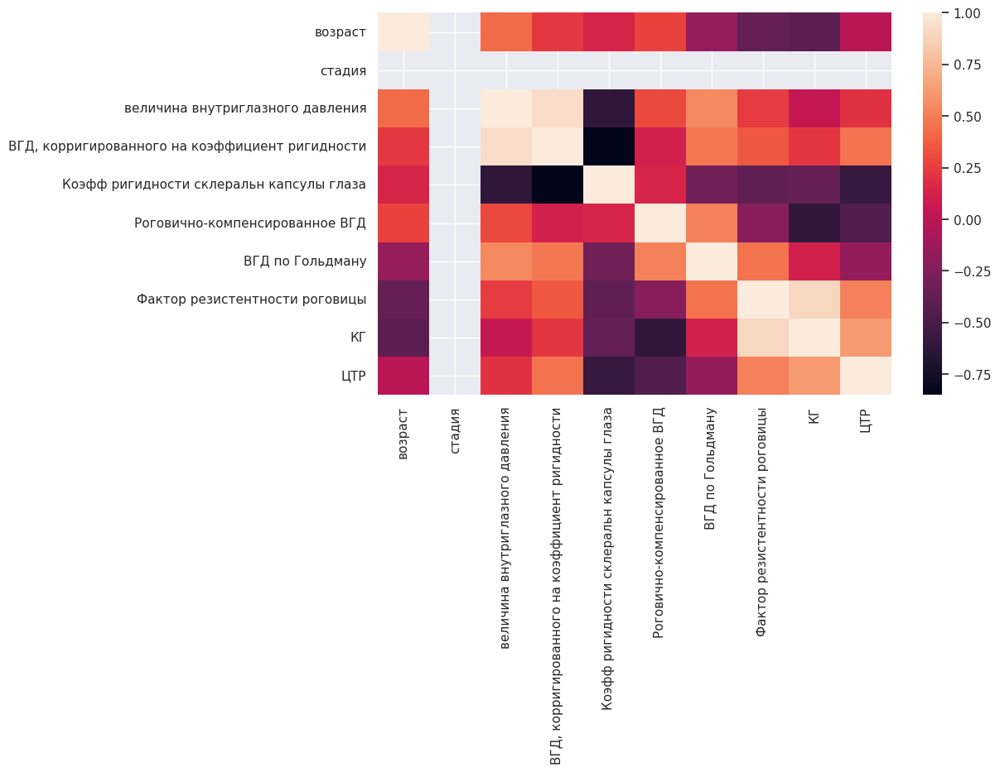

In [ ]:
sns.heatmap(corr_matrix_before)

In [ ]:
corr_matrix_after=median_imputer.iloc [:, 1:11].corr().round(3)

<Axes: >

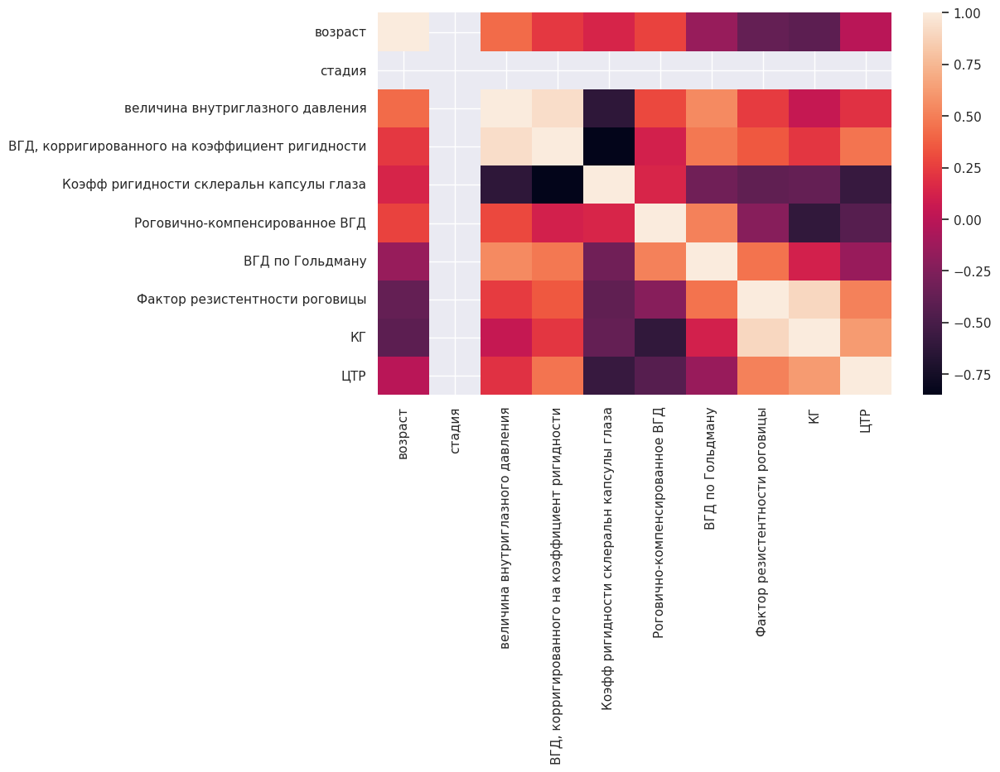

In [ ]:
sns.heatmap(corr_matrix_after)

In [ ]:
changes_in_corr=corr_matrix_before-corr_matrix_after

In [ ]:
changes_in_corr

,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,ЦТР
возраст,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.009
стадия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
величина внутриглазного давления,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,-0.004
"ВГД, корригированного на коэффициент ригидности",0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,-0.006
Коэфф ригидности склеральн капсулы глаза,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.004
Роговично-компенсированное ВГД,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,-0.030
ВГД по Гольдману,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,-0.016
Фактор резистентности роговицы,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,-0.002
КГ,0.000,NaN,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.003
ЦТР,0.009,NaN,-0.004,-0.006,0.004,-0.03,-0.016,-0.002,0.003,0.000


<Axes: >

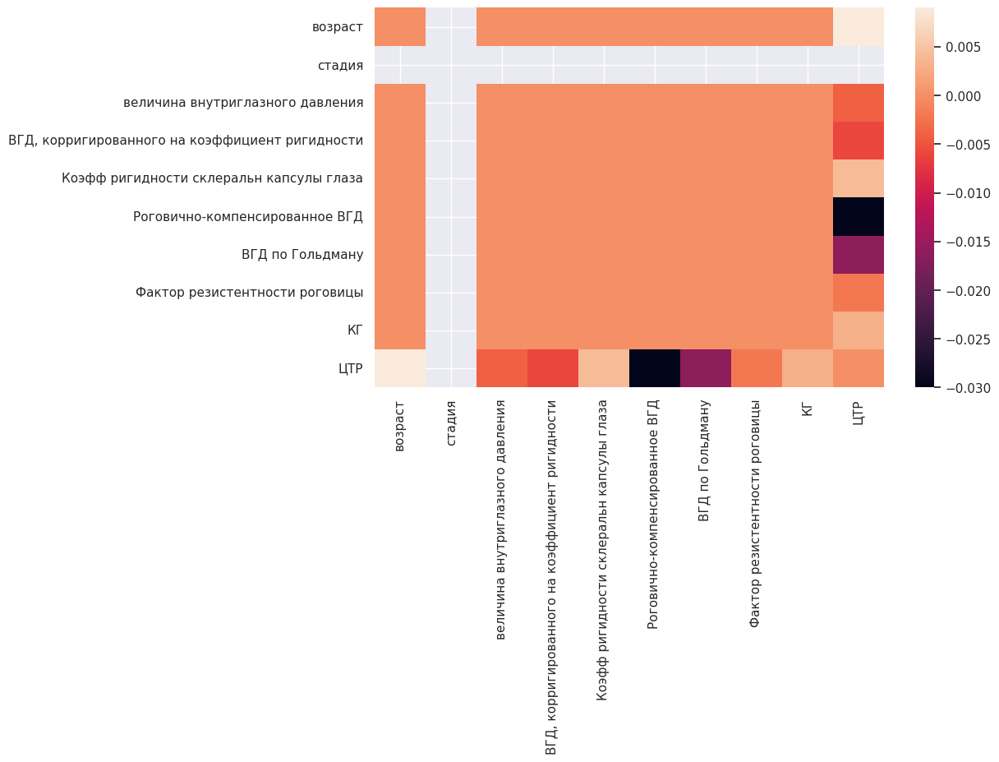

In [ ]:
sns.heatmap(changes_in_corr)

In [ ]:
data_3_stage=median_imputer



-------



# Выгрузка подготовленной таблицы

In [ ]:
pip install XlsxWriter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.9/159.9 kB 9.6 MB/s eta 0:00:00


In [ ]:
file_name = 'prepare_date.xlsx'

with pd.ExcelWriter(file_name, engine='xlsxwriter') as writer:
    data_healthy.to_excel(writer, sheet_name='healthy', index=False)
    data_1_stage.to_excel(writer, sheet_name='1_stage', index=False)
    data_2_stage.to_excel(writer, sheet_name='2_stage', index=False)
    data_3_stage.to_excel(writer, sheet_name='3_stage', index=False)

print(f"Файл '{file_name}' успешно сохранен.")

Файл 'prepare_date.xlsx' успешно сохранен.


# Загрузка подготовленной таблицы

In [ ]:
#загружаем имеющиеся данные
excel_reader=pd.ExcelFile('/content/drive/MyDrive/prepare_date.xlsx')

В таблице с данными 4 листа. Выделим их для удобства работы в отдельные таблицы.

In [ ]:
print(excel_reader.sheet_names)

['healthy', '1_stage', '2_stage', '3_stage']


In [ ]:
data_healthy=excel_reader.parse('healthy')

In [ ]:
#data_healthy.head(11)

In [ ]:
data_1_stage=excel_reader.parse('1_stage')

In [ ]:
#data_1_stage

In [ ]:
data_2_stage=excel_reader.parse('2_stage')

In [ ]:
#data_2_stage

In [ ]:
data_3_stage=excel_reader.parse('3_stage')

In [ ]:
#data_3_stage

# Задача 2. Анализ соответствия выборочных данных нормальному распределению

Имеются 4 таблицы данных без пропусков:
- data_healthy - здоровые пациенты
- data_1_stage - больные с 1 стадией
- data_2_stage - больные со 2 стадией
- data_3_stage - больные с 3 стадией



---



In [ ]:
median_imputer.isnull().sum()

,0
Фамилия,0
возраст,0
стадия,0
величина внутриглазного давления,0
"ВГД, корригированного на коэффициент ригидности",0
Коэфф ригидности склеральн капсулы глаза,0
Роговично-компенсированное ВГД,0
ВГД по Гольдману,0
Фактор резистентности роговицы,0
КГ,0


## Здоровые пациенты

Проверим на нормальность данные здоровых пациентов

### Возраст

<ipython-input-182-ebb2d6acb0b8>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['возраст'], hist=True, kde=True,


<Axes: xlabel='возраст', ylabel='Density'>

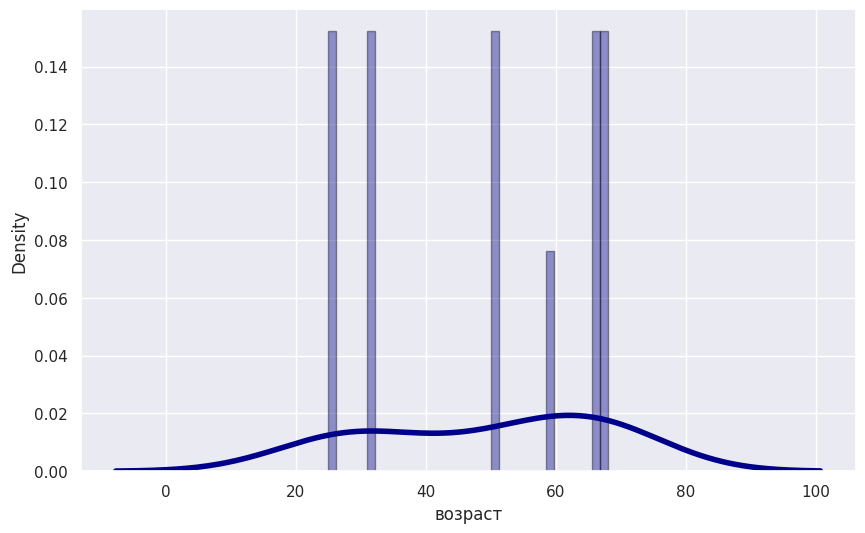

In [ ]:
sns.distplot(data_healthy['возраст'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['возраст']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.846, p-value=0.038
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['возраст']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.313, p-value=0.116
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Величина внутриглазного давления

<ipython-input-185-5b15a994553a>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['величина внутриглазного давления'], hist=True, kde=True,


<Axes: xlabel='величина внутриглазного давления', ylabel='Density'>

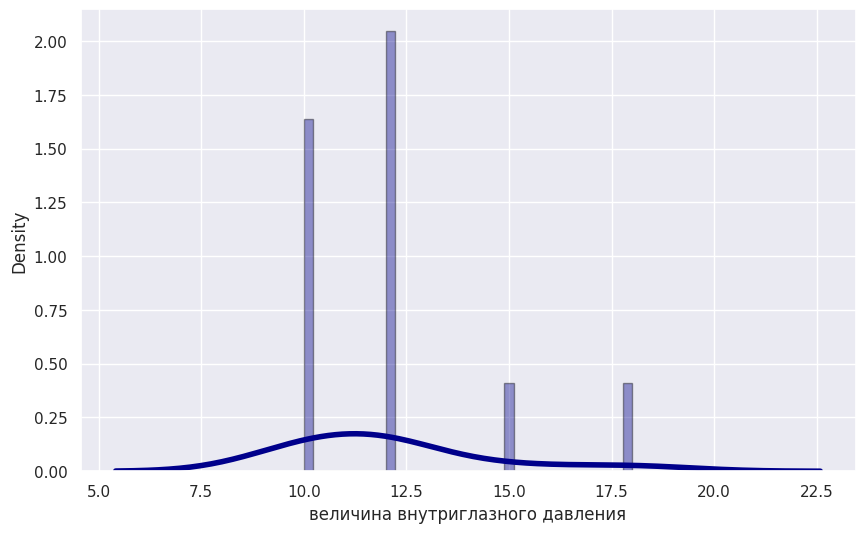

In [ ]:
sns.distplot(data_healthy['величина внутриглазного давления'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['величина внутриглазного давления']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.776, p-value=0.005
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['величина внутриглазного давления']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=8.377, p-value=0.015
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД, корригированного на коэффициент ригидности



<ipython-input-188-78a90380a3c4>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,


<Axes: xlabel='ВГД, корригированного на коэффициент ригидности', ylabel='Density'>

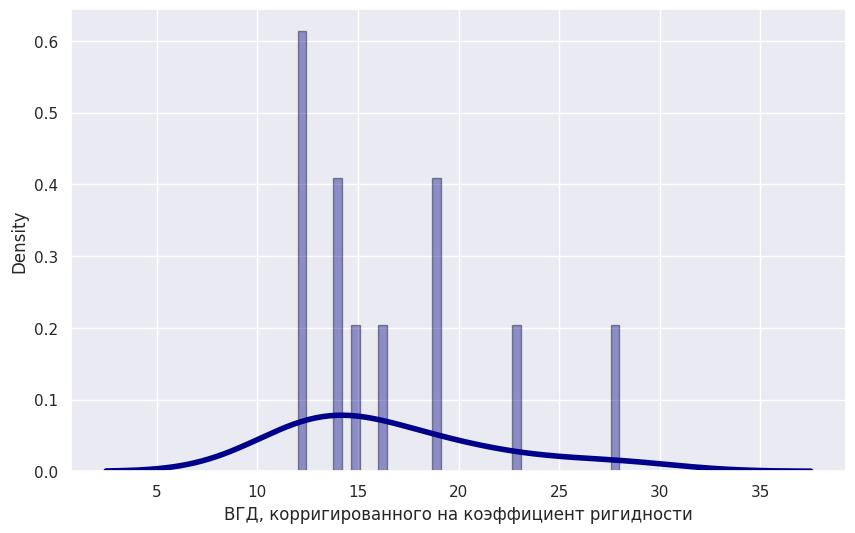

In [ ]:
sns.distplot(data_healthy['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ВГД, корригированного на коэффициент ригидности']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.863, p-value=0.064
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ВГД, корригированного на коэффициент ригидности']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.232, p-value=0.121
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Коэффициент ригидности склеральной капсулы глаза

<ipython-input-191-64e4770e4139>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,


<Axes: xlabel='Коэфф ригидности склеральн капсулы глаза', ylabel='Density'>

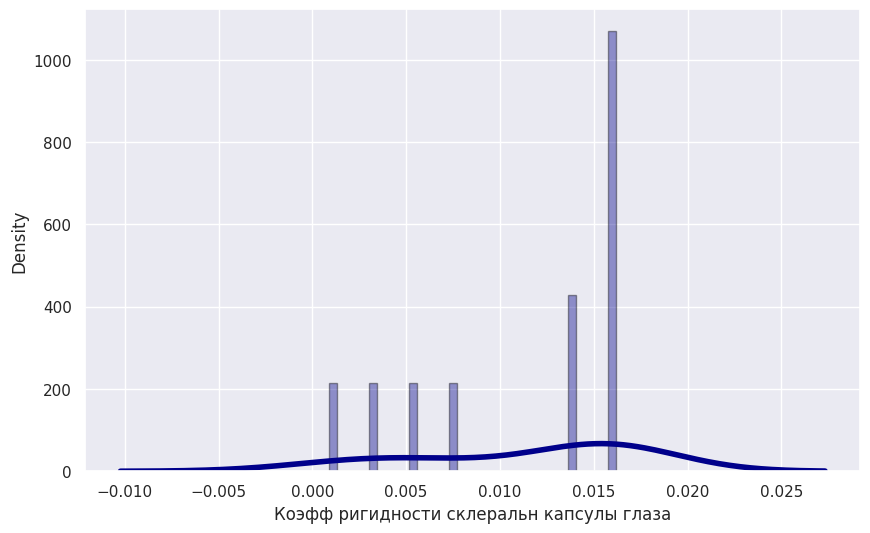

In [ ]:
sns.distplot(data_healthy['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Коэфф ригидности склеральн капсулы глаза']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.786, p-value=0.006
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Коэфф ригидности склеральн капсулы глаза']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.578, p-value=0.276
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Роговично-компенсированное ВГД

<ipython-input-194-befa02cc5092>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Роговично-компенсированное ВГД'], hist=True, kde=True,


<Axes: xlabel='Роговично-компенсированное ВГД', ylabel='Density'>

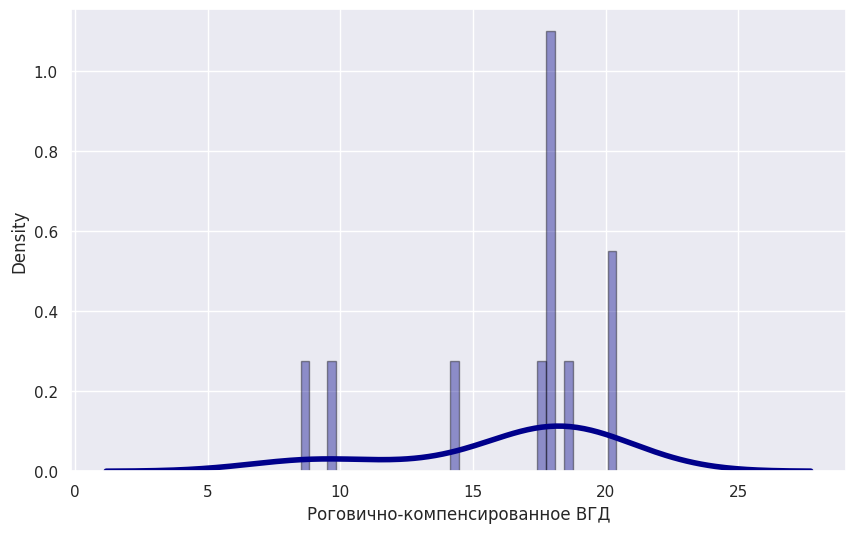

In [ ]:
sns.distplot(data_healthy['Роговично-компенсированное ВГД'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Роговично-компенсированное ВГД']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.794, p-value=0.008
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Роговично-компенсированное ВГД']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.501, p-value=0.105
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД по Гольдману

<ipython-input-197-6e298cce1d7e>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ВГД по Гольдману'], hist=True, kde=True,


<Axes: xlabel='ВГД по Гольдману', ylabel='Density'>

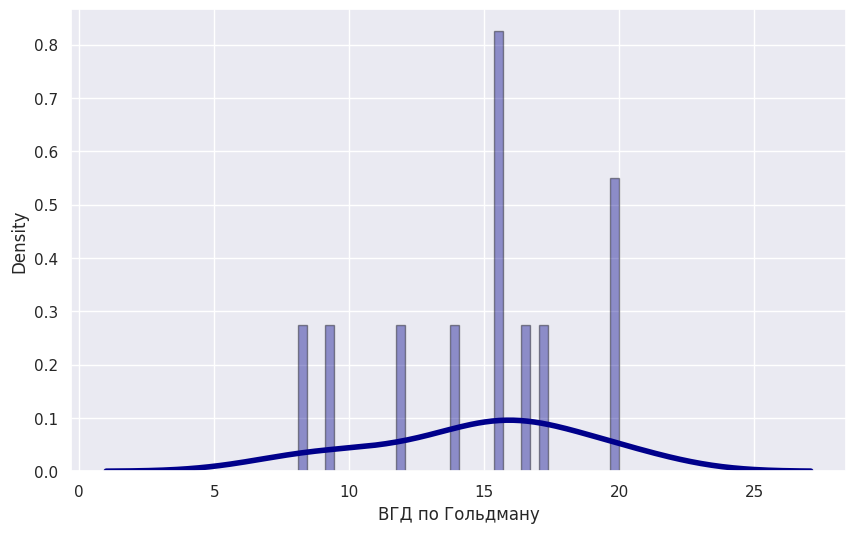

In [ ]:
sns.distplot(data_healthy['ВГД по Гольдману'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ВГД по Гольдману']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.935, p-value=0.464
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ВГД по Гольдману']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.616, p-value=0.735
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Фактор резистентности роговицы

<ipython-input-200-f3faa90e4a0f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Фактор резистентности роговицы'], hist=True, kde=True,


<Axes: xlabel='Фактор резистентности роговицы', ylabel='Density'>

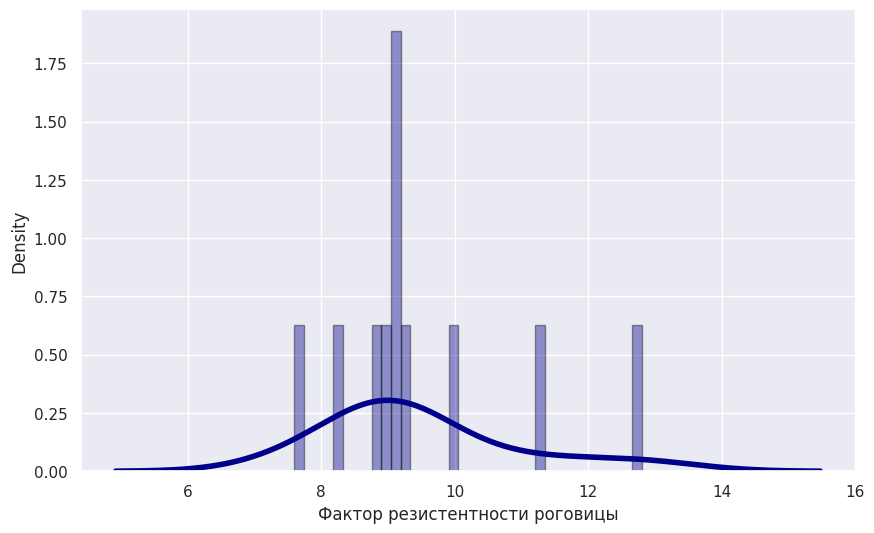

In [ ]:
sns.distplot(data_healthy['Фактор резистентности роговицы'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Фактор резистентности роговицы']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.862, p-value=0.062
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Фактор резистентности роговицы']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.438, p-value=0.040
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### КГ

<ipython-input-203-2eeb14b2c8ac>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['КГ'], hist=True, kde=True,


<Axes: xlabel='КГ', ylabel='Density'>

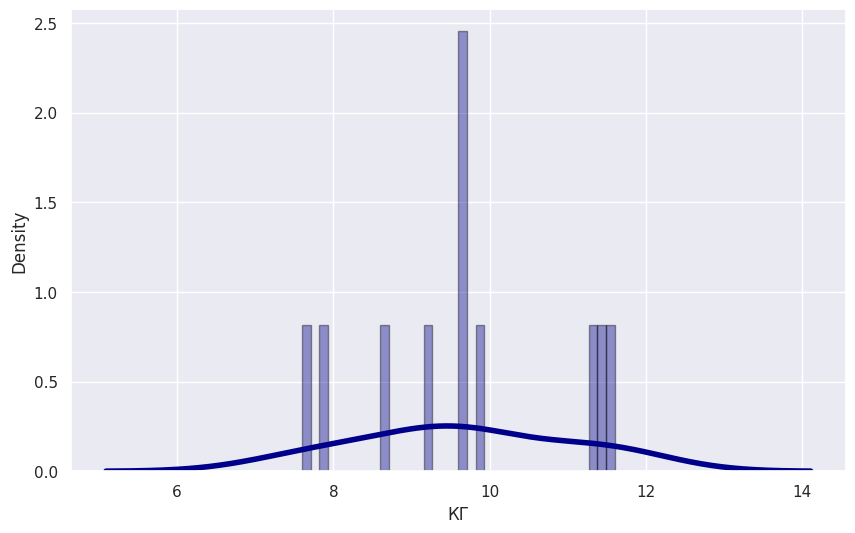

In [ ]:
sns.distplot(data_healthy['КГ'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['КГ']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.927, p-value=0.384
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['КГ']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.457, p-value=0.796
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ЦТР

<ipython-input-206-b97ffbb4affd>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ЦТР'], hist=True, kde=True,


<Axes: xlabel='ЦТР', ylabel='Density'>

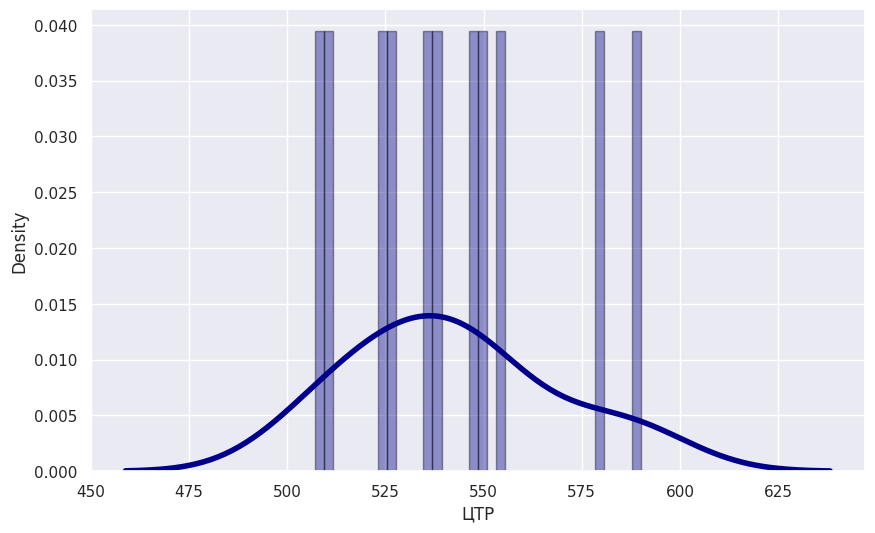

In [ ]:
sns.distplot(data_healthy['ЦТР'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ЦТР']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.949, p-value=0.627
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ЦТР']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.820, p-value=0.663
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### РП

<ipython-input-209-b368280d82e9>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['РП'], hist=True, kde=True,


<Axes: xlabel='РП', ylabel='Density'>

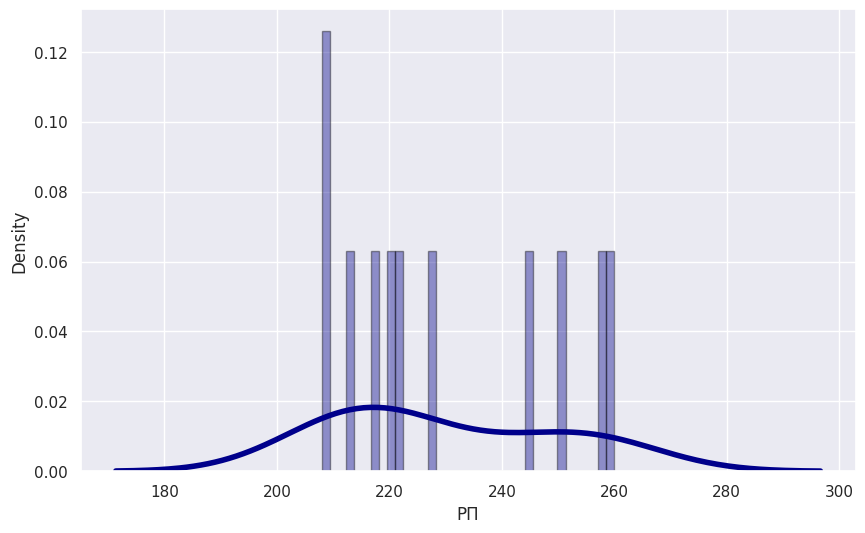

In [ ]:
sns.distplot(data_healthy['РП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['РП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.878, p-value=0.099
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['РП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.742, p-value=0.254
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ГлРП

<ipython-input-212-133fe9ebd6ff>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ГлРП'], hist=True, kde=True,


<Axes: xlabel='ГлРП', ylabel='Density'>

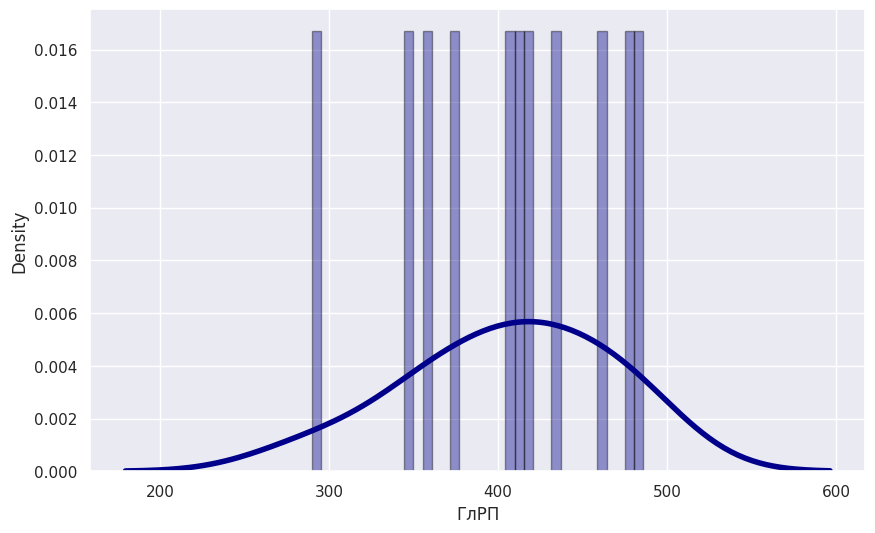

In [ ]:
sns.distplot(data_healthy['ГлРП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ГлРП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.965, p-value=0.837
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ГлРП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.604, p-value=0.739
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)


### gamma Ш

<ipython-input-215-9466a507eb48>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['gamma Ш'], hist=True, kde=True,


<Axes: xlabel='gamma Ш', ylabel='Density'>

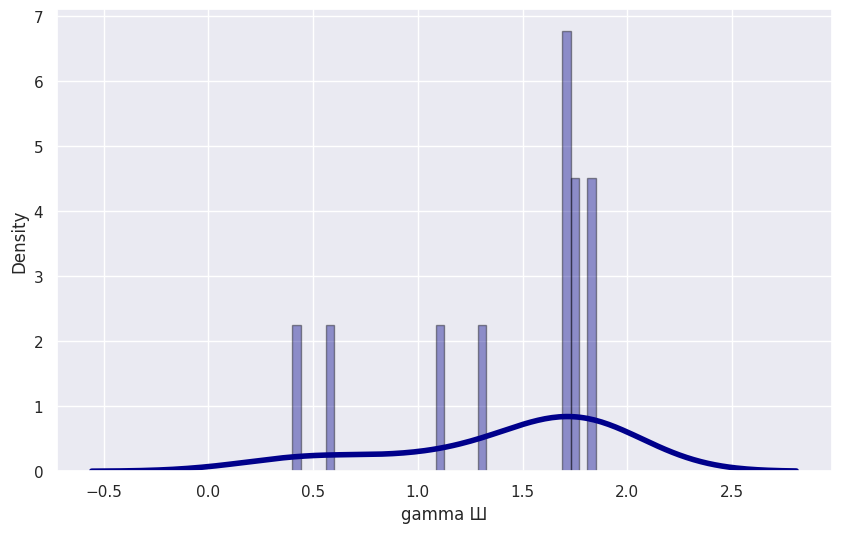

In [ ]:
sns.distplot(data_healthy['gamma Ш'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['gamma Ш']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.780, p-value=0.005
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['gamma Ш']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.757, p-value=0.153
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---










---








### Efrid

<ipython-input-218-865001bc625e>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Efrid'], hist=True, kde=True,


<Axes: xlabel='Efrid', ylabel='Density'>

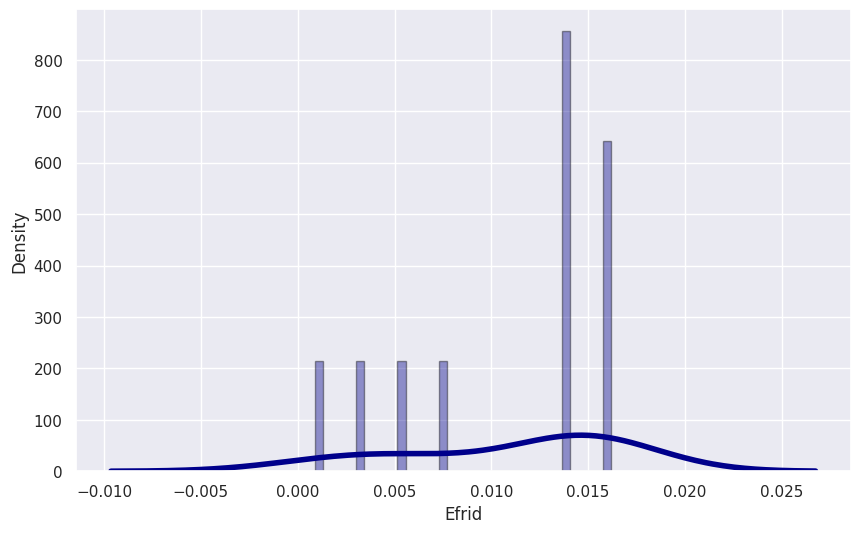

In [ ]:
sns.distplot(data_healthy['Efrid'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Efrid']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.824, p-value=0.019
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Efrid']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.285, p-value=0.319
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### SVL

<ipython-input-221-c470acd1a761>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['SVL'], hist=True, kde=True,


<Axes: xlabel='SVL', ylabel='Density'>

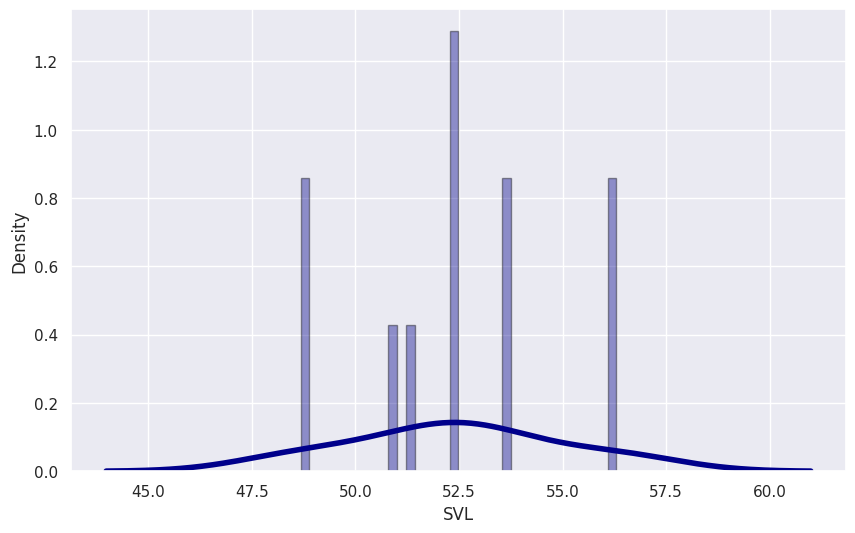

In [ ]:
sns.distplot(data_healthy['SVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['SVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.928, p-value=0.390
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['SVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.026, p-value=0.987
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### DVL

<ipython-input-224-44661ec4f43f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['DVL'], hist=True, kde=True,


<Axes: xlabel='DVL', ylabel='Density'>

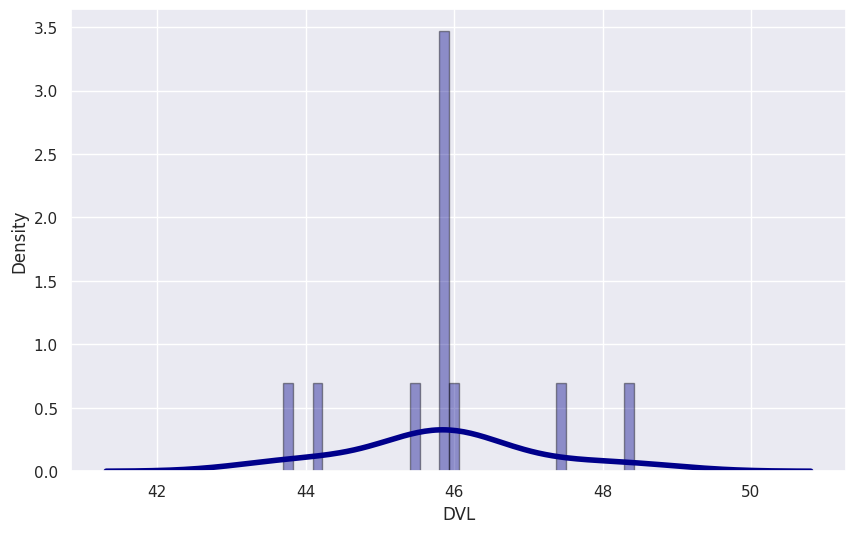

In [ ]:
sns.distplot(data_healthy['DVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['DVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.889, p-value=0.134
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['DVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.123, p-value=0.570
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### РИ (рео. индекс) мОм

<ipython-input-227-f456c3d5f34a>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['РИ (рео.индекс) мОм'], hist=True, kde=True,


<Axes: xlabel='РИ (рео.индекс) мОм', ylabel='Density'>

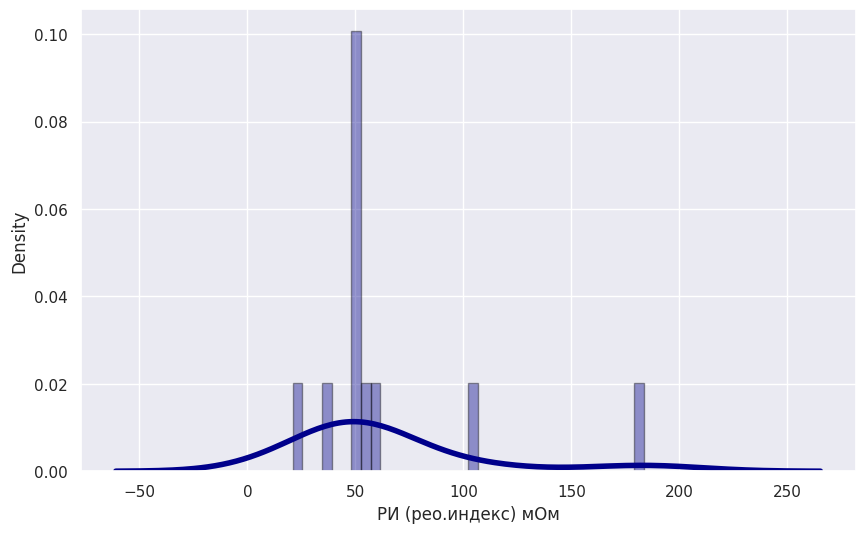

In [ ]:
sns.distplot(data_healthy['РИ (рео.индекс) мОм'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['РИ (рео.индекс) мОм']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.688, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['РИ (рео.индекс) мОм']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=17.994, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМН (макс. нап)

<ipython-input-230-01e54adf4b89>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ПМН (макс.нап)'], hist=True, kde=True,


<Axes: xlabel='ПМН (макс.нап)', ylabel='Density'>

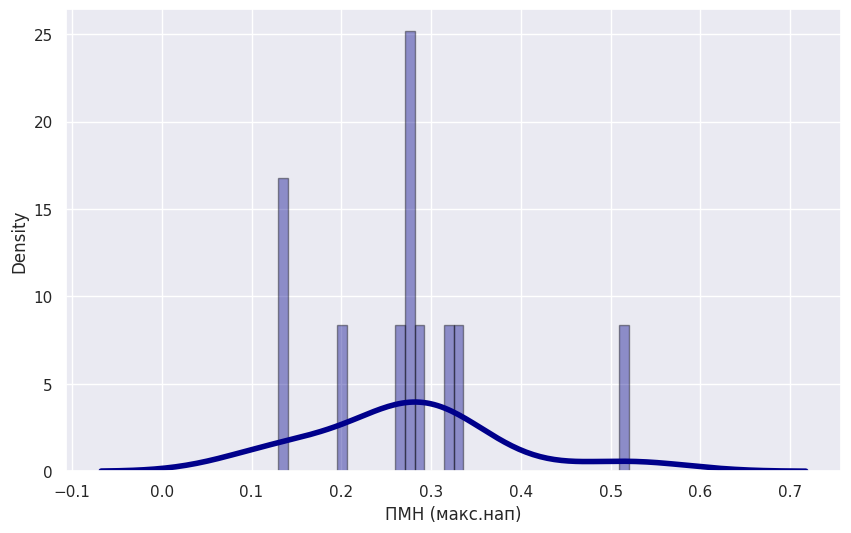

In [ ]:
sns.distplot(data_healthy['ПМН (макс.нап)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ПМН (макс.нап)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.876, p-value=0.092
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ПМН (макс.нап)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.289, p-value=0.117
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМУ (мод.упр.)

<ipython-input-233-ce54ca1341e6>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['ПМУ (мод.упр.)'], hist=True, kde=True,


<Axes: xlabel='ПМУ (мод.упр.)', ylabel='Density'>

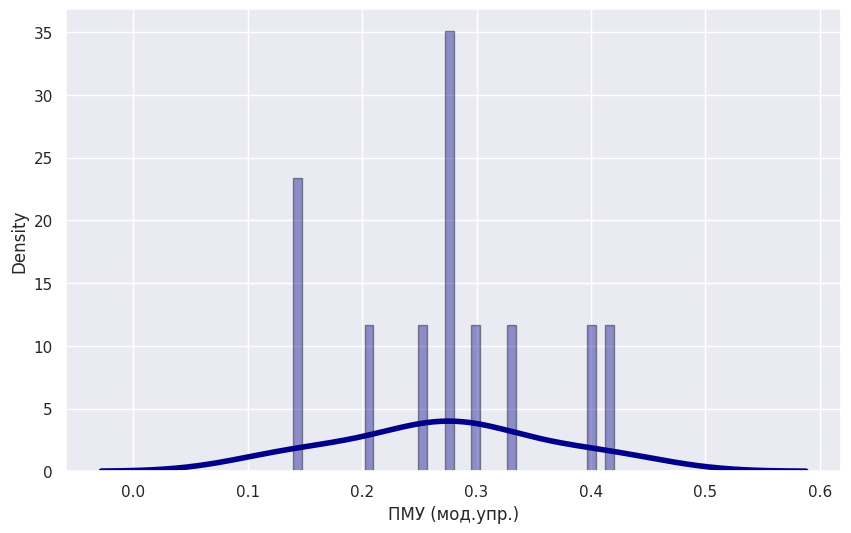

In [ ]:
sns.distplot(data_healthy['ПМУ (мод.упр.)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['ПМУ (мод.упр.)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.942, p-value=0.548
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['ПМУ (мод.упр.)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.018, p-value=0.991
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (отн.)

<ipython-input-236-680159cf6938>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Z баз.(отн.))'], hist=True, kde=True,


<Axes: xlabel='Z баз.(отн.))', ylabel='Density'>

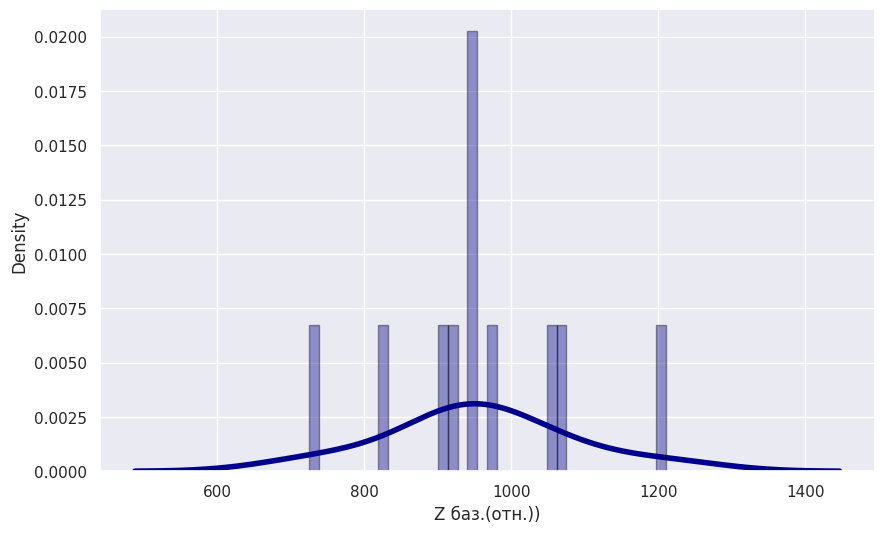

In [ ]:
sns.distplot(data_healthy['Z баз.(отн.))'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Z баз.(отн.))']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.957, p-value=0.735
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Z баз.(отн.))']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.052, p-value=0.591
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (мОм)

<ipython-input-239-e44658970b6e>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['Z баз.(мОм)'], hist=True, kde=True,


<Axes: xlabel='Z баз.(мОм)', ylabel='Density'>

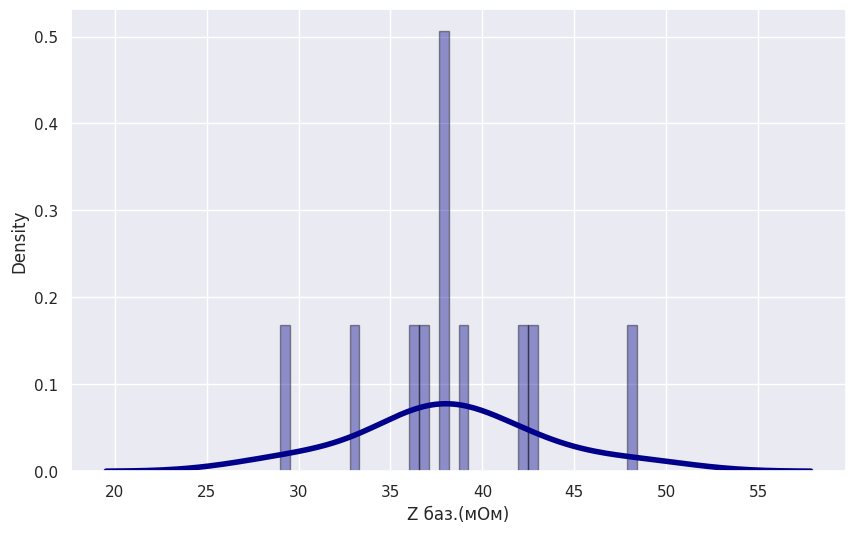

In [ ]:
sns.distplot(data_healthy['Z баз.(мОм)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['Z баз.(мОм)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.957, p-value=0.735
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['Z баз.(мОм)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.052, p-value=0.591
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)




---








### УОК (уд. объем) мкл

<ipython-input-242-a99d9b646a94>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_healthy['УОК (уд.объем) мкл'], hist=True, kde=True,


<Axes: xlabel='УОК (уд.объем) мкл', ylabel='Density'>

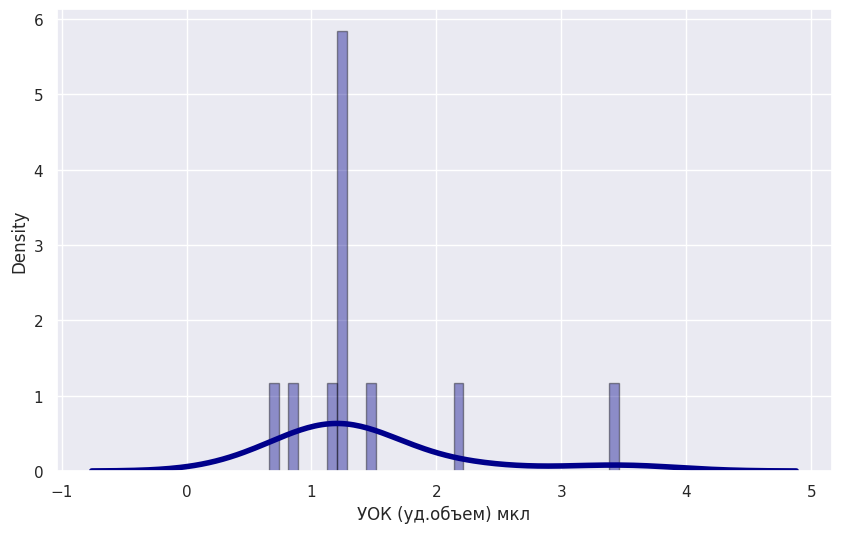

In [ ]:
sns.distplot(data_healthy['УОК (уд.объем) мкл'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_healthy['УОК (уд.объем) мкл']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.741, p-value=0.002
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_healthy['УОК (уд.объем) мкл']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=14.840, p-value=0.001
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  res = hypotest_fun_out(*samples, **kwds)


## Пациенты с 1й стадией заболевания

Проверим на нормальность данные пациентов с 1й стадией заболевания

### Возраст

<ipython-input-245-a46132ecd4e1>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['возраст'], hist=True, kde=True,


<Axes: xlabel='возраст', ylabel='Density'>

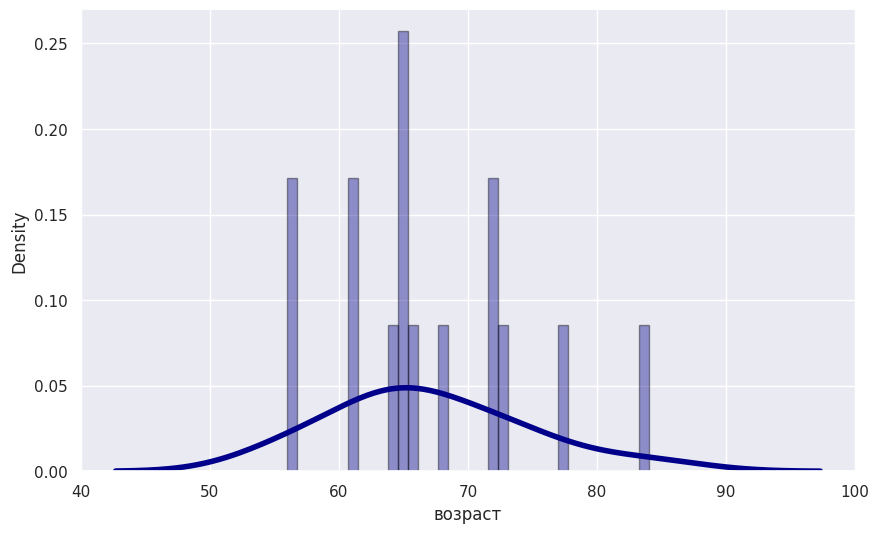

In [ ]:
sns.distplot(data_1_stage['возраст'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['возраст']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.953, p-value=0.569
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['возраст']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.513, p-value=0.469
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Величина внутриглазного давления

<ipython-input-248-de1bb62e6b9a>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['величина внутриглазного давления'], hist=True, kde=True,


<Axes: xlabel='величина внутриглазного давления', ylabel='Density'>

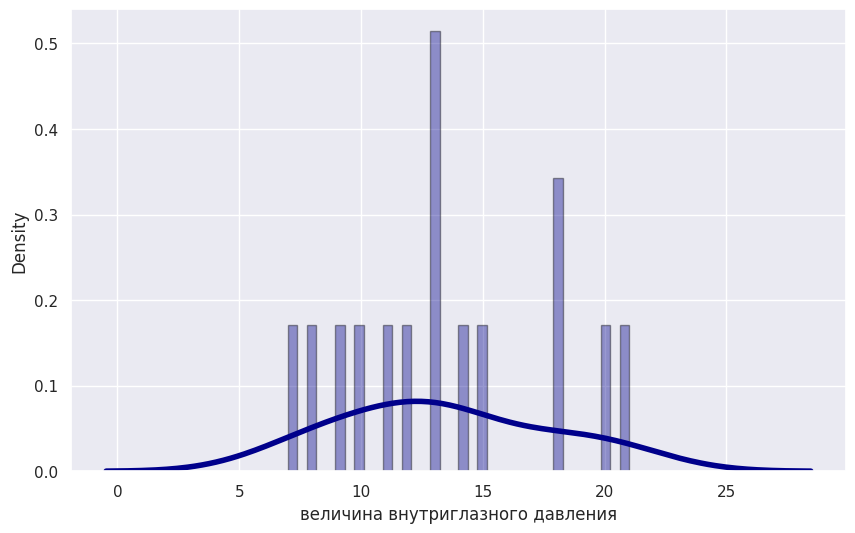

In [ ]:
sns.distplot(data_1_stage['величина внутриглазного давления'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['величина внутриглазного давления']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.957, p-value=0.637
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['величина внутриглазного давления']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.801, p-value=0.670
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД, корригированного на коэффициент ригидности



<ipython-input-251-fb65aa990680>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,


<Axes: xlabel='ВГД, корригированного на коэффициент ригидности', ylabel='Density'>

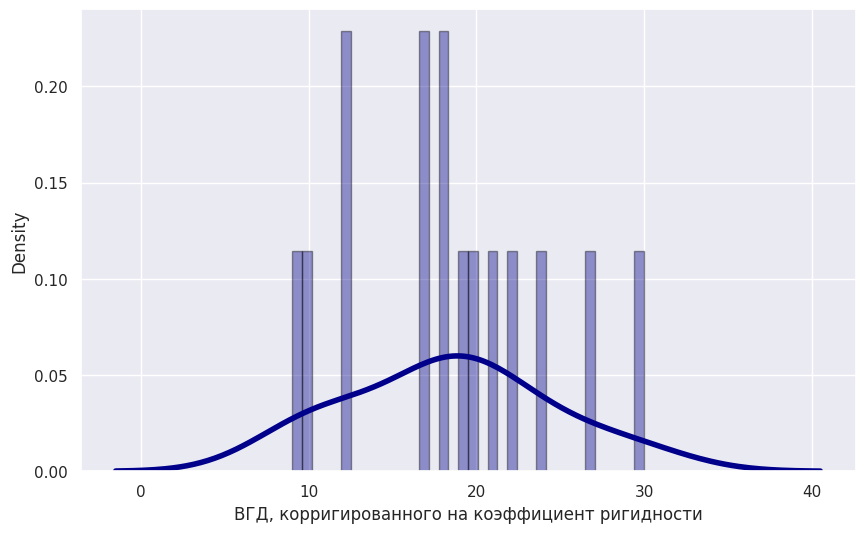

In [ ]:
sns.distplot(data_1_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ВГД, корригированного на коэффициент ригидности']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.967, p-value=0.813
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ВГД, корригированного на коэффициент ригидности']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.131, p-value=0.937
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Коэффициент ригидности склеральной капсулы глаза

<ipython-input-254-2c6f36521ef2>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,


<Axes: xlabel='Коэфф ригидности склеральн капсулы глаза', ylabel='Density'>

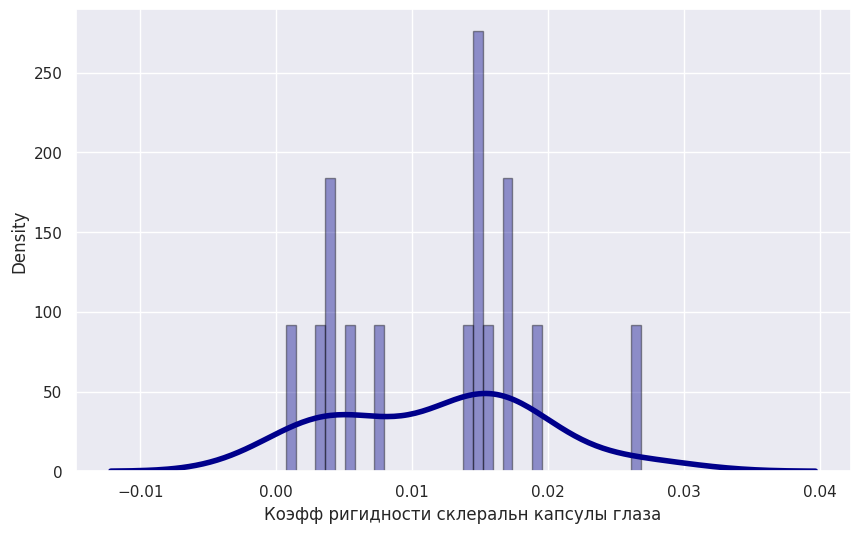

In [ ]:
sns.distplot(data_1_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Коэфф ригидности склеральн капсулы глаза']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.920, p-value=0.191
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Коэфф ригидности склеральн капсулы глаза']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.224, p-value=0.894
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Роговично-компенсированное ВГД

<ipython-input-257-279d9d8a743f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,


<Axes: xlabel='Роговично-компенсированное ВГД', ylabel='Density'>

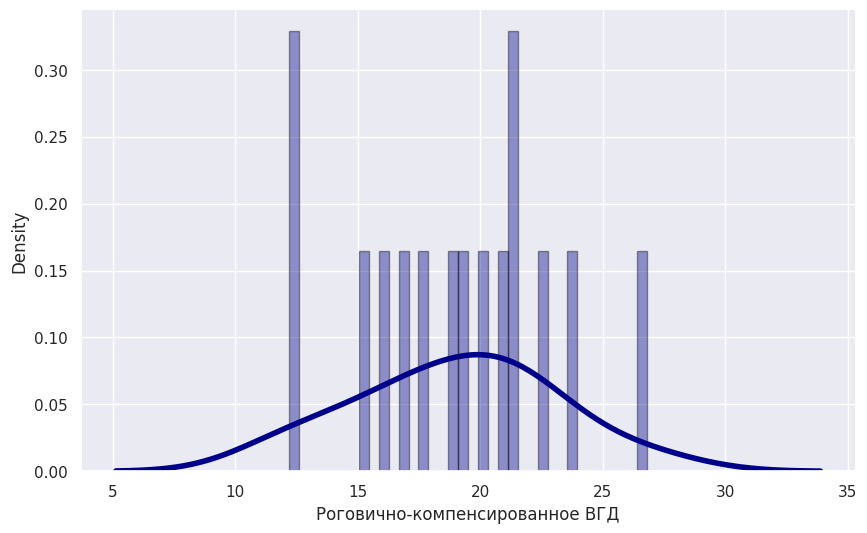

In [ ]:
sns.distplot(data_1_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Роговично-компенсированное ВГД']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.979, p-value=0.965
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Роговично-компенсированное ВГД']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.008, p-value=0.996
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД по Гольдману

<ipython-input-260-ccecdc394726>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ВГД по Гольдману'], hist=True, kde=True,


<Axes: xlabel='ВГД по Гольдману', ylabel='Density'>

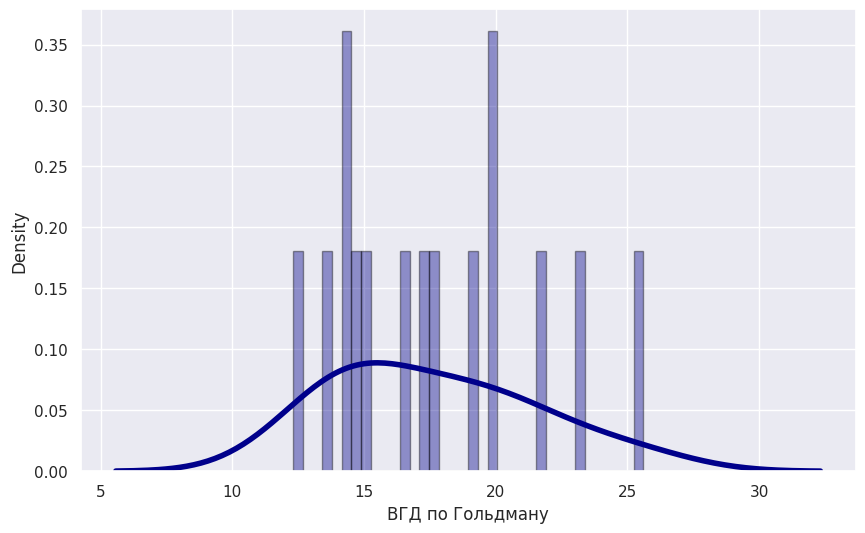

In [ ]:
sns.distplot(data_1_stage['ВГД по Гольдману'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ВГД по Гольдману']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.952, p-value=0.555
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ВГД по Гольдману']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.135, p-value=0.567
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Фактор резистентности роговицы

<ipython-input-263-34d1b0b70fbb>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Фактор резистентности роговицы'], hist=True, kde=True,


<Axes: xlabel='Фактор резистентности роговицы', ylabel='Density'>

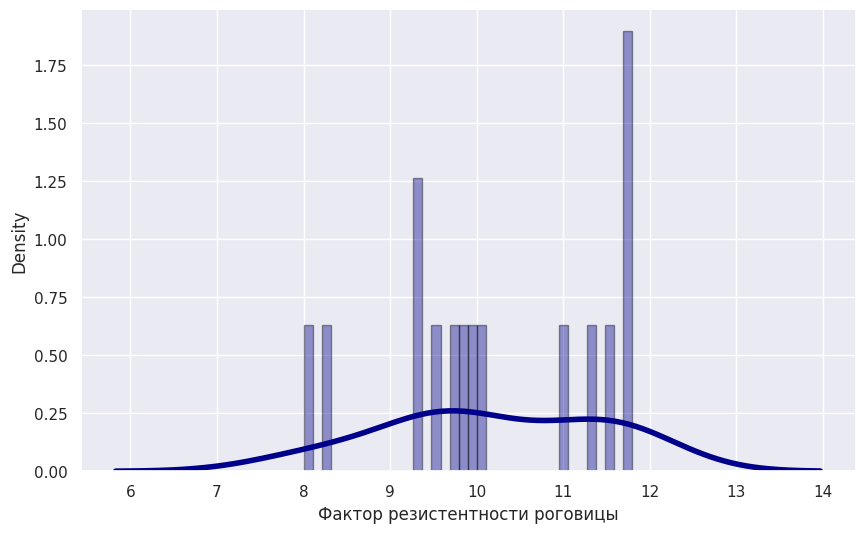

In [ ]:
sns.distplot(data_1_stage['Фактор резистентности роговицы'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Фактор резистентности роговицы']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.921, p-value=0.199
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Фактор резистентности роговицы']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.277, p-value=0.528
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### КГ

<ipython-input-266-493a5572dd03>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['КГ'], hist=True, kde=True,


<Axes: xlabel='КГ', ylabel='Density'>

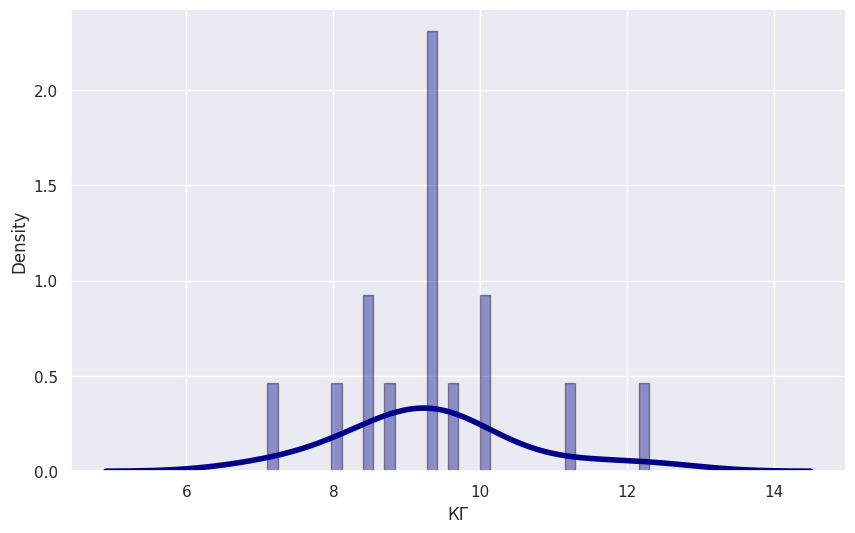

In [ ]:
sns.distplot(data_1_stage['КГ'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['КГ']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.942, p-value=0.405
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['КГ']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.121, p-value=0.210
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ЦТР

<ipython-input-269-a4709c55575b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ЦТР'], hist=True, kde=True,


<Axes: xlabel='ЦТР', ylabel='Density'>

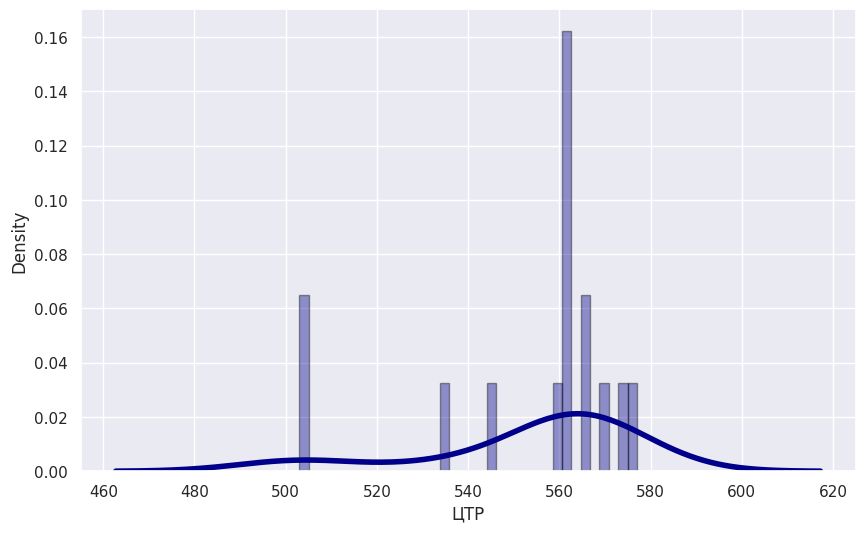

In [ ]:
sns.distplot(data_1_stage['ЦТР'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ЦТР']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.751, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ЦТР']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=8.872, p-value=0.012
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### РП

<ipython-input-272-04e8e0b51172>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['РП'], hist=True, kde=True,


<Axes: xlabel='РП', ylabel='Density'>

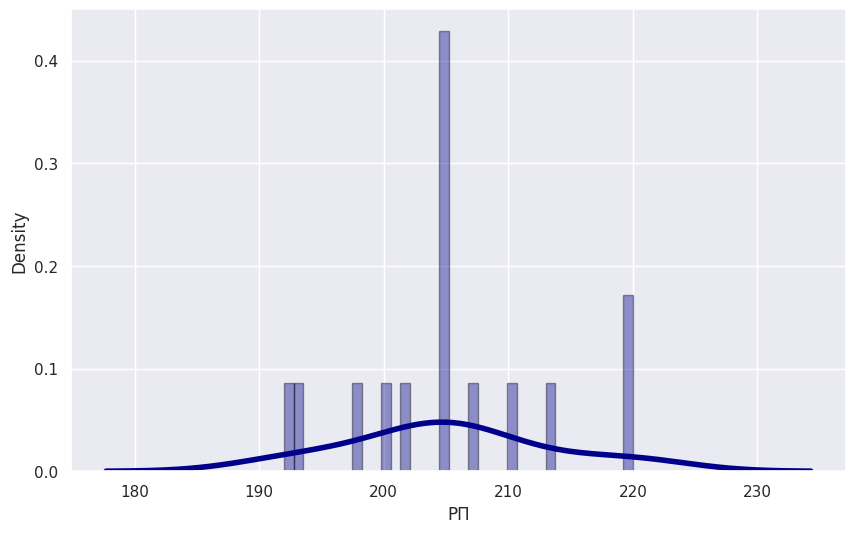

In [ ]:
sns.distplot(data_1_stage['РП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['РП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.938, p-value=0.353
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['РП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.375, p-value=0.829
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ГлРП

<ipython-input-275-bda9f069481b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ГлРП'], hist=True, kde=True,


<Axes: xlabel='ГлРП', ylabel='Density'>

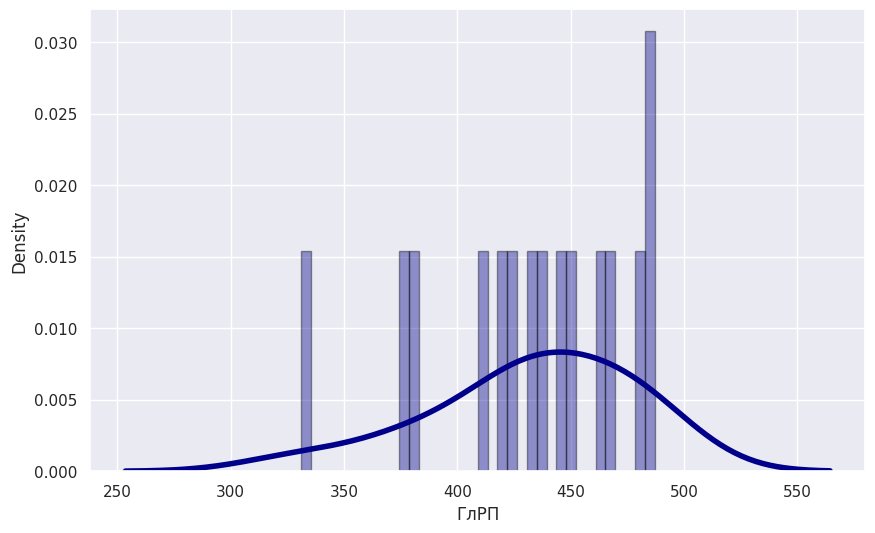

In [ ]:
sns.distplot(data_1_stage['ГлРП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ГлРП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.936, p-value=0.340
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ГлРП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.617, p-value=0.270
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


### gamma Ш

<ipython-input-278-7e3ef4026494>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['gamma Ш'], hist=True, kde=True,


<Axes: xlabel='gamma Ш', ylabel='Density'>

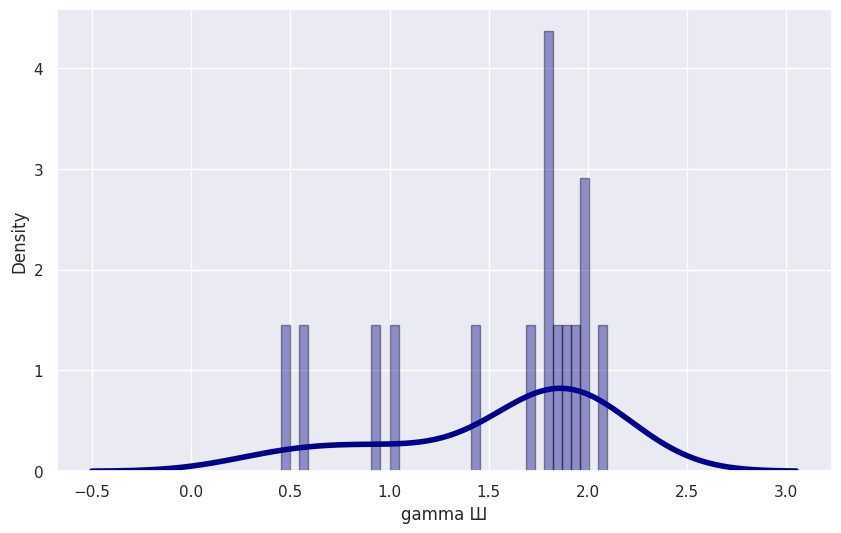

In [ ]:
sns.distplot(data_1_stage['gamma Ш'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['gamma Ш']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.815, p-value=0.006
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['gamma Ш']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.700, p-value=0.157
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---










---








### Efrid

<ipython-input-281-688c2649f78a>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Efrid'], hist=True, kde=True,


<Axes: xlabel='Efrid', ylabel='Density'>

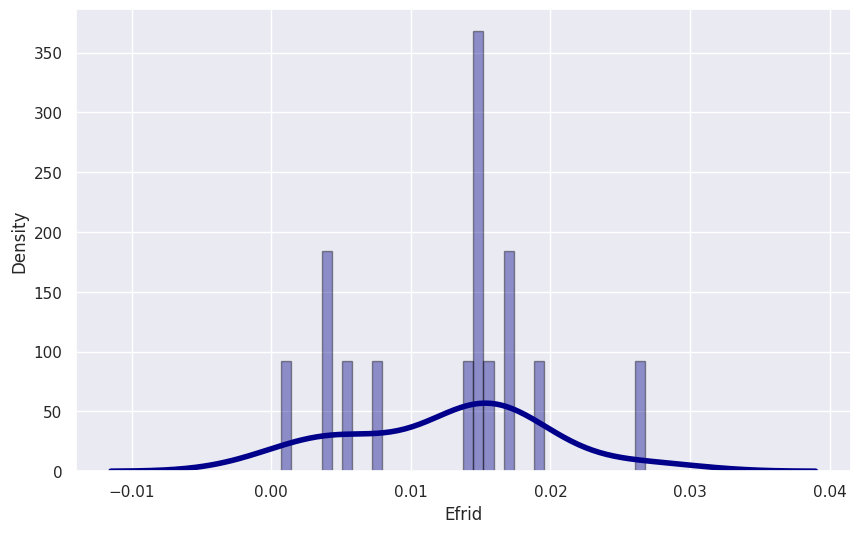

In [ ]:
sns.distplot(data_1_stage['Efrid'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Efrid']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.917, p-value=0.175
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Efrid']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.017, p-value=0.992
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### SVL

<ipython-input-284-3cc2acb80886>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['SVL'], hist=True, kde=True,


<Axes: xlabel='SVL', ylabel='Density'>

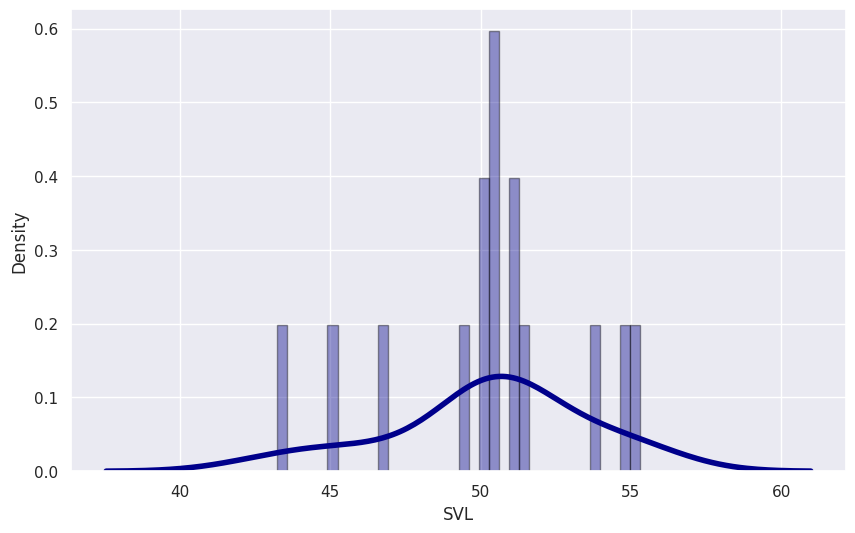

In [ ]:
sns.distplot(data_1_stage['SVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['SVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.920, p-value=0.196
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['SVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.798, p-value=0.407
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### DVL

<ipython-input-287-6028932ce58b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['DVL'], hist=True, kde=True,


<Axes: xlabel='DVL', ylabel='Density'>

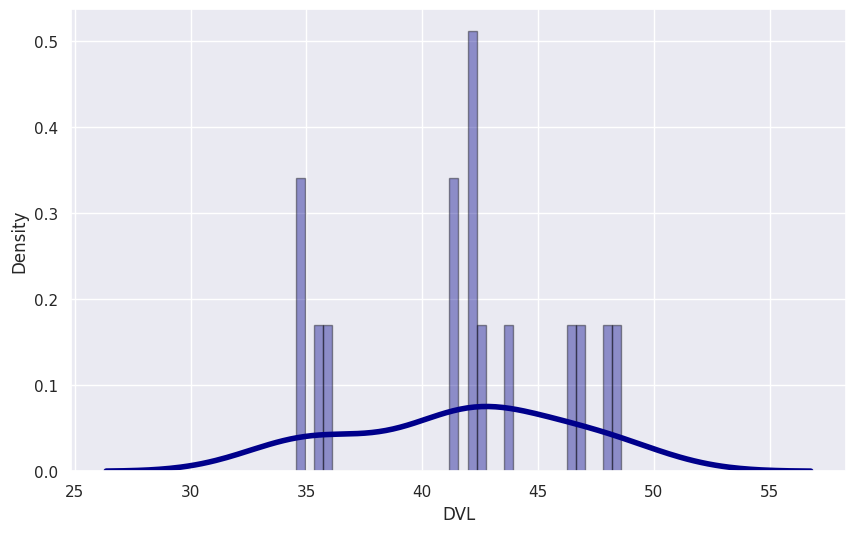

In [ ]:
sns.distplot(data_1_stage['DVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['DVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.912, p-value=0.143
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['DVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.210, p-value=0.546
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### РИ (рео. индекс) мОм

<ipython-input-290-1add5282239c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,


<Axes: xlabel='РИ (рео.индекс) мОм', ylabel='Density'>

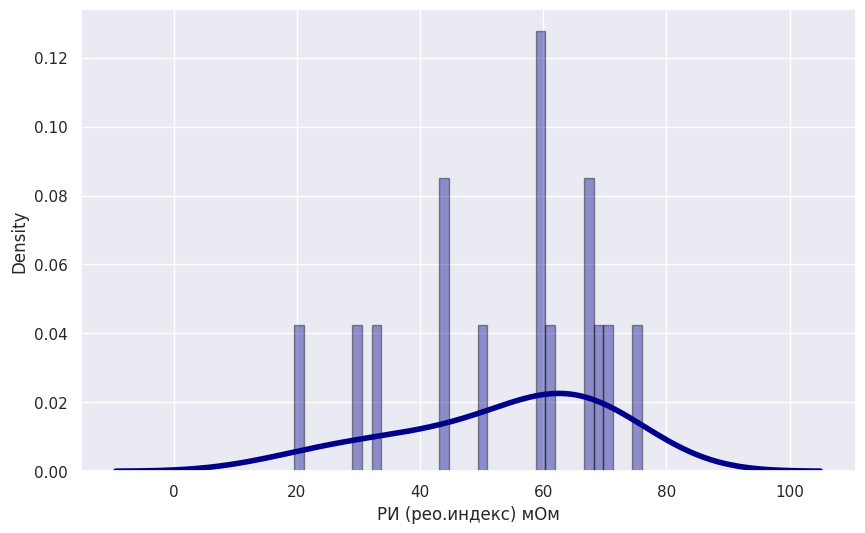

In [ ]:
sns.distplot(data_1_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['РИ (рео.индекс) мОм']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.929, p-value=0.268
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['РИ (рео.индекс) мОм']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.672, p-value=0.433
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМН (макс. нап)

<ipython-input-293-56fe971c0bbd>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ПМН (макс.нап)'], hist=True, kde=True,


<Axes: xlabel='ПМН (макс.нап)', ylabel='Density'>

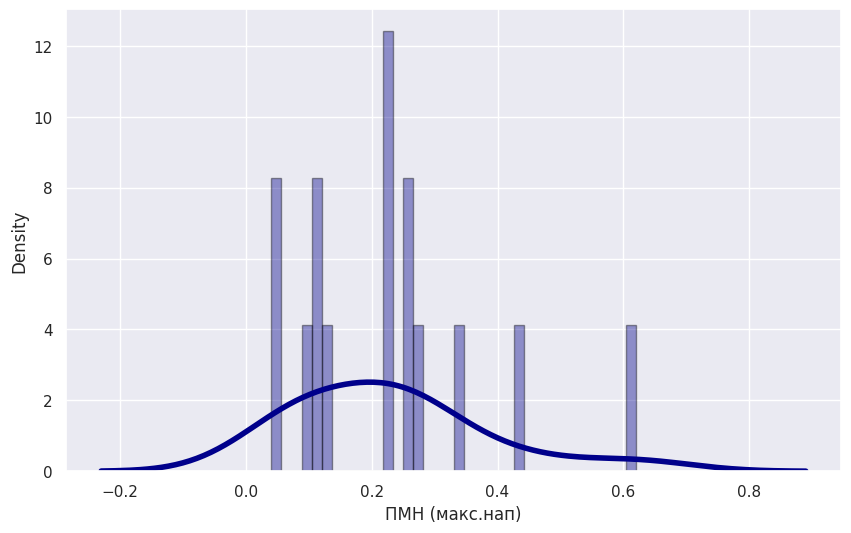

In [ ]:
sns.distplot(data_1_stage['ПМН (макс.нап)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ПМН (макс.нап)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.897, p-value=0.086
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ПМН (макс.нап)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.246, p-value=0.044
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМУ (мод.упр.)

<ipython-input-296-5b26ee228155>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['ПМУ (мод.упр.)'], hist=True, kde=True,


<Axes: xlabel='ПМУ (мод.упр.)', ylabel='Density'>

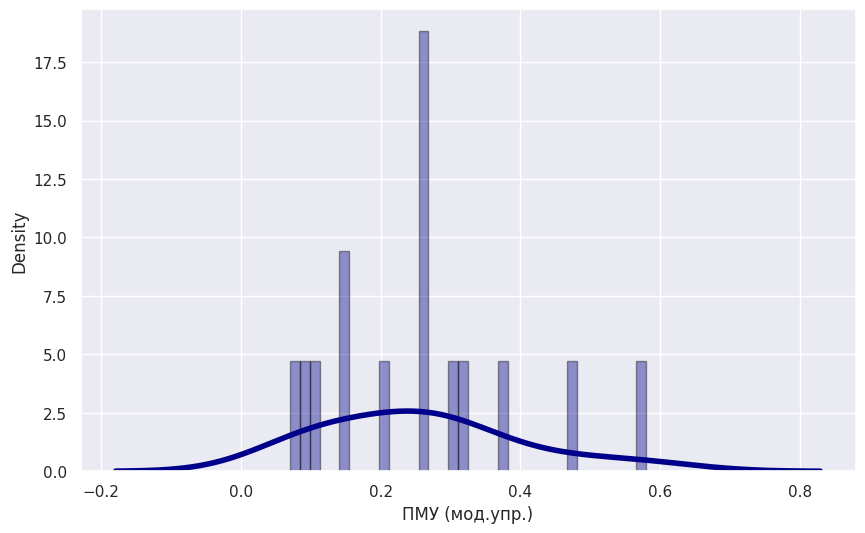

In [ ]:
sns.distplot(data_1_stage['ПМУ (мод.упр.)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['ПМУ (мод.упр.)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.937, p-value=0.345
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['ПМУ (мод.упр.)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.315, p-value=0.314
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (отн.)

<ipython-input-299-7c67e77312dc>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Z баз.(отн.))'], hist=True, kde=True,


<Axes: xlabel='Z баз.(отн.))', ylabel='Density'>

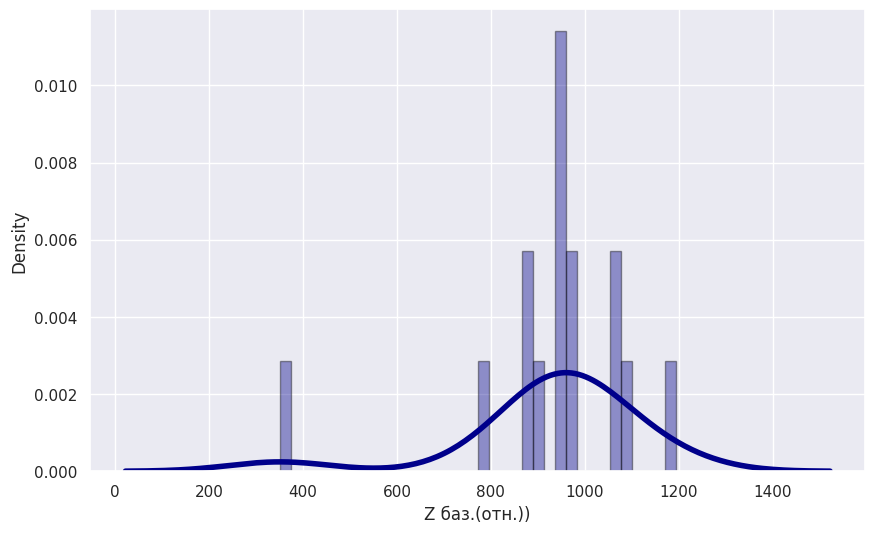

In [ ]:
sns.distplot(data_1_stage['Z баз.(отн.))'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Z баз.(отн.))']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.793, p-value=0.003
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Z баз.(отн.))']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=19.597, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (мОм)

<ipython-input-302-7f879aa4e95c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['Z баз.(мОм)'], hist=True, kde=True,


<Axes: xlabel='Z баз.(мОм)', ylabel='Density'>

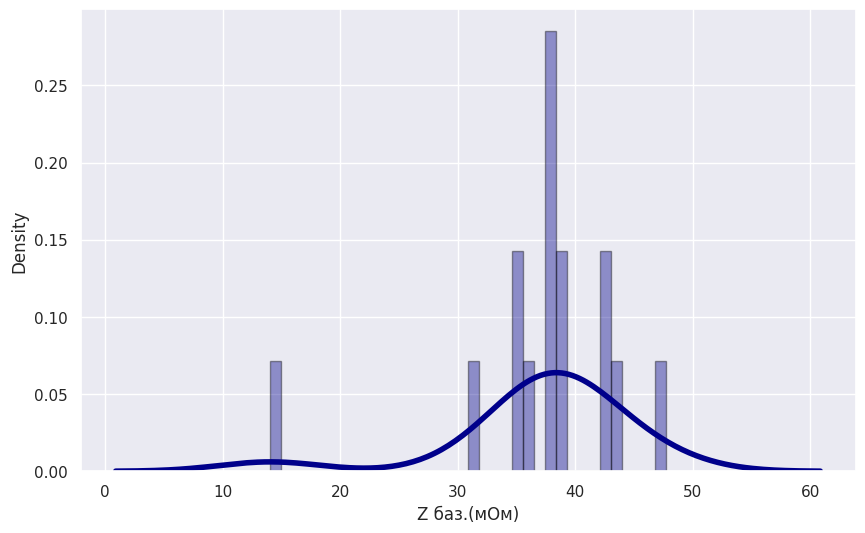

In [ ]:
sns.distplot(data_1_stage['Z баз.(мОм)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['Z баз.(мОм)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.793, p-value=0.003
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['Z баз.(мОм)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=19.597, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### УОК (уд. объем) мкл

<ipython-input-305-fa8c3913db66>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_1_stage['УОК (уд.объем) мкл'], hist=True, kde=True,


<Axes: xlabel='УОК (уд.объем) мкл', ylabel='Density'>

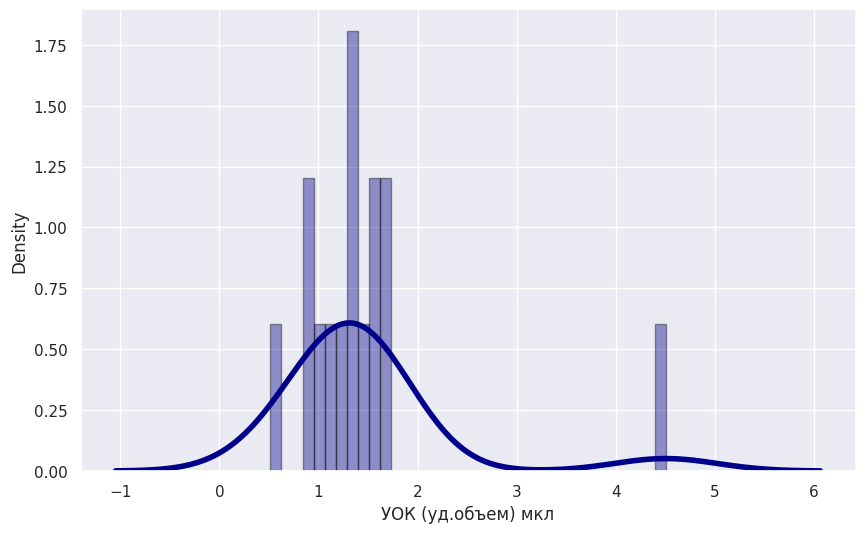

In [ ]:
sns.distplot(data_1_stage['УОК (уд.объем) мкл'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_1_stage['УОК (уд.объем) мкл']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.637, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_1_stage['УОК (уд.объем) мкл']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=30.653, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


## Пациенты со 2й стадией заболевания

Проверим на нормальность данные пациентов со 2й стадией заболевания

### Возраст

<ipython-input-308-32ab434012fe>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['возраст'], hist=True, kde=True,


<Axes: xlabel='возраст', ylabel='Density'>

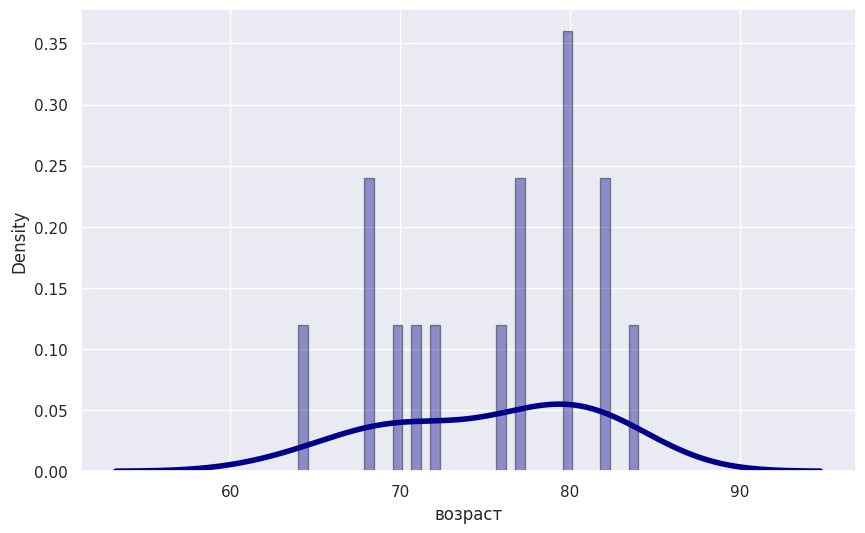

In [ ]:
sns.distplot(data_2_stage['возраст'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['возраст']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.936, p-value=0.335
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['возраст']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.836, p-value=0.399
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Величина внутриглазного давления

<ipython-input-311-baa1c87dd17f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['величина внутриглазного давления'], hist=True, kde=True,


<Axes: xlabel='величина внутриглазного давления', ylabel='Density'>

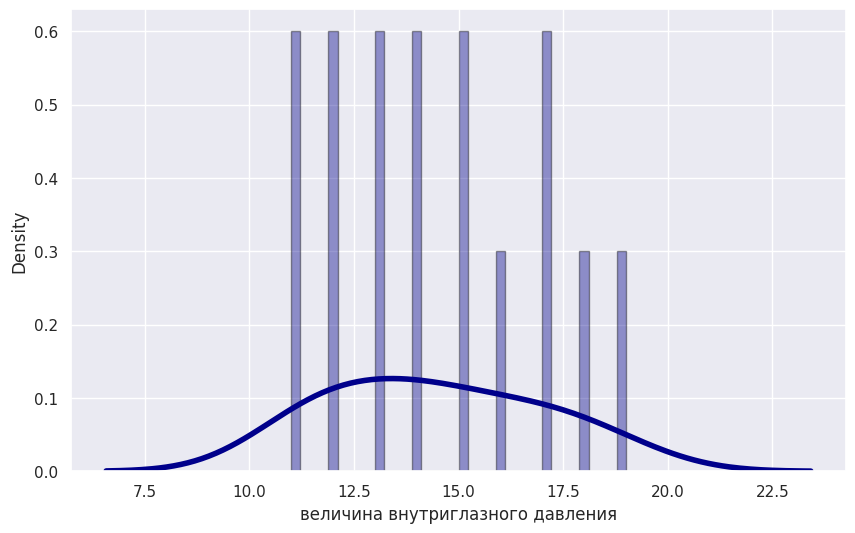

In [ ]:
sns.distplot(data_2_stage['величина внутриглазного давления'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['величина внутриглазного давления']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.953, p-value=0.570
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['величина внутриглазного давления']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.255, p-value=0.534
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД, корригированного на коэффициент ригидности



<ipython-input-314-c7d618295f5d>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,


<Axes: xlabel='ВГД, корригированного на коэффициент ригидности', ylabel='Density'>

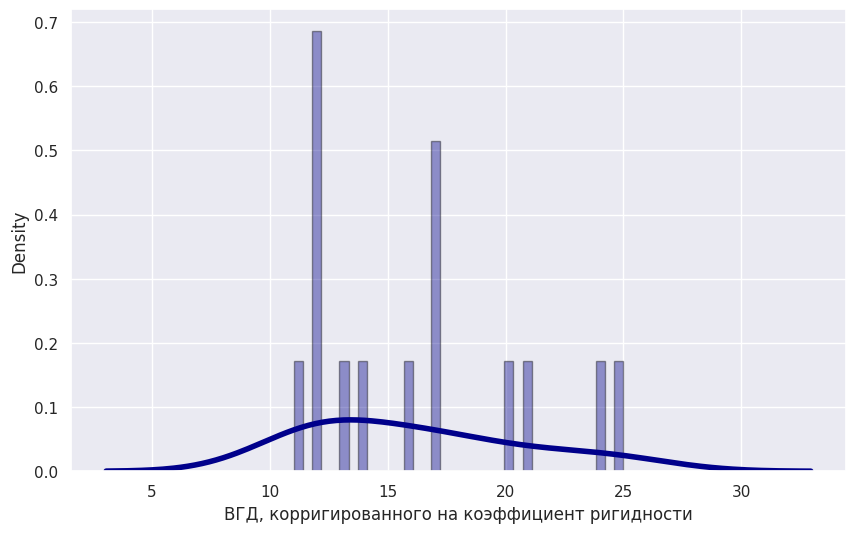

In [ ]:
sns.distplot(data_2_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ВГД, корригированного на коэффициент ригидности']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.891, p-value=0.069
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ВГД, корригированного на коэффициент ригидности']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.847, p-value=0.397
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Коэффициент ригидности склеральной капсулы глаза

<ipython-input-317-ca93c962d174>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,


<Axes: xlabel='Коэфф ригидности склеральн капсулы глаза', ylabel='Density'>

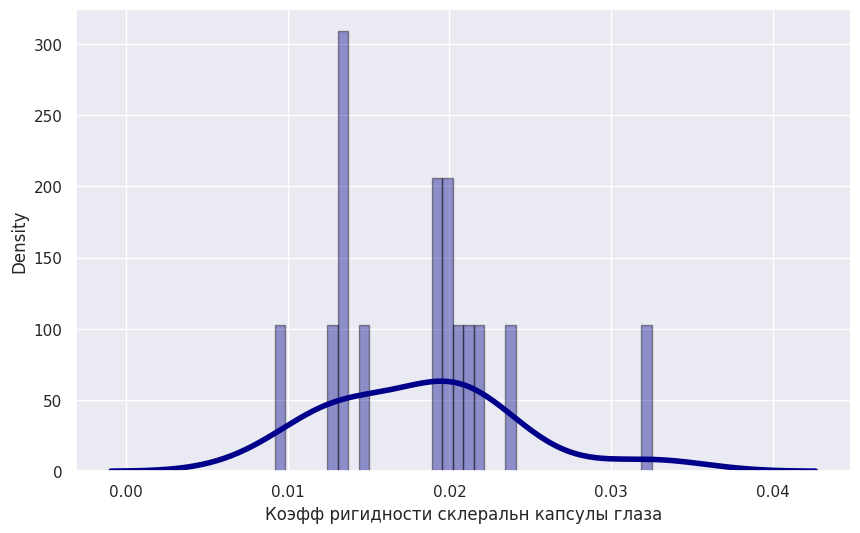

In [ ]:
sns.distplot(data_2_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Коэфф ригидности склеральн капсулы глаза']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.925, p-value=0.231
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Коэфф ригидности склеральн капсулы глаза']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.284, p-value=0.194
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Роговично-компенсированное ВГД

<ipython-input-320-1a6cb091e9a2>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,


<Axes: xlabel='Роговично-компенсированное ВГД', ylabel='Density'>

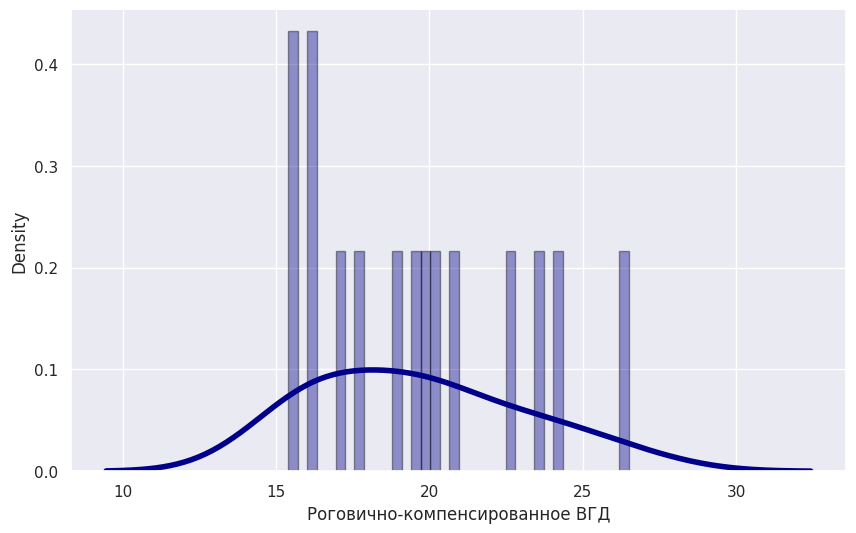

In [ ]:
sns.distplot(data_2_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Роговично-компенсированное ВГД']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.939, p-value=0.375
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Роговично-компенсированное ВГД']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.161, p-value=0.560
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД по Гольдману

<ipython-input-323-0b55d4f1b3f3>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ВГД по Гольдману'], hist=True, kde=True,


<Axes: xlabel='ВГД по Гольдману', ylabel='Density'>

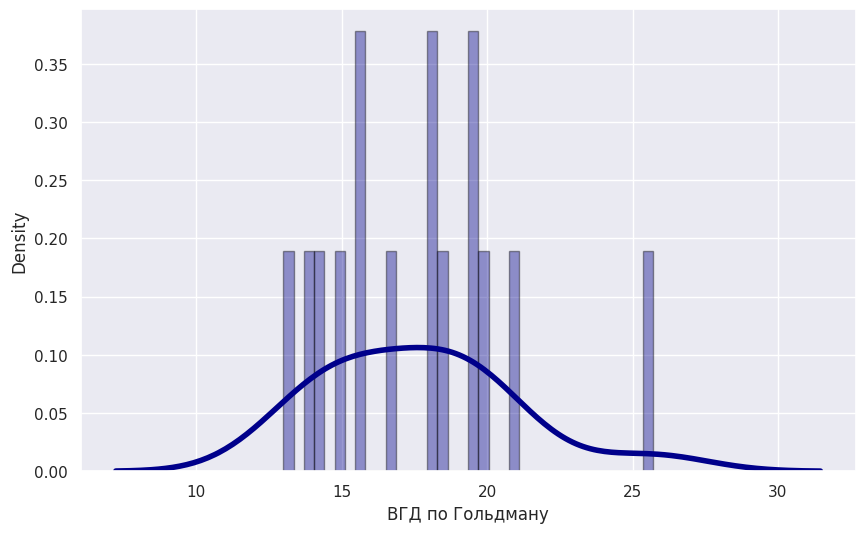

In [ ]:
sns.distplot(data_2_stage['ВГД по Гольдману'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ВГД по Гольдману']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.942, p-value=0.413
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ВГД по Гольдману']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.470, p-value=0.176
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Фактор резистентности роговицы

<ipython-input-326-f9c59a87b4c1>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Фактор резистентности роговицы'], hist=True, kde=True,


<Axes: xlabel='Фактор резистентности роговицы', ylabel='Density'>

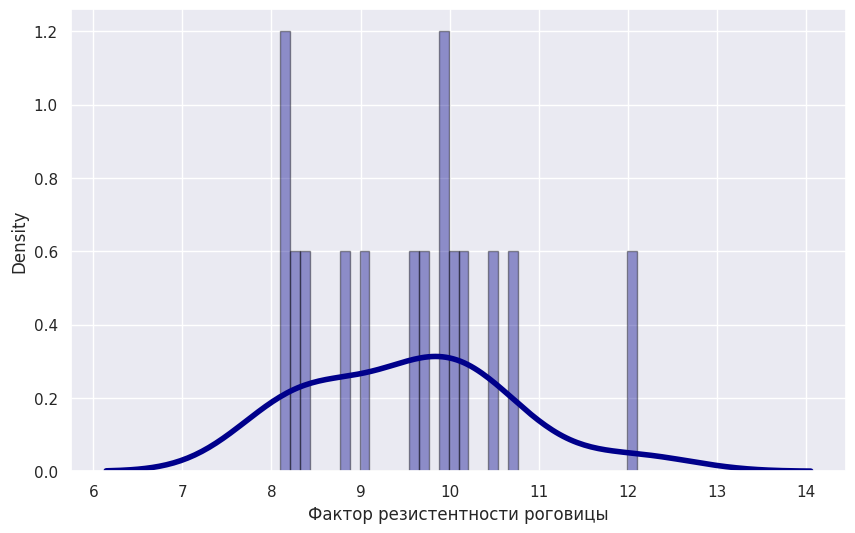

In [ ]:
sns.distplot(data_2_stage['Фактор резистентности роговицы'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Фактор резистентности роговицы']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.938, p-value=0.361
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Фактор резистентности роговицы']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.161, p-value=0.560
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### КГ

<ipython-input-329-a3a76b47673f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['КГ'], hist=True, kde=True,


<Axes: xlabel='КГ', ylabel='Density'>

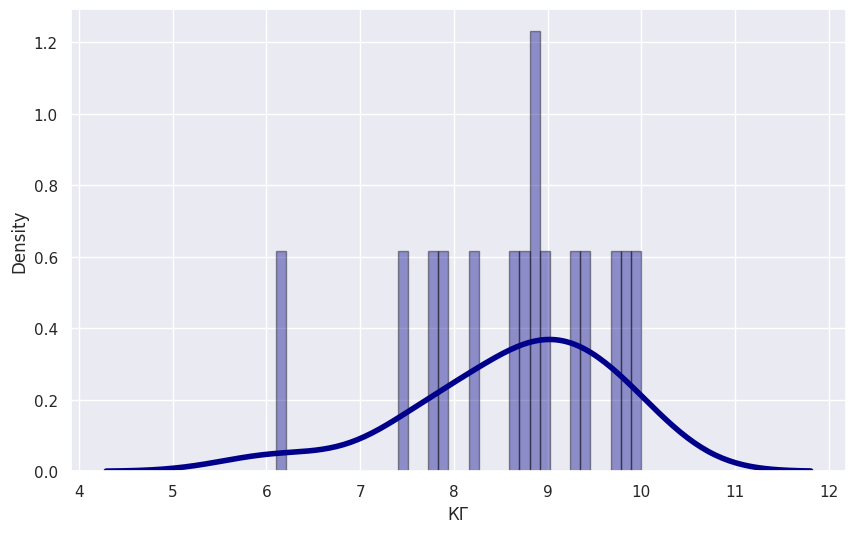

In [ ]:
sns.distplot(data_2_stage['КГ'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['КГ']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.932, p-value=0.292
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['КГ']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.502, p-value=0.105
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ЦТР

<ipython-input-332-e88052d6fad4>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ЦТР'], hist=True, kde=True,


<Axes: xlabel='ЦТР', ylabel='Density'>

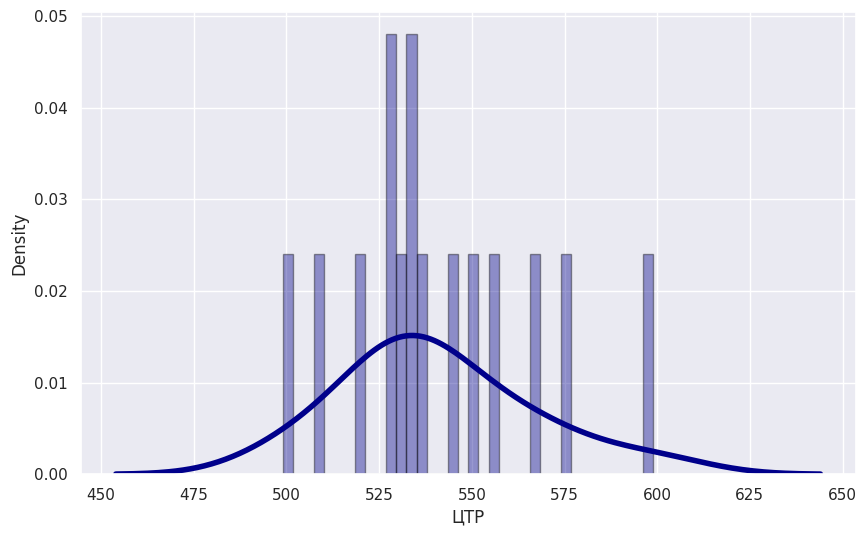

In [ ]:
sns.distplot(data_2_stage['ЦТР'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ЦТР']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.964, p-value=0.768
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ЦТР']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.066, p-value=0.356
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### РП

<ipython-input-335-234f9445db49>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['РП'], hist=True, kde=True,


<Axes: xlabel='РП', ylabel='Density'>

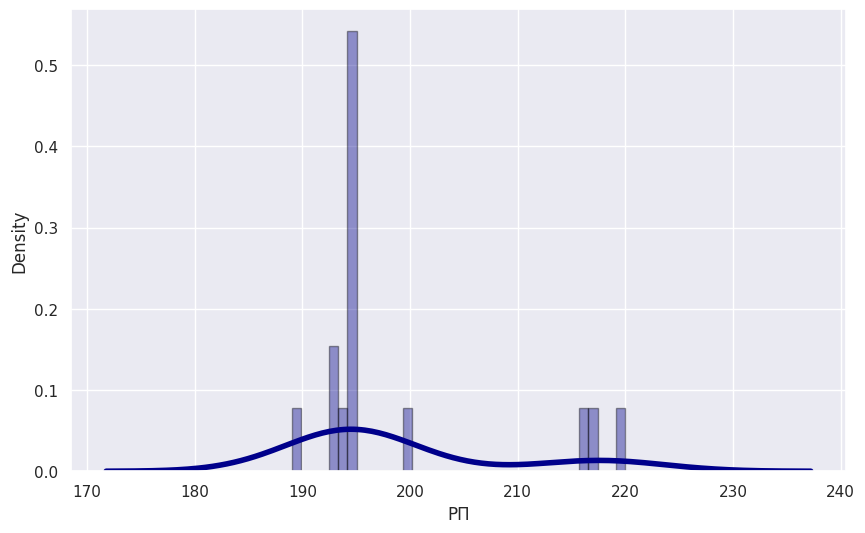

In [ ]:
sns.distplot(data_2_stage['РП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['РП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.694, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['РП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.701, p-value=0.035
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ГлРП

<ipython-input-338-6fe08ab9b1eb>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ГлРП'], hist=True, kde=True,


<Axes: xlabel='ГлРП', ylabel='Density'>

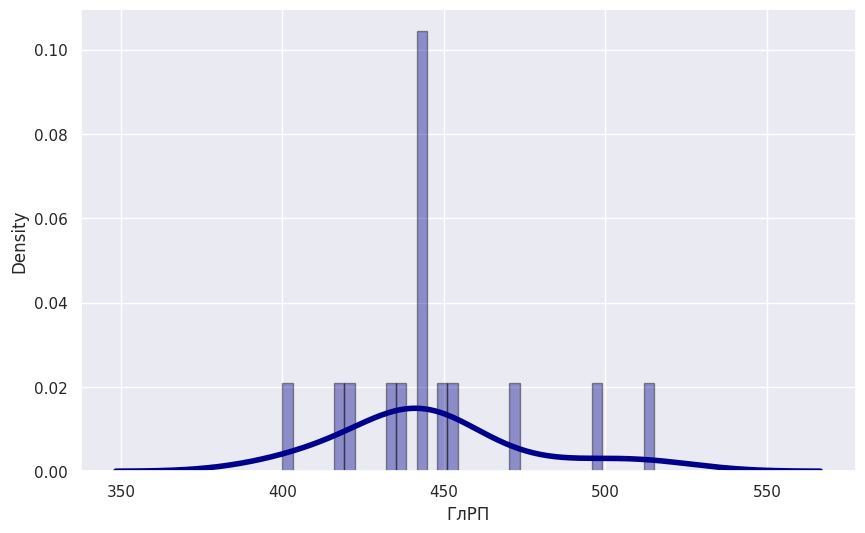

In [ ]:
sns.distplot(data_2_stage['ГлРП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ГлРП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.896, p-value=0.082
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ГлРП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.401, p-value=0.111
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


### gamma Ш

<ipython-input-341-5465096ab696>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['gamma Ш'], hist=True, kde=True,


<Axes: xlabel='gamma Ш', ylabel='Density'>

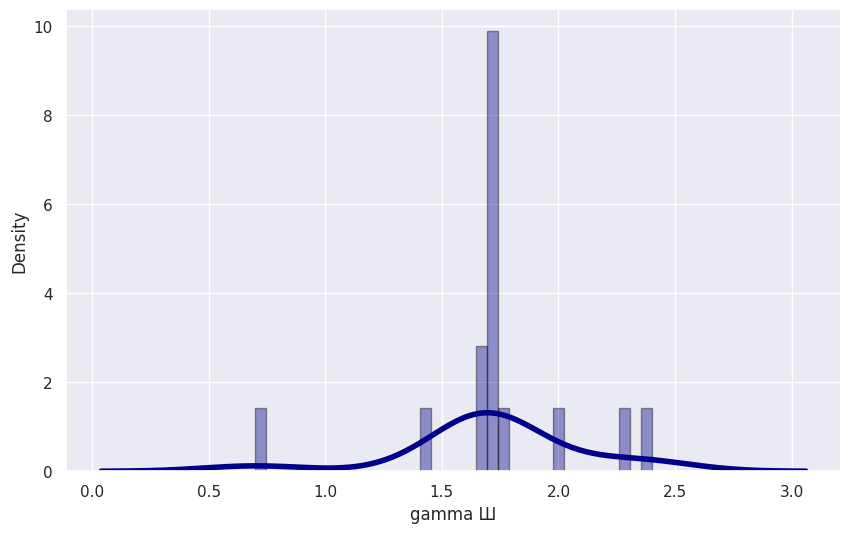

In [ ]:
sns.distplot(data_2_stage['gamma Ш'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['gamma Ш']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.796, p-value=0.003
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['gamma Ш']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=7.665, p-value=0.022
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---










---








### Efrid

<ipython-input-344-850da428336c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Efrid'], hist=True, kde=True,


<Axes: xlabel='Efrid', ylabel='Density'>

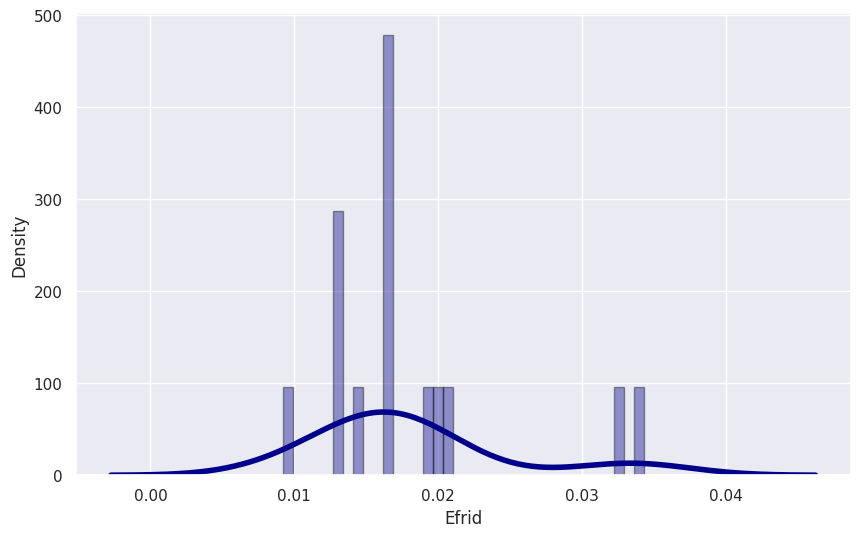

In [ ]:
sns.distplot(data_2_stage['Efrid'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Efrid']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.815, p-value=0.006
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Efrid']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=8.939, p-value=0.011
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### SVL

<ipython-input-347-46f49139602d>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['SVL'], hist=True, kde=True,


<Axes: xlabel='SVL', ylabel='Density'>

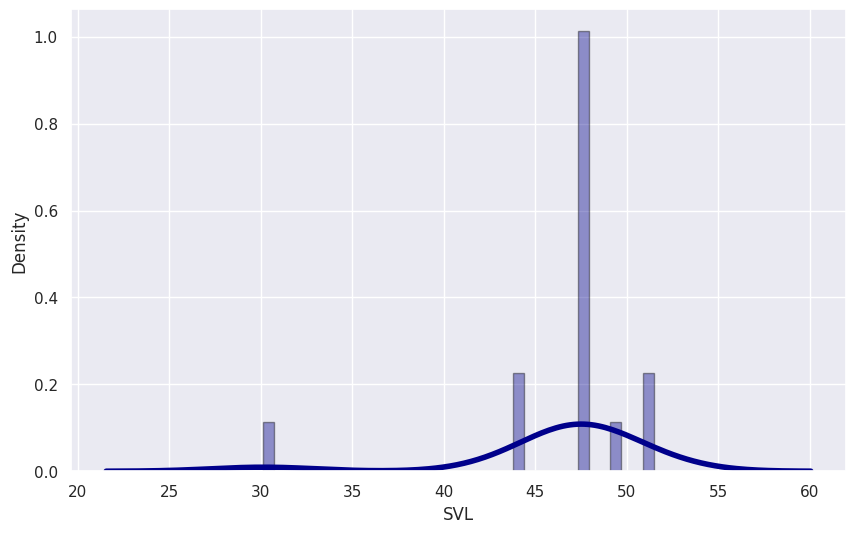

In [ ]:
sns.distplot(data_2_stage['SVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['SVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.625, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['SVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=28.661, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### DVL

<ipython-input-350-aa5ed0f2e470>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['DVL'], hist=True, kde=True,


<Axes: xlabel='DVL', ylabel='Density'>

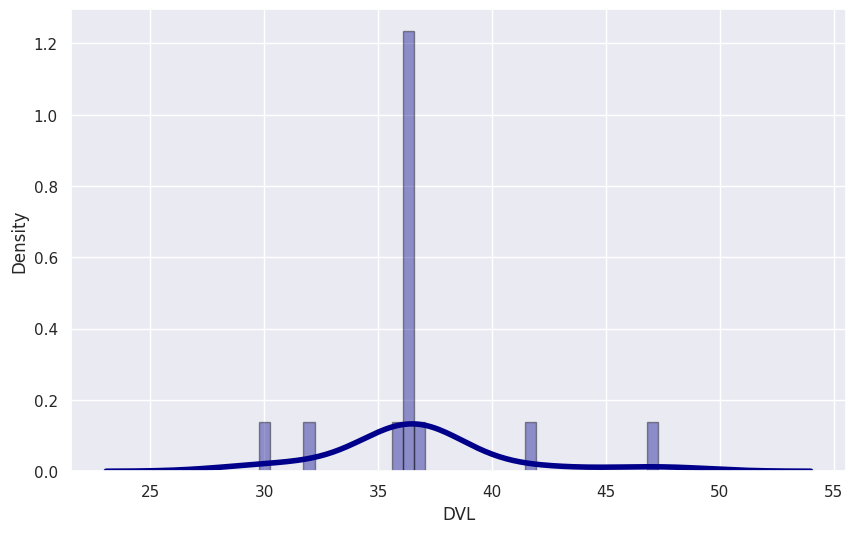

In [ ]:
sns.distplot(data_2_stage['DVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['DVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.747, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['DVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=9.579, p-value=0.008
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### РИ (рео. индекс) мОм

<ipython-input-353-07aa63f05b1c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,


<Axes: xlabel='РИ (рео.индекс) мОм', ylabel='Density'>

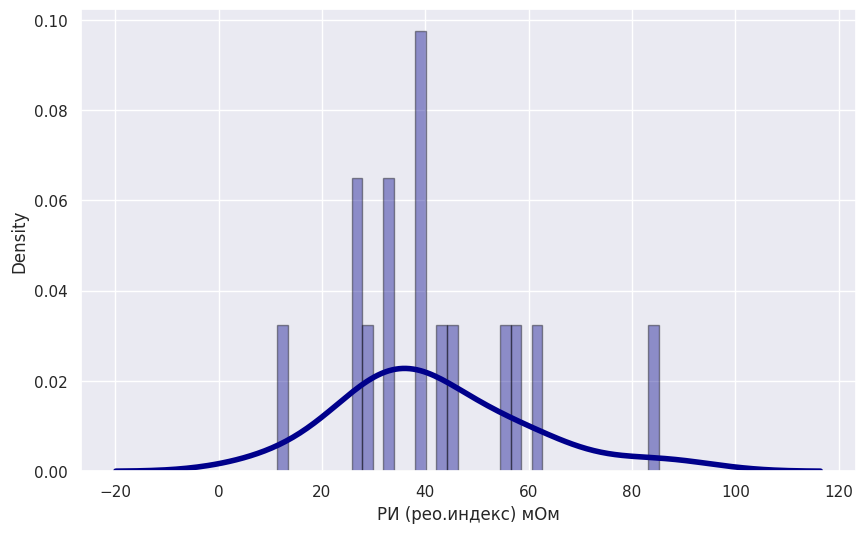

In [ ]:
sns.distplot(data_2_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['РИ (рео.индекс) мОм']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.940, p-value=0.376
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['РИ (рео.индекс) мОм']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.132, p-value=0.127
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМН (макс. нап)

<ipython-input-356-56a95047acb5>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ПМН (макс.нап)'], hist=True, kde=True,


<Axes: xlabel='ПМН (макс.нап)', ylabel='Density'>

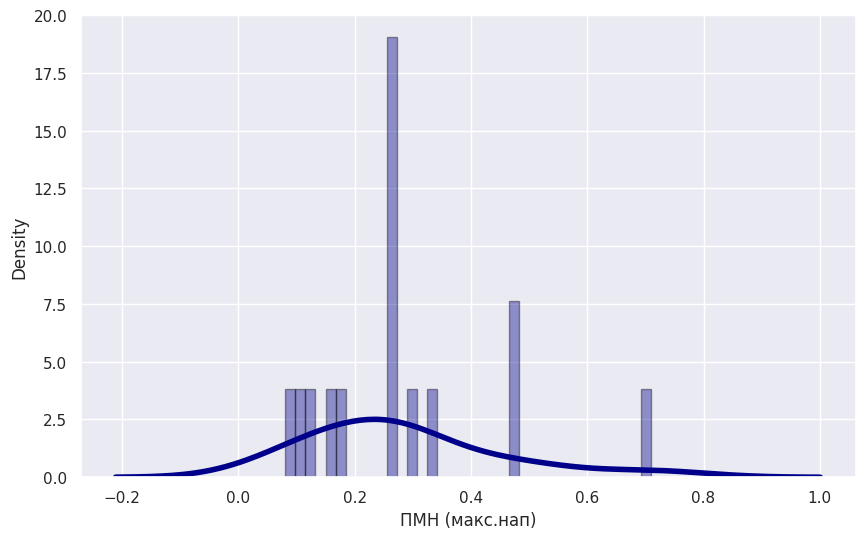

In [ ]:
sns.distplot(data_2_stage['ПМН (макс.нап)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ПМН (макс.нап)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.880, p-value=0.047
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ПМН (макс.нап)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=7.048, p-value=0.029
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМУ (мод.упр.)

<ipython-input-359-8f3cf69fe230>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['ПМУ (мод.упр.)'], hist=True, kde=True,


<Axes: xlabel='ПМУ (мод.упр.)', ylabel='Density'>

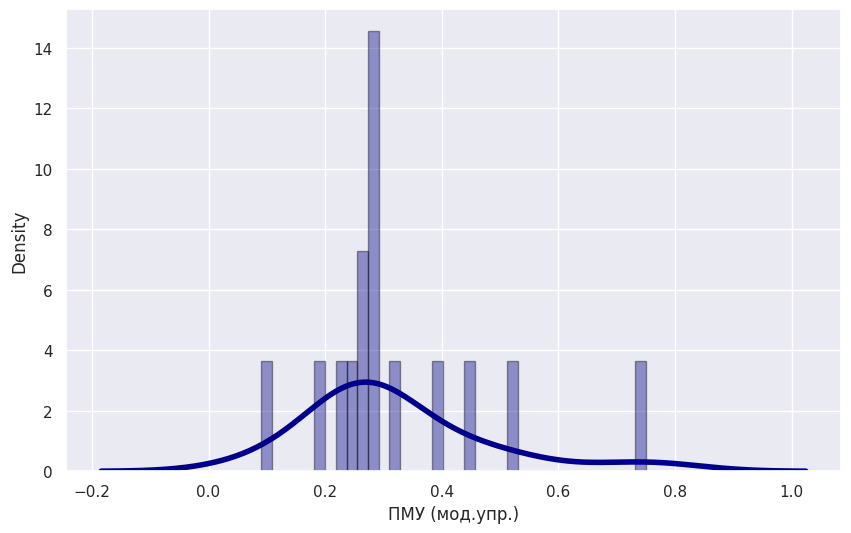

In [ ]:
sns.distplot(data_2_stage['ПМУ (мод.упр.)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['ПМУ (мод.упр.)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.849, p-value=0.017
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['ПМУ (мод.упр.)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=11.015, p-value=0.004
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (отн.)

<ipython-input-362-5dc94f98e898>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Z баз.(отн.))'], hist=True, kde=True,


<Axes: xlabel='Z баз.(отн.))', ylabel='Density'>

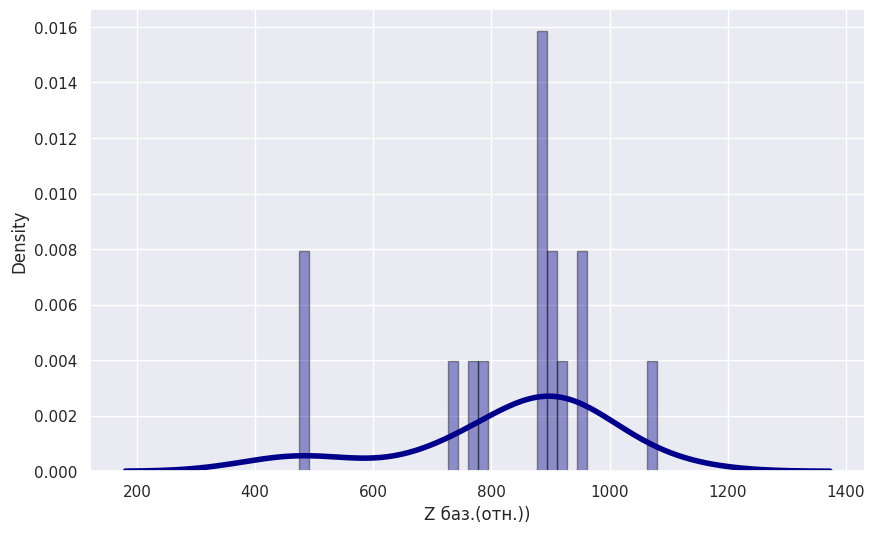

In [ ]:
sns.distplot(data_2_stage['Z баз.(отн.))'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Z баз.(отн.))']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.835, p-value=0.011
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Z баз.(отн.))']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.269, p-value=0.044
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (мОм)

<ipython-input-365-47a102590f41>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['Z баз.(мОм)'], hist=True, kde=True,


<Axes: xlabel='Z баз.(мОм)', ylabel='Density'>

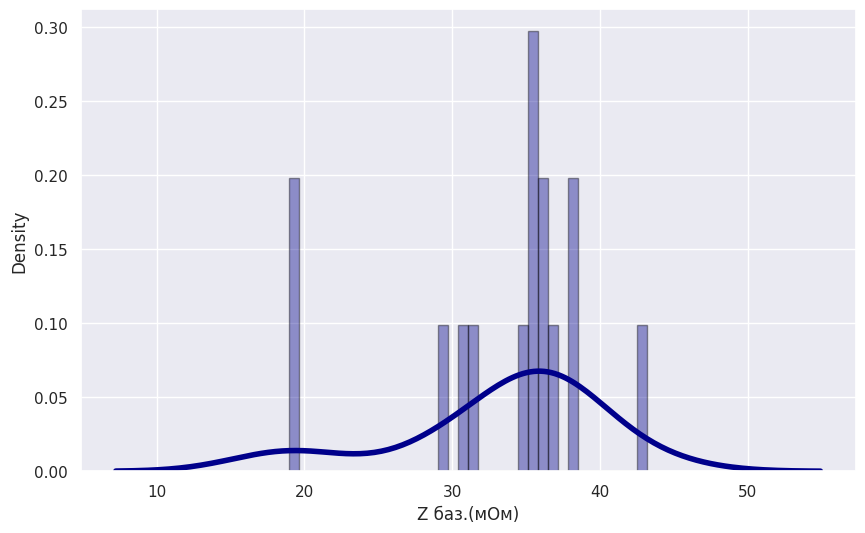

In [ ]:
sns.distplot(data_2_stage['Z баз.(мОм)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['Z баз.(мОм)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.835, p-value=0.011
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['Z баз.(мОм)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.269, p-value=0.044
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)




---








### УОК (уд. объем) мкл

<ipython-input-368-dab54c8374e7>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_2_stage['УОК (уд.объем) мкл'], hist=True, kde=True,


<Axes: xlabel='УОК (уд.объем) мкл', ylabel='Density'>

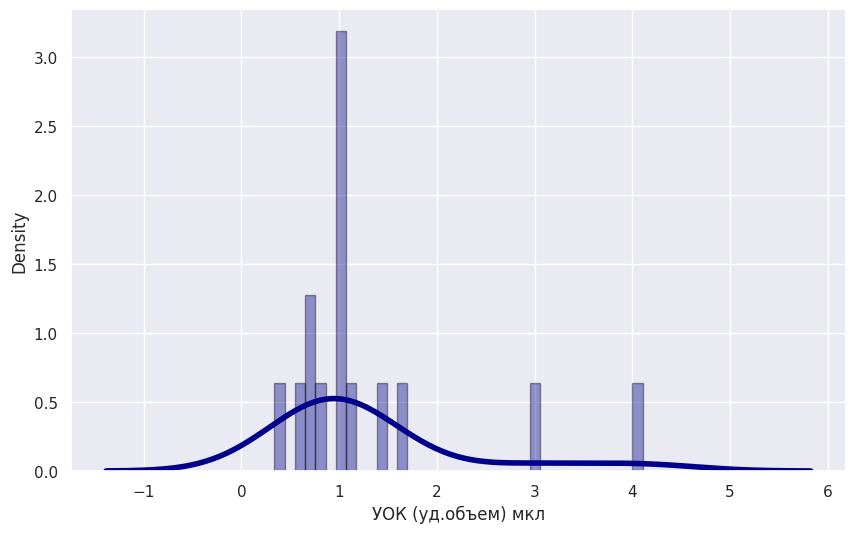

In [ ]:
sns.distplot(data_2_stage['УОК (уд.объем) мкл'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_2_stage['УОК (уд.объем) мкл']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.726, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_2_stage['УОК (уд.объем) мкл']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=17.051, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)


## Пациенты с 3й стадией заболевания

Проверим на нормальность данные пациентов с 3й стадией заболевания

### Возраст

<ipython-input-371-71d7032f0aeb>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['возраст'], hist=True, kde=True,


<Axes: xlabel='возраст', ylabel='Density'>

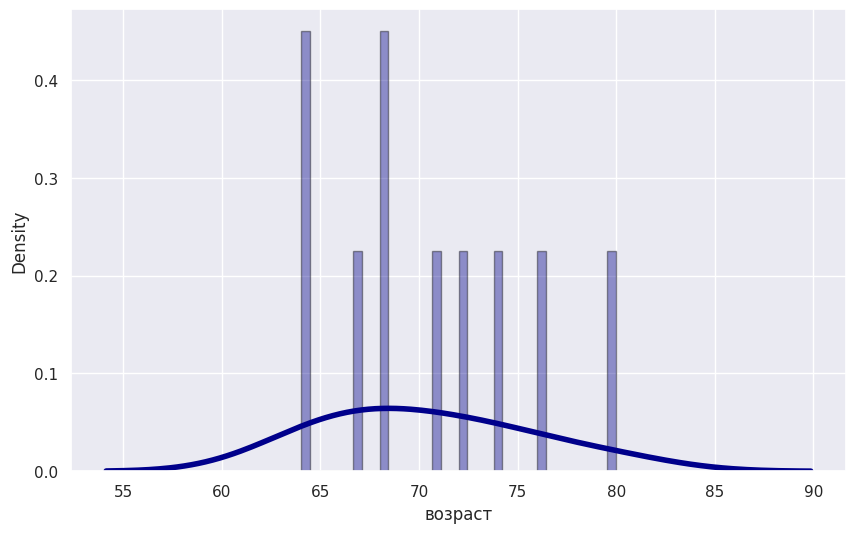

In [ ]:
sns.distplot(data_3_stage['возраст'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['возраст']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.950, p-value=0.671
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['возраст']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.614, p-value=0.736
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Величина внутриглазного давления

<ipython-input-374-d9469df688bd>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['величина внутриглазного давления'], hist=True, kde=True,


<Axes: xlabel='величина внутриглазного давления', ylabel='Density'>

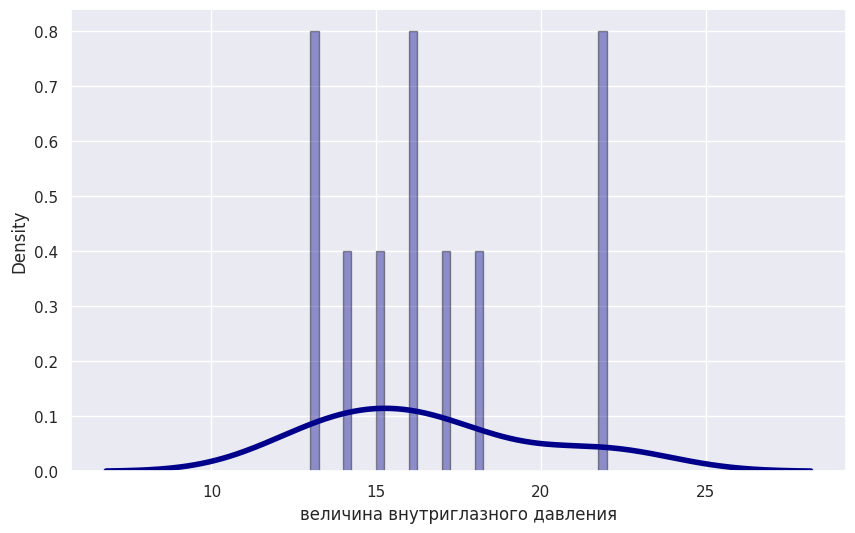

In [ ]:
sns.distplot(data_3_stage['величина внутриглазного давления'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['величина внутриглазного давления']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.883, p-value=0.142
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['величина внутриглазного давления']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.426, p-value=0.490
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД, корригированного на коэффициент ригидности



<ipython-input-377-5e2a9f092264>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,


<Axes: xlabel='ВГД, корригированного на коэффициент ригидности', ylabel='Density'>

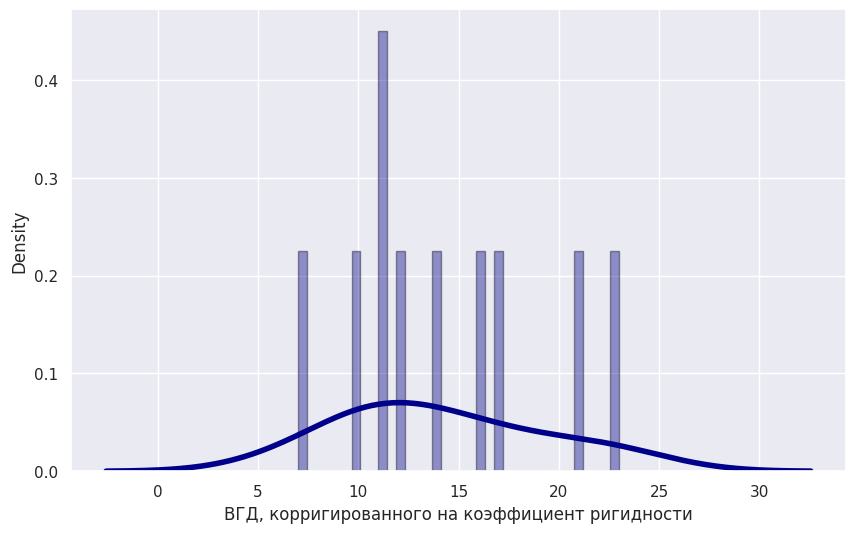

In [ ]:
sns.distplot(data_3_stage['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ВГД, корригированного на коэффициент ригидности']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.951, p-value=0.683
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ВГД, корригированного на коэффициент ригидности']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.708, p-value=0.702
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Коэффициент ригидности склеральной капсулы глаза

<ipython-input-380-2dbaf0d0f7b3>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,


<Axes: xlabel='Коэфф ригидности склеральн капсулы глаза', ylabel='Density'>

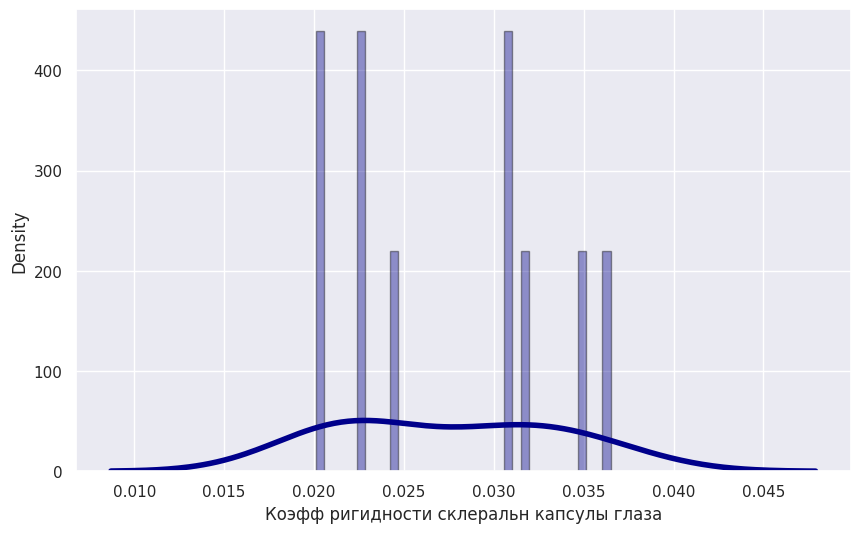

In [ ]:
sns.distplot(data_3_stage['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Коэфф ригидности склеральн капсулы глаза']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.904, p-value=0.244
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Коэфф ригидности склеральн капсулы глаза']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.602, p-value=0.272
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Роговично-компенсированное ВГД

<ipython-input-383-8e1471d323f1>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,


<Axes: xlabel='Роговично-компенсированное ВГД', ylabel='Density'>

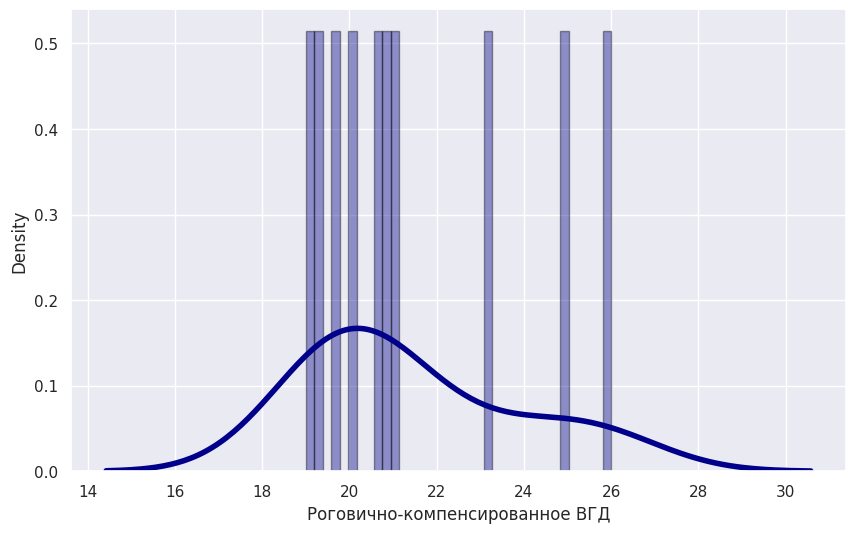

In [ ]:
sns.distplot(data_3_stage['Роговично-компенсированное ВГД'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Роговично-компенсированное ВГД']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.864, p-value=0.086
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Роговично-компенсированное ВГД']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.311, p-value=0.315
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ВГД по Гольдману

<ipython-input-386-cb027aac6d0e>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ВГД по Гольдману'], hist=True, kde=True,


<Axes: xlabel='ВГД по Гольдману', ylabel='Density'>

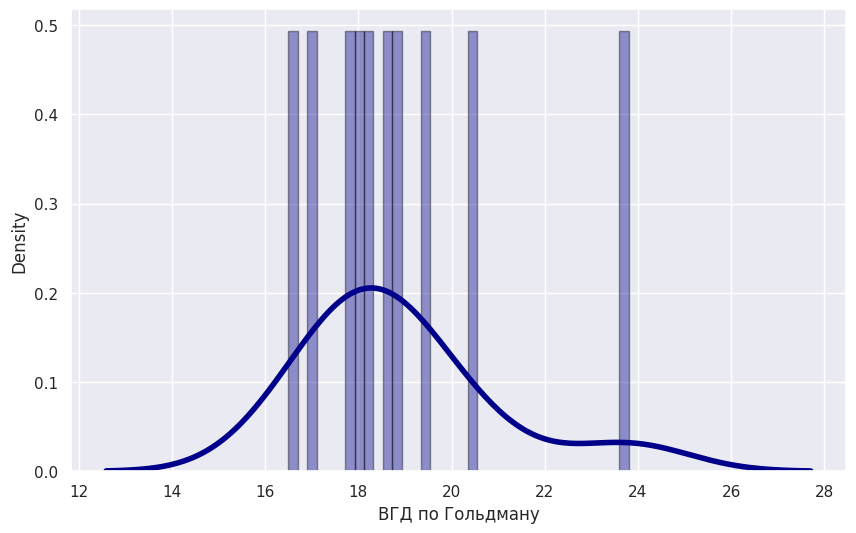

In [ ]:
sns.distplot(data_3_stage['ВГД по Гольдману'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ВГД по Гольдману']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.874, p-value=0.112
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ВГД по Гольдману']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=8.765, p-value=0.012
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Фактор резистентности роговицы

<ipython-input-389-bab464e78f35>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Фактор резистентности роговицы'], hist=True, kde=True,


<Axes: xlabel='Фактор резистентности роговицы', ylabel='Density'>

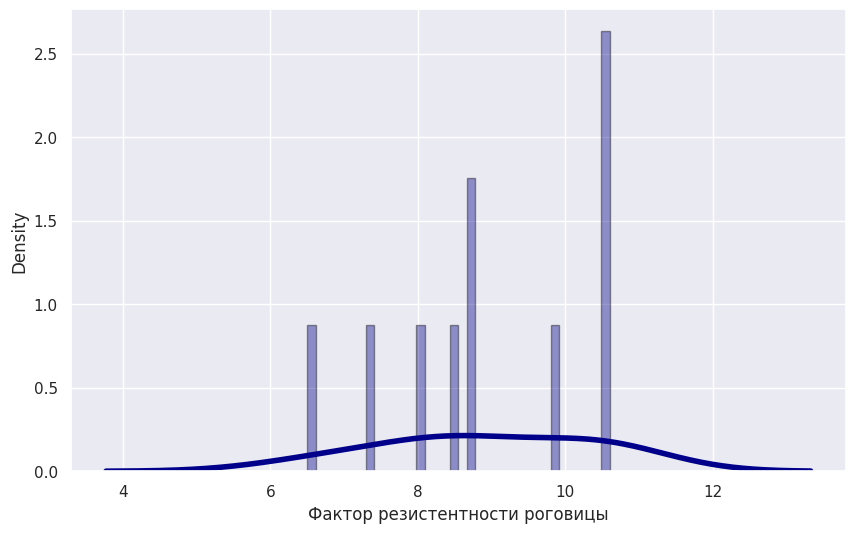

In [ ]:
sns.distplot(data_3_stage['Фактор резистентности роговицы'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Фактор резистентности роговицы']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.919, p-value=0.349
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Фактор резистентности роговицы']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.786, p-value=0.675
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### КГ

<ipython-input-392-5133419e5a09>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['КГ'], hist=True, kde=True,


<Axes: xlabel='КГ', ylabel='Density'>

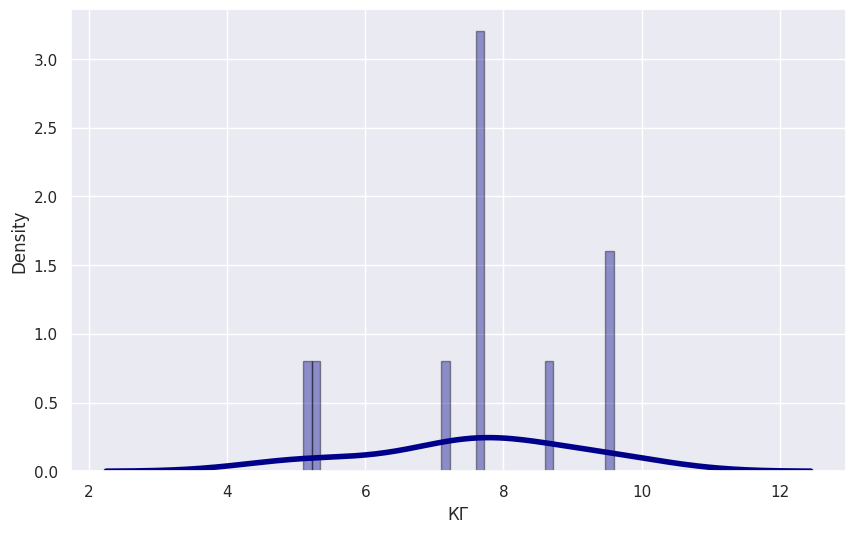

In [ ]:
sns.distplot(data_3_stage['КГ'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['КГ']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.906, p-value=0.256
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['КГ']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.437, p-value=0.804
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ЦТР

<ipython-input-395-449a47005b5e>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ЦТР'], hist=True, kde=True,


<Axes: xlabel='ЦТР', ylabel='Density'>

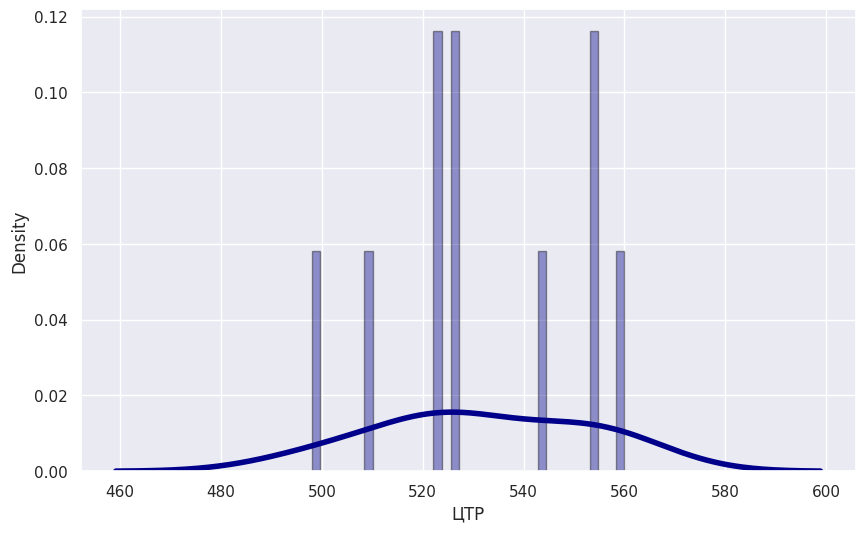

In [ ]:
sns.distplot(data_3_stage['ЦТР'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ЦТР']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.936, p-value=0.514
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ЦТР']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.564, p-value=0.754
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### РП

<ipython-input-398-66b9207cb78c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['РП'], hist=True, kde=True,


<Axes: xlabel='РП', ylabel='Density'>

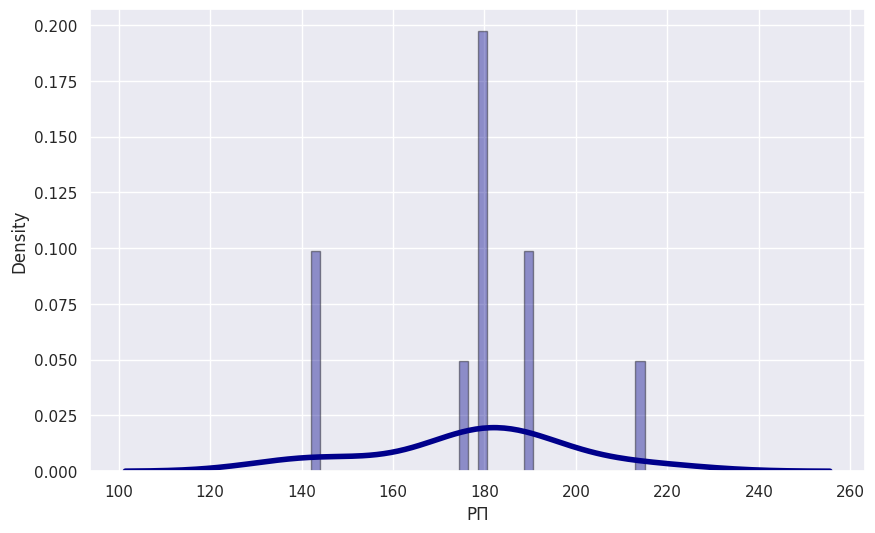

In [ ]:
sns.distplot(data_3_stage['РП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['РП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.872, p-value=0.107
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['РП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.888, p-value=0.641
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ГлРП

<ipython-input-401-d58541a41216>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ГлРП'], hist=True, kde=True,


<Axes: xlabel='ГлРП', ylabel='Density'>

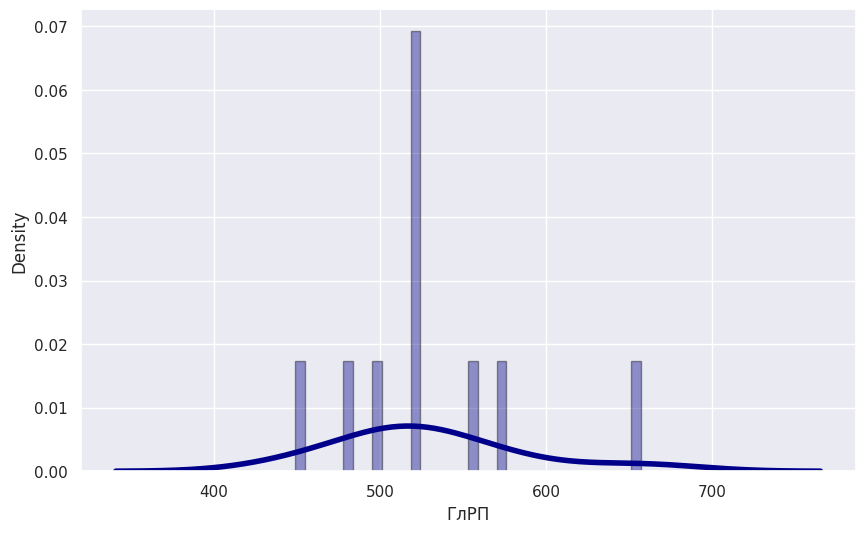

In [ ]:
sns.distplot(data_3_stage['ГлРП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ГлРП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.908, p-value=0.265
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ГлРП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.860, p-value=0.088
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)


### gamma Ш

<ipython-input-404-de0386c4e7e5>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['gamma Ш'], hist=True, kde=True,


<Axes: xlabel='gamma Ш', ylabel='Density'>

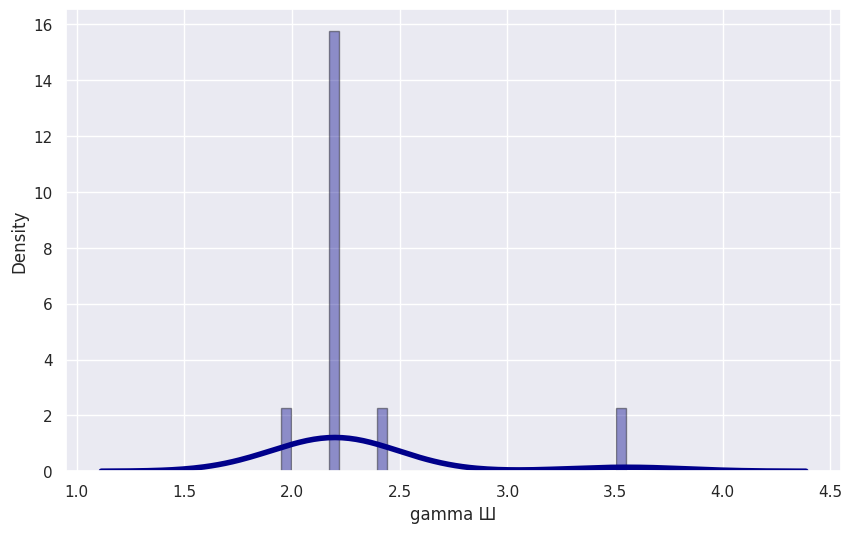

In [ ]:
sns.distplot(data_3_stage['gamma Ш'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['gamma Ш']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.551, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['gamma Ш']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=24.228, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---










---








### Efrid

<ipython-input-407-1fdf524a17a5>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Efrid'], hist=True, kde=True,


<Axes: xlabel='Efrid', ylabel='Density'>

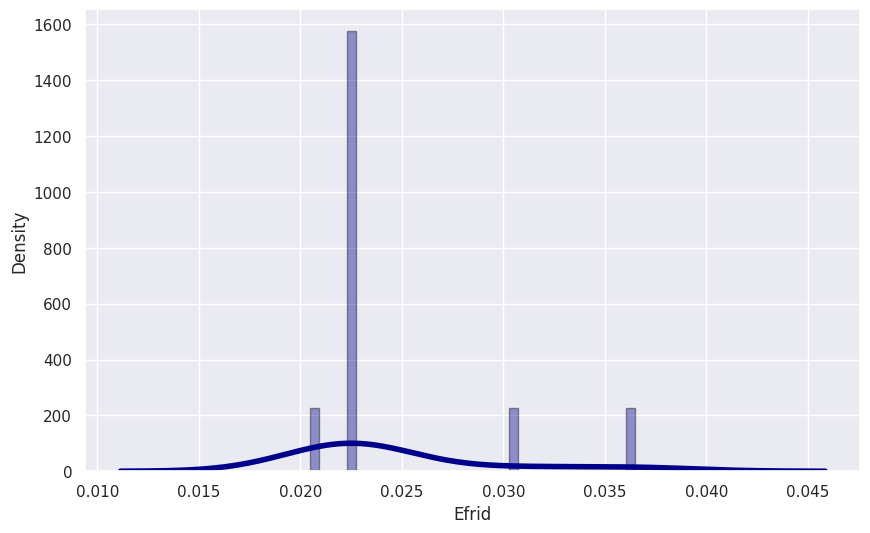

In [ ]:
sns.distplot(data_3_stage['Efrid'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Efrid']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.632, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Efrid']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=11.890, p-value=0.003
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### SVL

<ipython-input-410-881a3b8a616f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['SVL'], hist=True, kde=True,


<Axes: xlabel='SVL', ylabel='Density'>

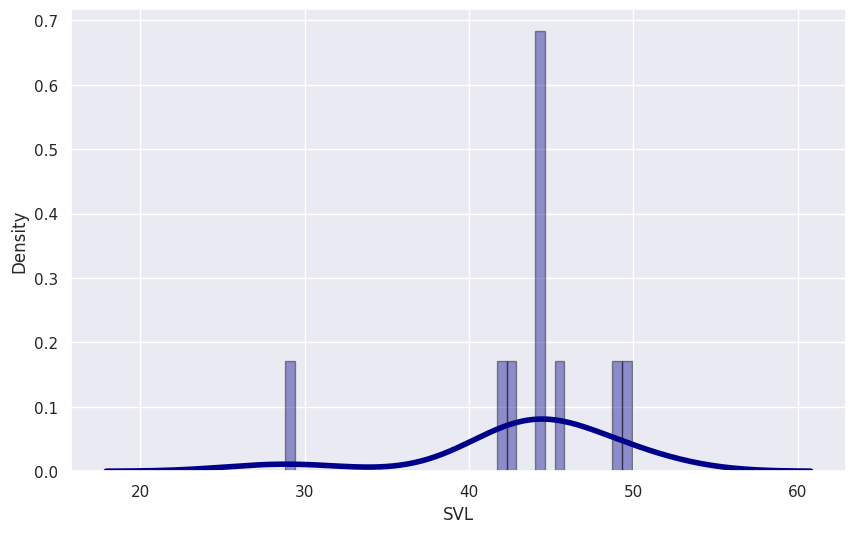

In [ ]:
sns.distplot(data_3_stage['SVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['SVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.761, p-value=0.005
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['SVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=14.232, p-value=0.001
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### DVL

<ipython-input-413-e85b6a5b8c88>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['DVL'], hist=True, kde=True,


<Axes: xlabel='DVL', ylabel='Density'>

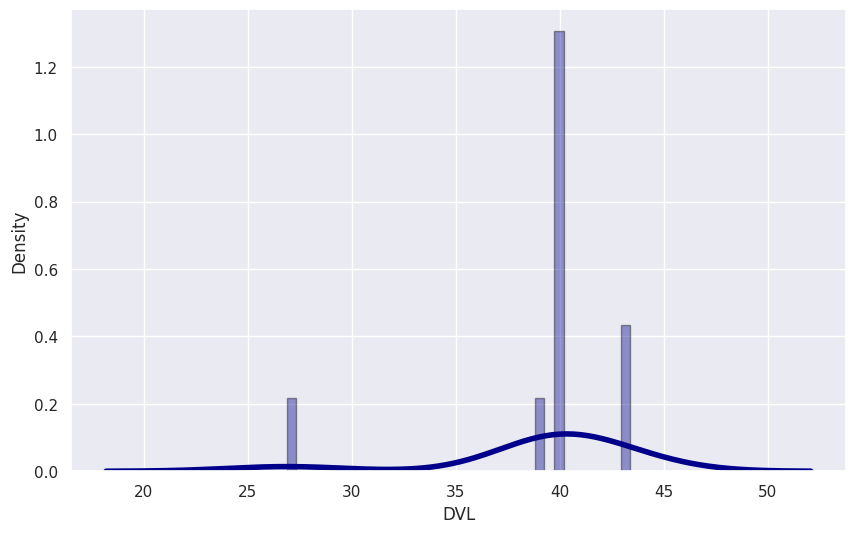

In [ ]:
sns.distplot(data_3_stage['DVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['DVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.634, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['DVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=20.800, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### РИ (рео. индекс) мОм

<ipython-input-416-499c29a774e0>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,


<Axes: xlabel='РИ (рео.индекс) мОм', ylabel='Density'>

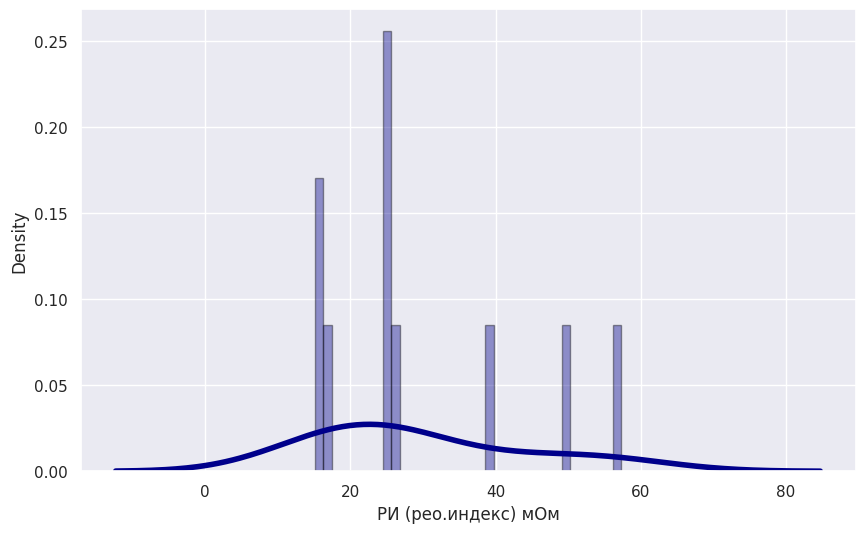

In [ ]:
sns.distplot(data_3_stage['РИ (рео.индекс) мОм'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['РИ (рео.индекс) мОм']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.860, p-value=0.077
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['РИ (рео.индекс) мОм']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.187, p-value=0.335
Принять гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМН (макс. нап)

<ipython-input-419-7c704f5767c2>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ПМН (макс.нап)'], hist=True, kde=True,


<Axes: xlabel='ПМН (макс.нап)', ylabel='Density'>

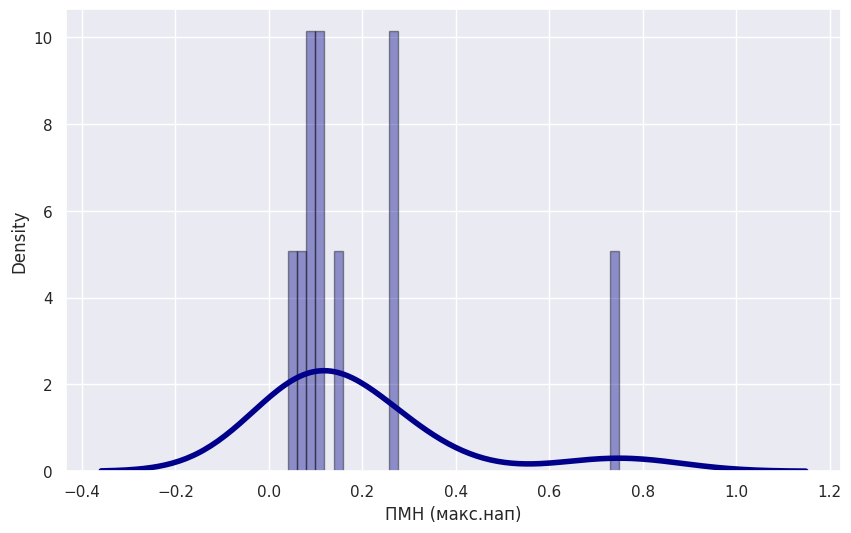

In [ ]:
sns.distplot(data_3_stage['ПМН (макс.нап)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ПМН (макс.нап)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.680, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ПМН (макс.нап)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=18.736, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### ПМУ (мод.упр.)

<ipython-input-422-1bdb7d4d6f4b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['ПМУ (мод.упр.)'], hist=True, kde=True,


<Axes: xlabel='ПМУ (мод.упр.)', ylabel='Density'>

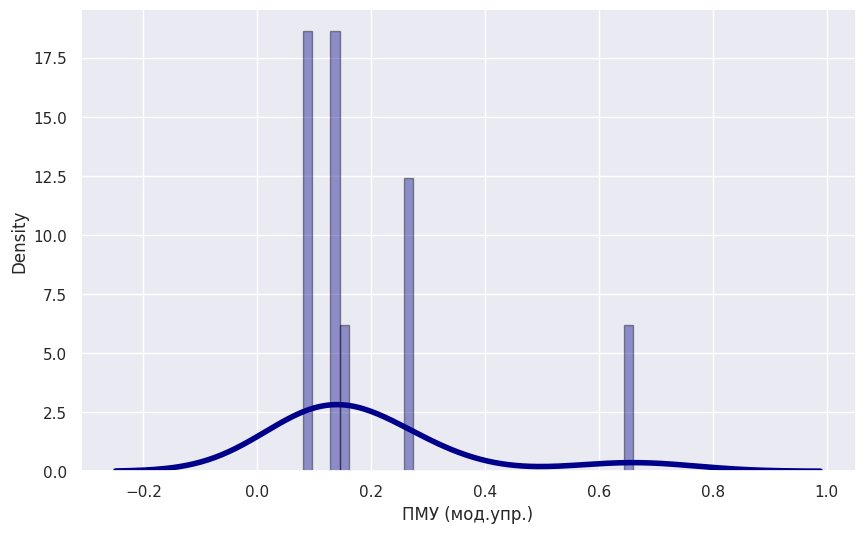

In [ ]:
sns.distplot(data_3_stage['ПМУ (мод.упр.)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['ПМУ (мод.упр.)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.678, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['ПМУ (мод.упр.)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=18.966, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (отн.)

<ipython-input-425-19254dbe6f8f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Z баз.(отн.))'], hist=True, kde=True,


<Axes: xlabel='Z баз.(отн.))', ylabel='Density'>

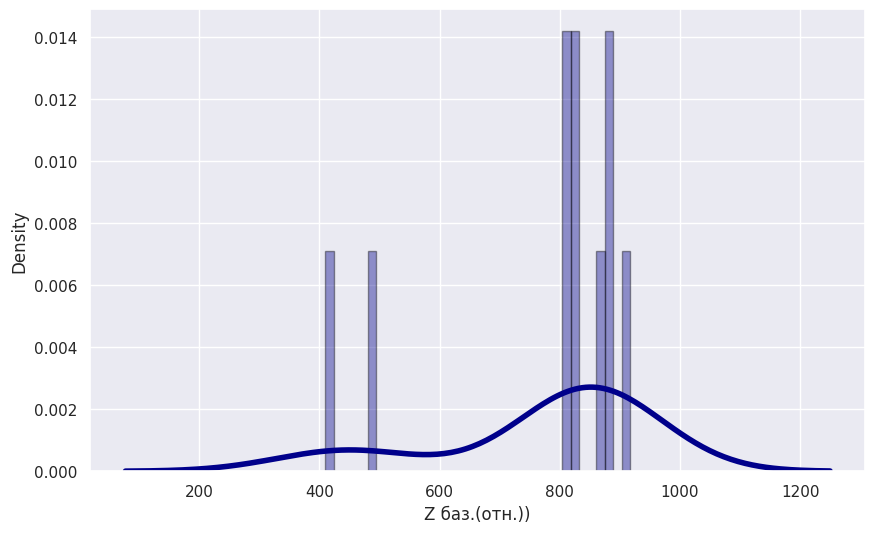

In [ ]:
sns.distplot(data_3_stage['Z баз.(отн.))'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Z баз.(отн.))']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.714, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Z баз.(отн.))']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.528, p-value=0.038
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### Z баз. (мОм)

<ipython-input-428-fc95fb252ac8>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['Z баз.(мОм)'], hist=True, kde=True,


<Axes: xlabel='Z баз.(мОм)', ylabel='Density'>

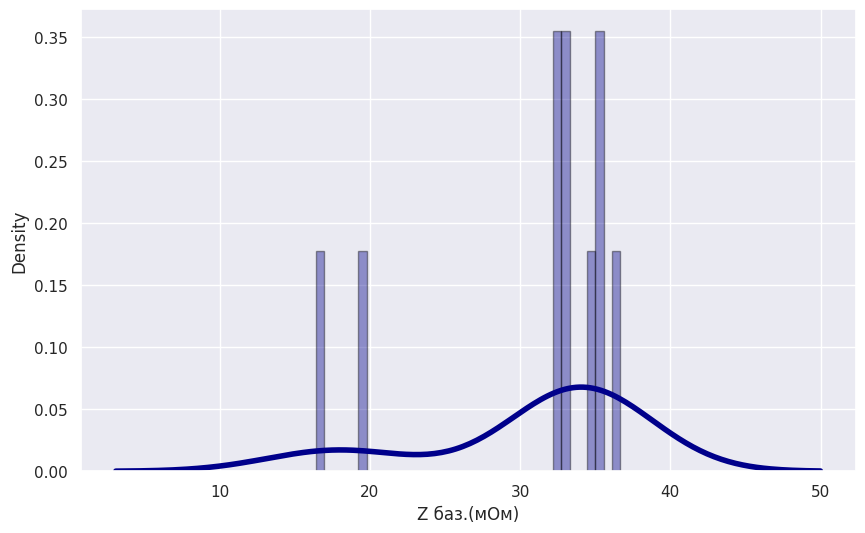

In [ ]:
sns.distplot(data_3_stage['Z баз.(мОм)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['Z баз.(мОм)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.714, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['Z баз.(мОм)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.528, p-value=0.038
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)




---








### УОК (уд. объем) мкл

<ipython-input-431-e2289fd502b4>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_3_stage['УОК (уд.объем) мкл'], hist=True, kde=True,


<Axes: xlabel='УОК (уд.объем) мкл', ylabel='Density'>

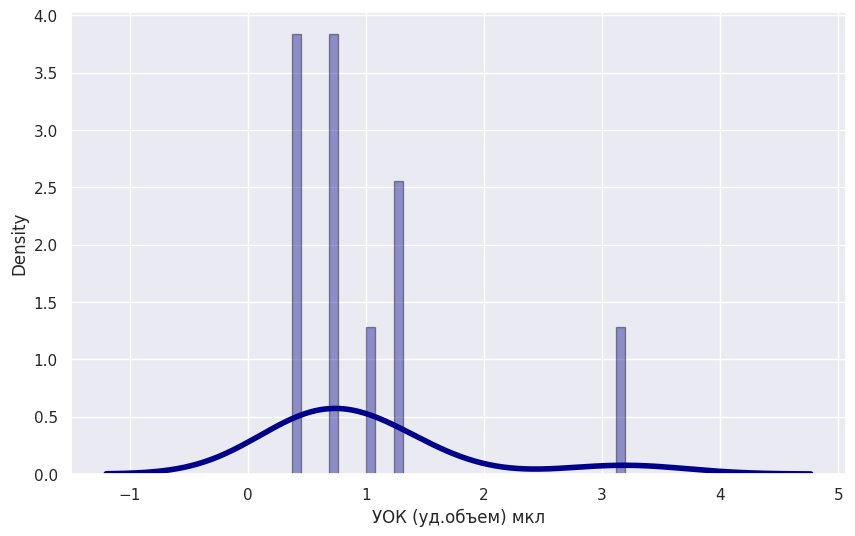

In [ ]:
sns.distplot(data_3_stage['УОК (уд.объем) мкл'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_3_stage['УОК (уд.объем) мкл']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.716, p-value=0.001
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_3_stage['УОК (уд.объем) мкл']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=17.604, p-value=0.000
Отклонить гипотезу о нормальности


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  res = hypotest_fun_out(*samples, **kwds)


## Все пациенты

Проверим на нормальность данные всех пациентов

In [ ]:
#объединим все таблицы
data_glaucoma_all=pd.concat([data_healthy, data_1_stage, data_2_stage, data_3_stage], axis=0)

In [ ]:
data_glaucoma_all

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,уланкина,25,0,10,12,0.0162,9.70,9.40,9.30,11.3,...,1.75,0.0162,56.300000,46.030000,49.650,0.27,0.250,979,39.16,1.157570
1,степанова,26,0,12,15,0.0162,18.50,19.90,12.80,11.6,...,1.85,0.0162,50.960000,44.210000,51.555,0.28,0.275,948,37.92,1.252867
2,кудасов,32,0,10,12,0.0162,14.30,12.00,8.30,9.2,...,1.70,0.0138,53.580000,47.400000,102.330,0.13,0.140,1060,42.40,2.203474
3,Иванов,32,0,10,12,0.0162,17.60,13.90,7.60,7.6,...,1.70,0.0138,56.297266,45.462070,58.430,0.20,0.210,1063,42.52,1.254623
4,гладих,68,0,10,14,0.0138,20.10,17.20,8.80,7.9,...,1.75,0.0138,48.680000,45.880000,20.970,0.13,0.140,725,29.00,0.660193
5,мыздриков,59,0,12,14,0.0161,8.50,8.10,9.10,11.4,...,1.85,0.0161,53.560000,48.420000,35.500,0.52,0.420,917,36.68,0.883629
6,Савинова,66,0,15,23,0.0076,17.80,15.60,9.10,9.6,...,1.30,0.0076,48.710000,45.880000,49.880,0.29,0.300,910,36.40,1.251111
7,Иванов,66,0,12,16,0.0140,17.80,15.60,9.10,9.6,...,1.70,0.0140,52.440000,45.880000,53.230,0.32,0.330,822,32.88,1.478071
8,Мациева,68,0,18,28,0.0052,20.40,20.00,11.30,9.9,...,1.10,0.0052,51.320000,43.700000,51.555,0.28,0.275,948,37.92,1.252867
9,Булат,51,0,12,19,0.0031,17.80,16.50,10.00,9.6,...,0.60,0.0031,52.440000,45.880000,183.500,0.33,0.400,1210,48.40,3.461477


### Возраст

<ipython-input-436-f0d2bc141fa8>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['возраст'], hist=True, kde=True,


<Axes: xlabel='возраст', ylabel='Density'>

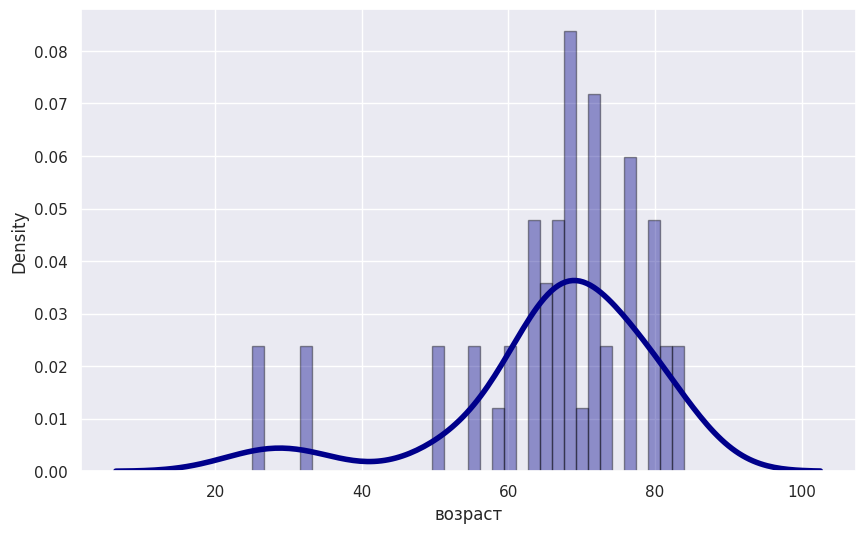

In [ ]:
sns.distplot(data_glaucoma_all['возраст'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['возраст']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.840, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['возраст']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=22.674, p-value=0.000
Отклонить гипотезу о нормальности




---








### Величина внутриглазного давления

<ipython-input-439-783dfb2660ec>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['величина внутриглазного давления'], hist=True, kde=True,


<Axes: xlabel='величина внутриглазного давления', ylabel='Density'>

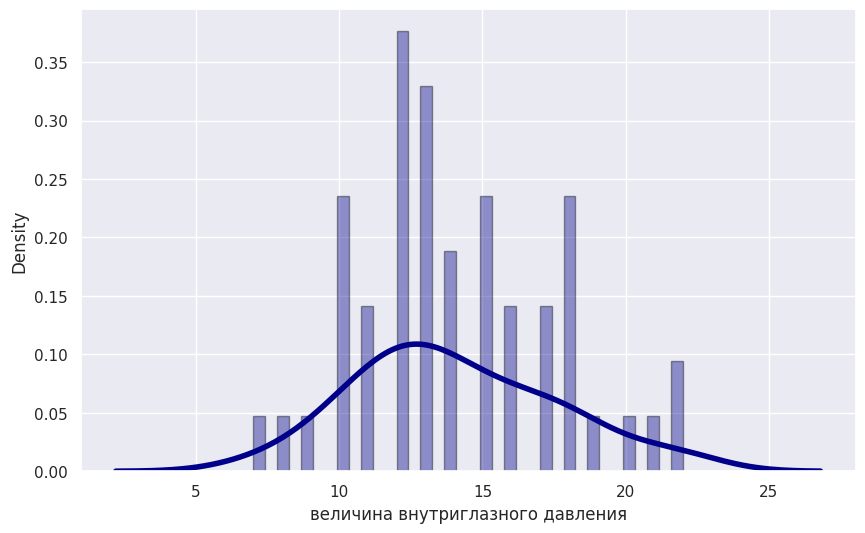

In [ ]:
sns.distplot(data_glaucoma_all['величина внутриглазного давления'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['величина внутриглазного давления']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.971, p-value=0.242
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['величина внутриглазного давления']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.589, p-value=0.452
Принять гипотезу о нормальности




---








### ВГД, корригированного на коэффициент ригидности



<ipython-input-442-5475ef1d4e2c>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,


<Axes: xlabel='ВГД, корригированного на коэффициент ригидности', ylabel='Density'>

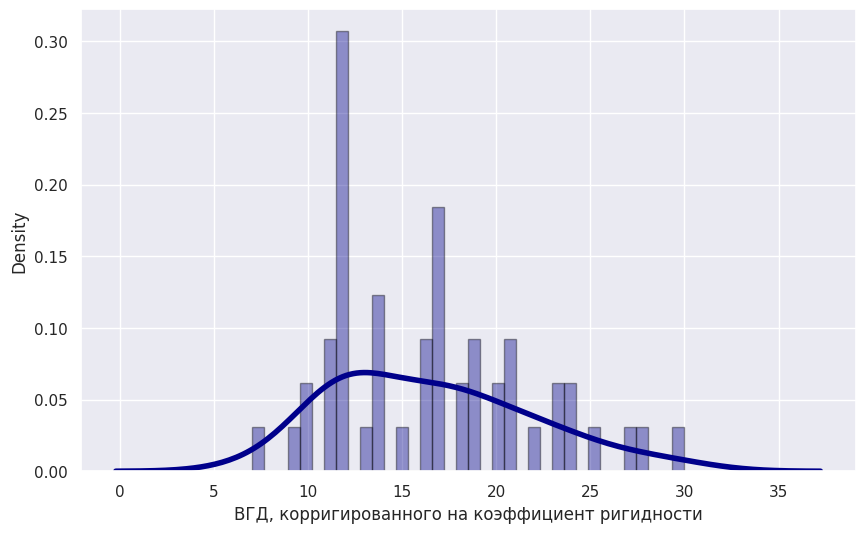

In [ ]:
sns.distplot(data_glaucoma_all['ВГД, корригированного на коэффициент ригидности'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ВГД, корригированного на коэффициент ригидности']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.956, p-value=0.057
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ВГД, корригированного на коэффициент ригидности']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.056, p-value=0.217
Принять гипотезу о нормальности




---








### Коэффициент ригидности склеральной капсулы глаза

<ipython-input-445-ffc1148cd9a6>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,


<Axes: xlabel='Коэфф ригидности склеральн капсулы глаза', ylabel='Density'>

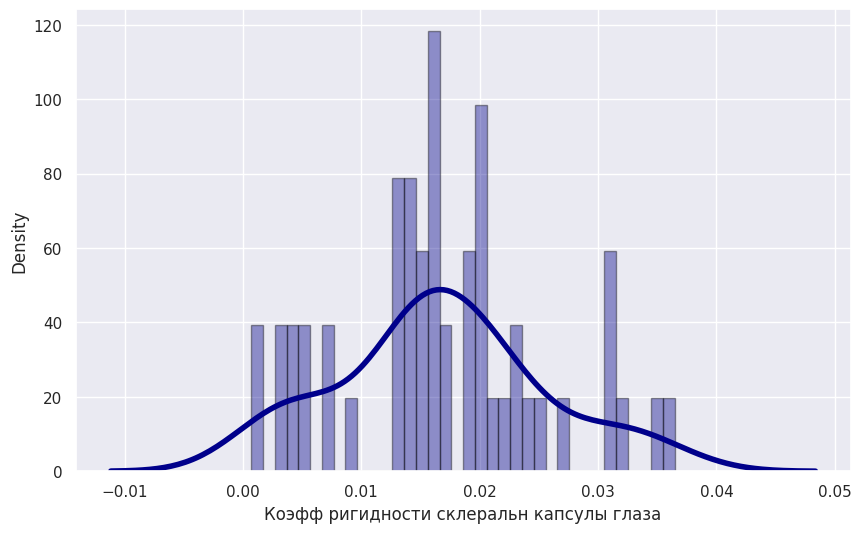

In [ ]:
sns.distplot(data_glaucoma_all['Коэфф ригидности склеральн капсулы глаза'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Коэфф ригидности склеральн капсулы глаза']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.967, p-value=0.170
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Коэфф ригидности склеральн капсулы глаза']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.404, p-value=0.817
Принять гипотезу о нормальности




---








### Роговично-компенсированное ВГД

<ipython-input-448-5843869e868b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Роговично-компенсированное ВГД'], hist=True, kde=True,


<Axes: xlabel='Роговично-компенсированное ВГД', ylabel='Density'>

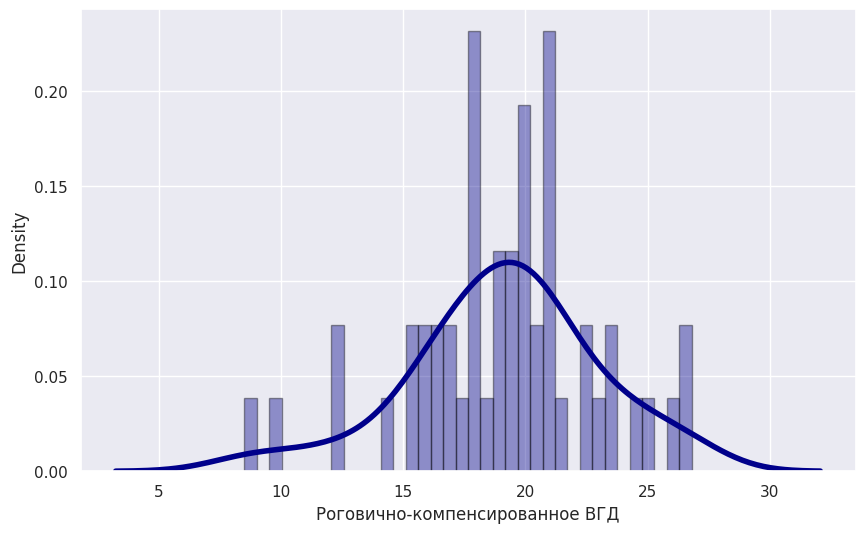

In [ ]:
sns.distplot(data_glaucoma_all['Роговично-компенсированное ВГД'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Роговично-компенсированное ВГД']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.974, p-value=0.321
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Роговично-компенсированное ВГД']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=3.064, p-value=0.216
Принять гипотезу о нормальности




---








### ВГД по Гольдману

<ipython-input-451-217d8865aea7>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ВГД по Гольдману'], hist=True, kde=True,


<Axes: xlabel='ВГД по Гольдману', ylabel='Density'>

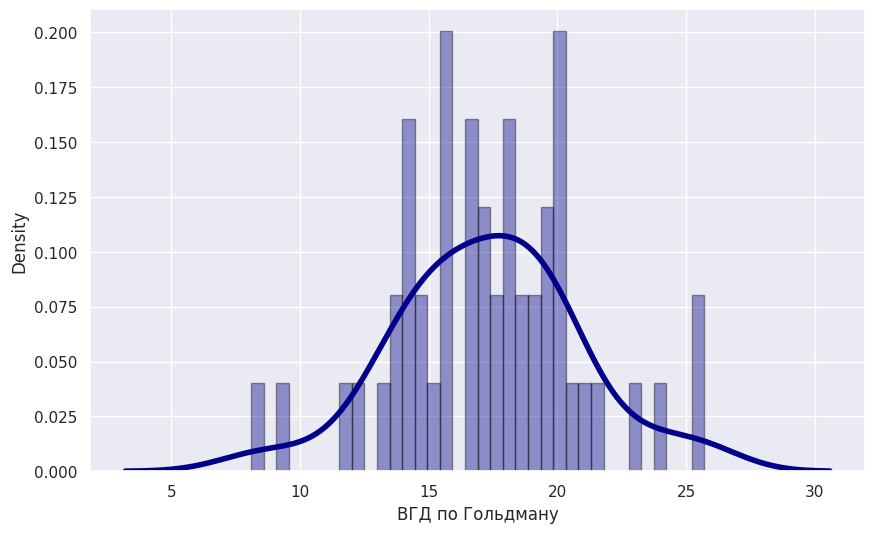

In [ ]:
sns.distplot(data_glaucoma_all['ВГД по Гольдману'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ВГД по Гольдману']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.984, p-value=0.704
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ВГД по Гольдману']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.070, p-value=0.586
Принять гипотезу о нормальности




---








### Фактор резистентности роговицы

<ipython-input-454-b10f0674164d>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Фактор резистентности роговицы'], hist=True, kde=True,


<Axes: xlabel='Фактор резистентности роговицы', ylabel='Density'>

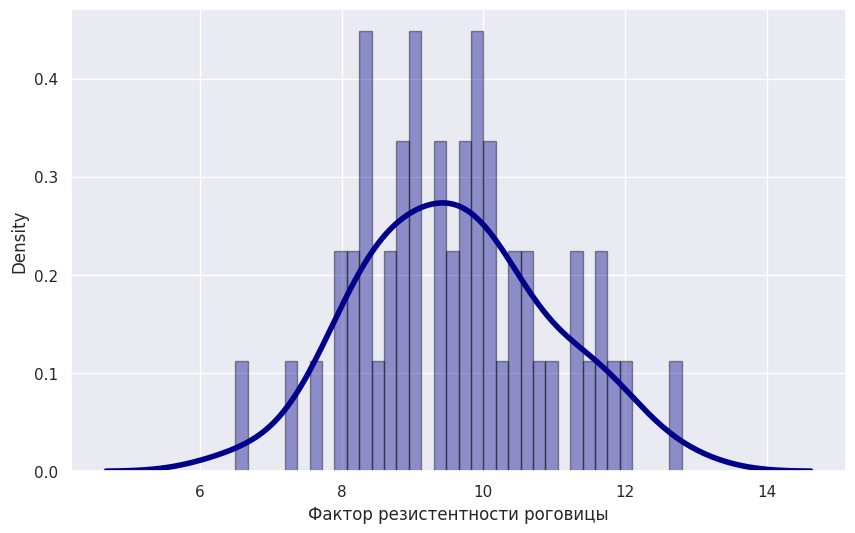

In [ ]:
sns.distplot(data_glaucoma_all['Фактор резистентности роговицы'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Фактор резистентности роговицы']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.989, p-value=0.921
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Фактор резистентности роговицы']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.416, p-value=0.812
Принять гипотезу о нормальности




---








### КГ

<ipython-input-457-70b3e0aefb49>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['КГ'], hist=True, kde=True,


<Axes: xlabel='КГ', ylabel='Density'>

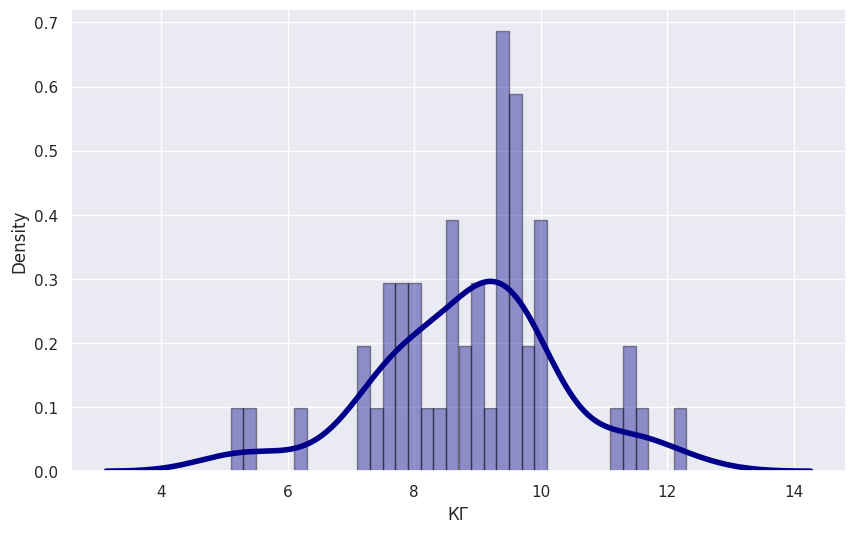

In [ ]:
sns.distplot(data_glaucoma_all['КГ'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['КГ']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.967, p-value=0.166
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['КГ']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=2.259, p-value=0.323
Принять гипотезу о нормальности




---








### ЦТР

<ipython-input-460-7b6b00e29f6b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ЦТР'], hist=True, kde=True,


<Axes: xlabel='ЦТР', ylabel='Density'>

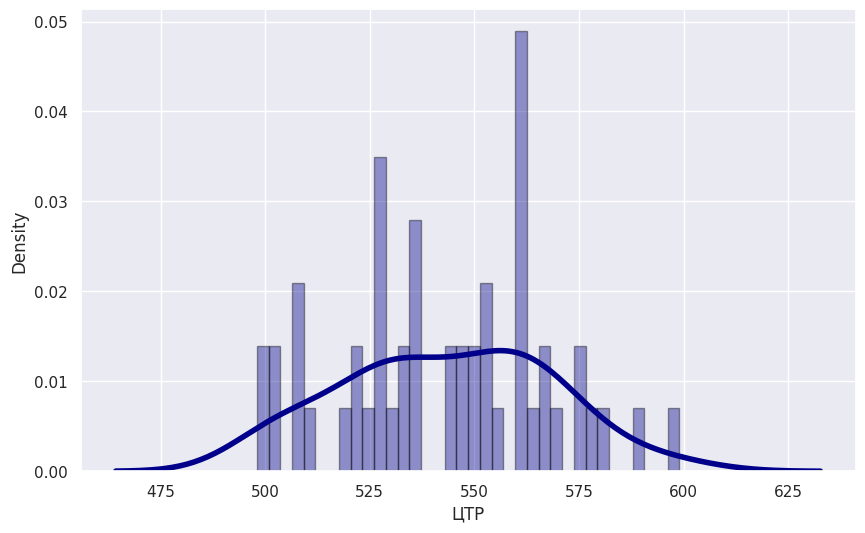

In [ ]:
sns.distplot(data_glaucoma_all['ЦТР'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ЦТР']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.978, p-value=0.458
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ЦТР']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.397, p-value=0.497
Принять гипотезу о нормальности




---








### РП

<ipython-input-463-b6a641766e54>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['РП'], hist=True, kde=True,


<Axes: xlabel='РП', ylabel='Density'>

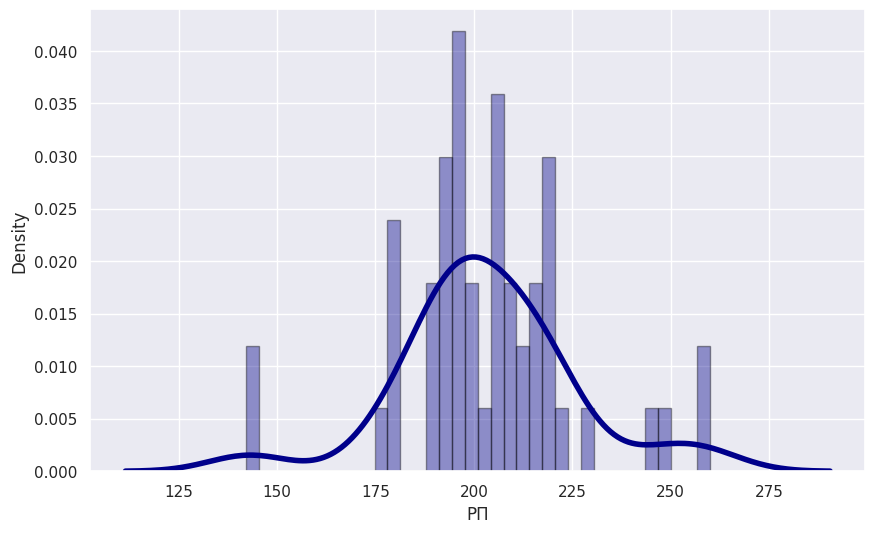

In [ ]:
sns.distplot(data_glaucoma_all['РП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['РП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.934, p-value=0.007
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['РП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=4.660, p-value=0.097
Принять гипотезу о нормальности




---








### ГлРП

<ipython-input-466-9b6a400edfe1>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ГлРП'], hist=True, kde=True,


<Axes: xlabel='ГлРП', ylabel='Density'>

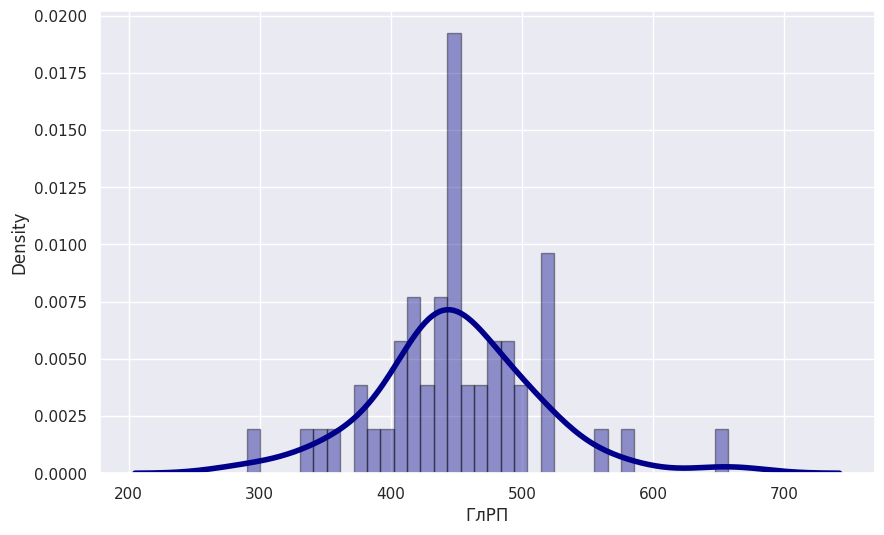

In [ ]:
sns.distplot(data_glaucoma_all['ГлРП'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ГлРП']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.965, p-value=0.137
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ГлРП']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=6.576, p-value=0.037
Отклонить гипотезу о нормальности


### gamma Ш

<ipython-input-469-1c77d68868f0>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['gamma Ш'], hist=True, kde=True,


<Axes: xlabel='gamma Ш', ylabel='Density'>

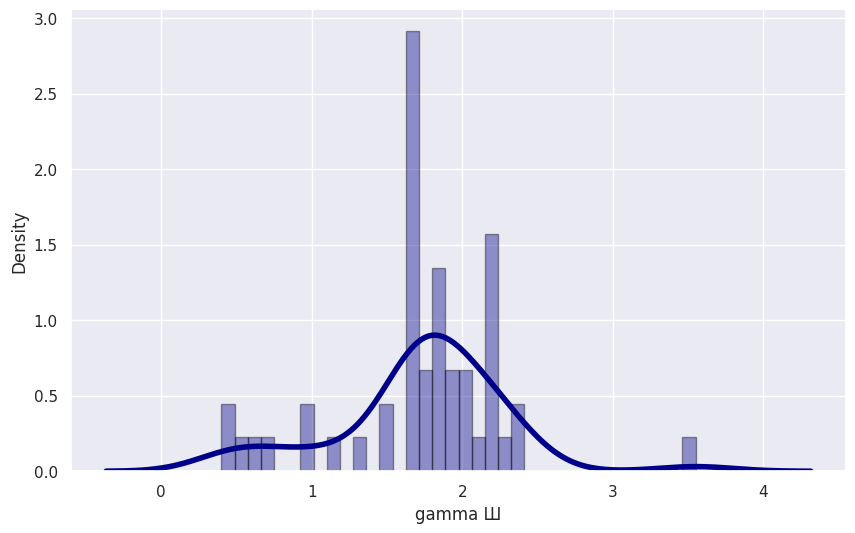

In [ ]:
sns.distplot(data_glaucoma_all['gamma Ш'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['gamma Ш']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.895, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['gamma Ш']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=5.866, p-value=0.053
Принять гипотезу о нормальности




---










---








### Efrid

<ipython-input-472-4731306f7f42>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Efrid'], hist=True, kde=True,


<Axes: xlabel='Efrid', ylabel='Density'>

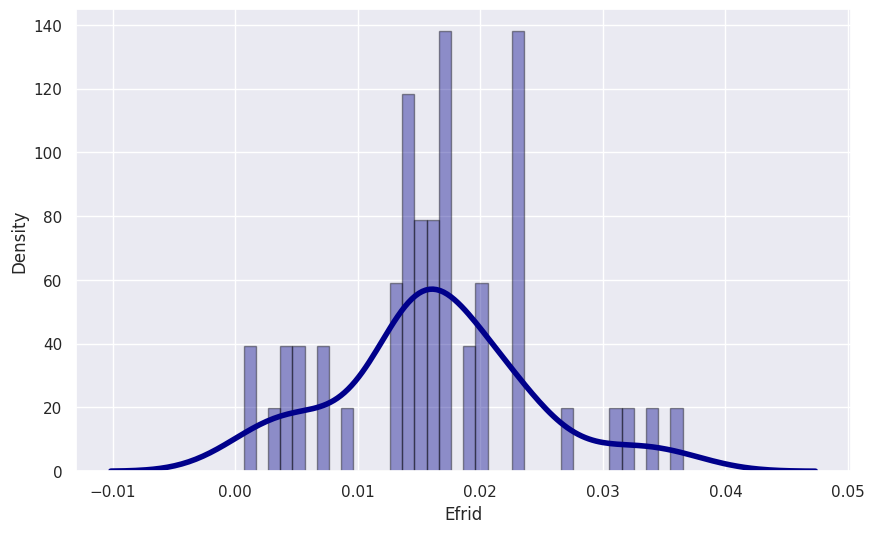

In [ ]:
sns.distplot(data_glaucoma_all['Efrid'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Efrid']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.955, p-value=0.053
Принять гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Efrid']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.557, p-value=0.459
Принять гипотезу о нормальности




---








### SVL

<ipython-input-475-5f5e85b5e12f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['SVL'], hist=True, kde=True,


<Axes: xlabel='SVL', ylabel='Density'>

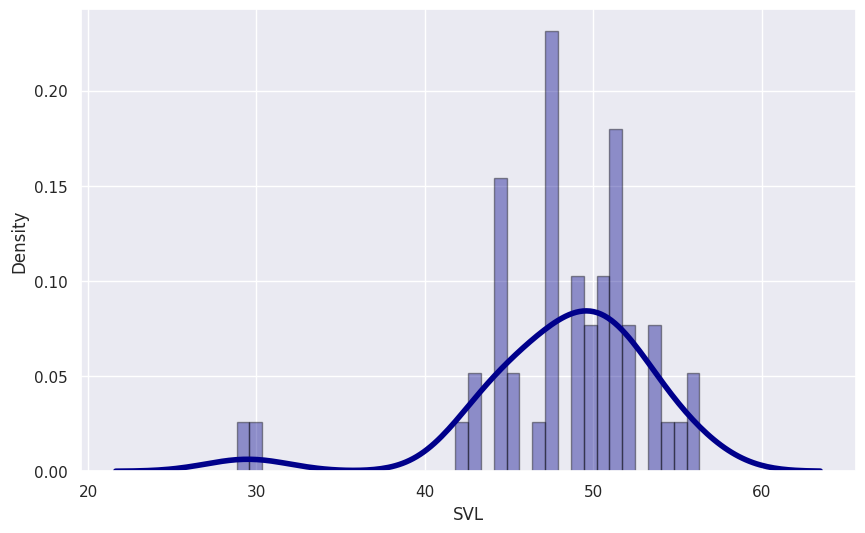

In [ ]:
sns.distplot(data_glaucoma_all['SVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['SVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.861, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['SVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=28.872, p-value=0.000
Отклонить гипотезу о нормальности




---








### DVL

<ipython-input-478-0130d445d8d3>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['DVL'], hist=True, kde=True,


<Axes: xlabel='DVL', ylabel='Density'>

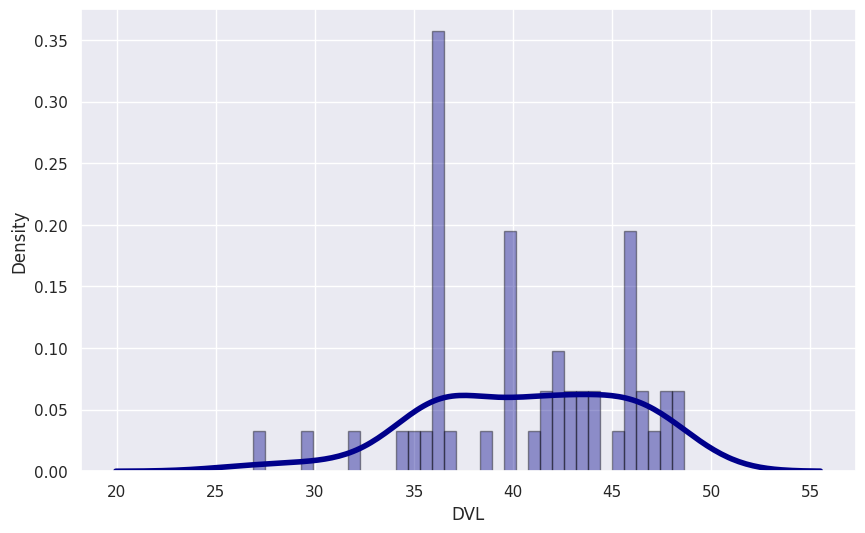

In [ ]:
sns.distplot(data_glaucoma_all['DVL'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['DVL']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.952, p-value=0.040
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['DVL']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=1.727, p-value=0.422
Принять гипотезу о нормальности




---








### РИ (рео. индекс) мОм

<ipython-input-481-c0afc8057ce5>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['РИ (рео.индекс) мОм'], hist=True, kde=True,


<Axes: xlabel='РИ (рео.индекс) мОм', ylabel='Density'>

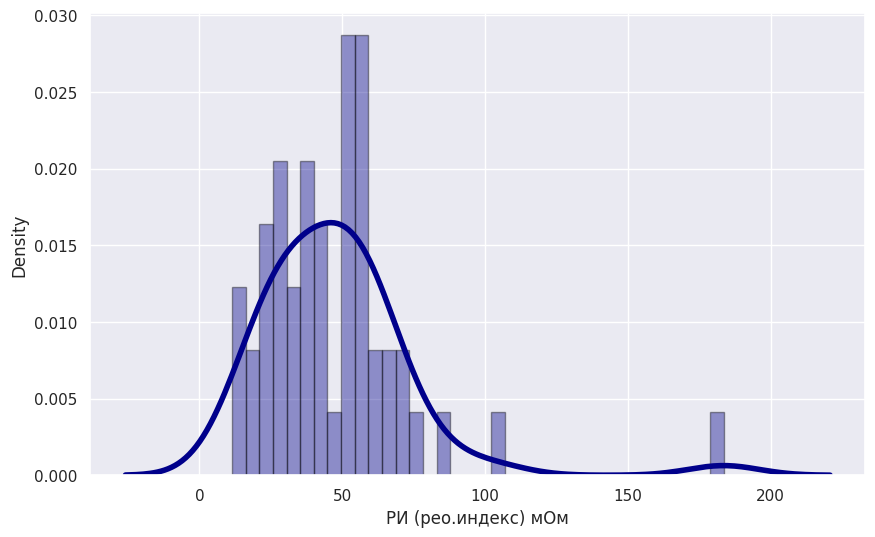

In [ ]:
sns.distplot(data_glaucoma_all['РИ (рео.индекс) мОм'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['РИ (рео.индекс) мОм']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.797, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['РИ (рео.индекс) мОм']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=50.439, p-value=0.000
Отклонить гипотезу о нормальности




---








### ПМН (макс. нап)

<ipython-input-484-939f0b639d83>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ПМН (макс.нап)'], hist=True, kde=True,


<Axes: xlabel='ПМН (макс.нап)', ylabel='Density'>

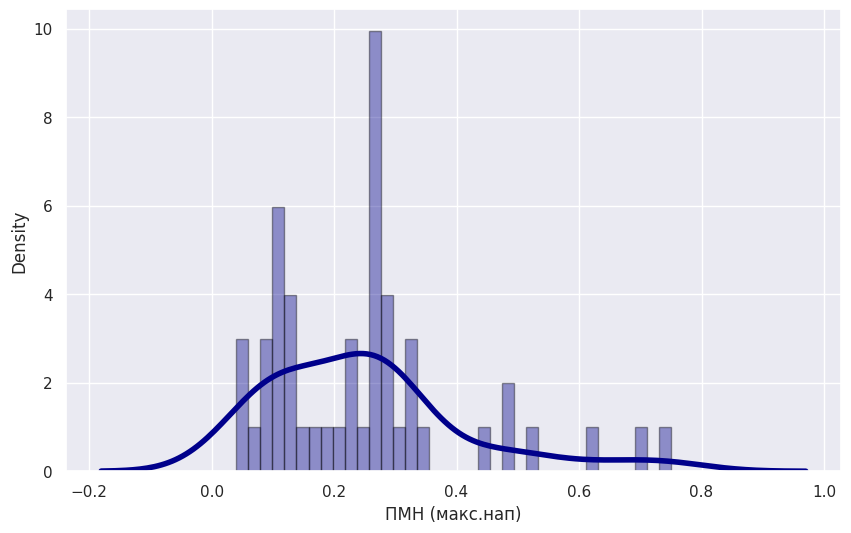

In [ ]:
sns.distplot(data_glaucoma_all['ПМН (макс.нап)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ПМН (макс.нап)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.879, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ПМН (макс.нап)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=16.421, p-value=0.000
Отклонить гипотезу о нормальности




---








### ПМУ (мод.упр.)

<ipython-input-487-f2584c8a1941>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['ПМУ (мод.упр.)'], hist=True, kde=True,


<Axes: xlabel='ПМУ (мод.упр.)', ylabel='Density'>

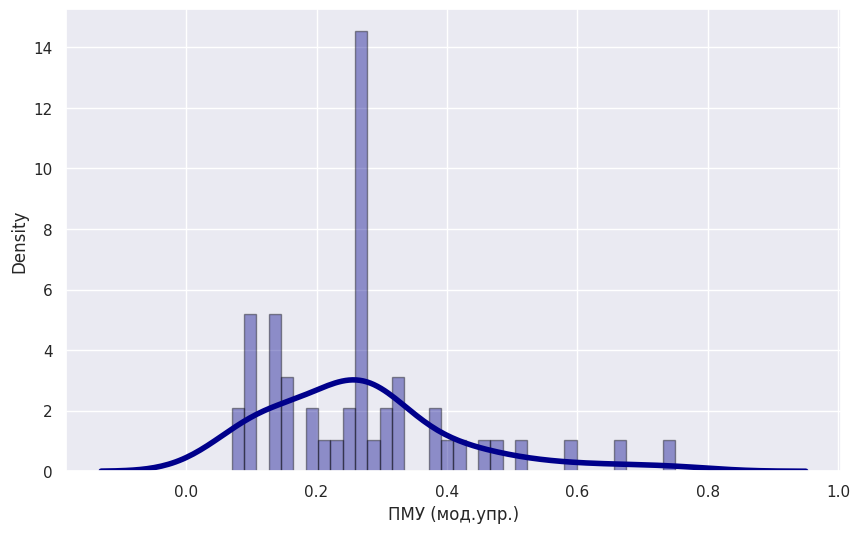

In [ ]:
sns.distplot(data_glaucoma_all['ПМУ (мод.упр.)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['ПМУ (мод.упр.)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.901, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['ПМУ (мод.упр.)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=15.139, p-value=0.001
Отклонить гипотезу о нормальности




---








### Z баз. (отн.)

<ipython-input-490-50e130b6cbf3>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Z баз.(отн.))'], hist=True, kde=True,


<Axes: xlabel='Z баз.(отн.))', ylabel='Density'>

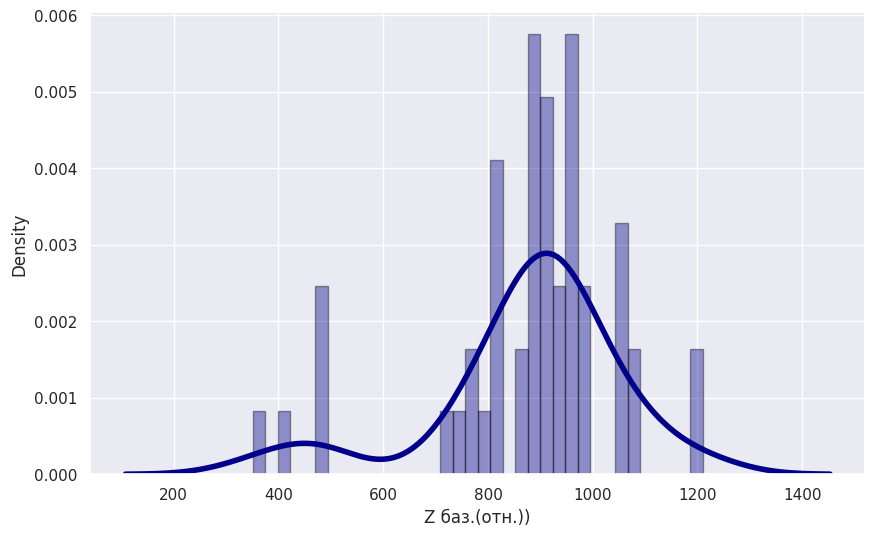

In [ ]:
sns.distplot(data_glaucoma_all['Z баз.(отн.))'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Z баз.(отн.))']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.875, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Z баз.(отн.))']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=15.538, p-value=0.000
Отклонить гипотезу о нормальности




---








### Z баз. (мОм)

<ipython-input-493-5826f2f08ecb>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['Z баз.(мОм)'], hist=True, kde=True,


<Axes: xlabel='Z баз.(мОм)', ylabel='Density'>

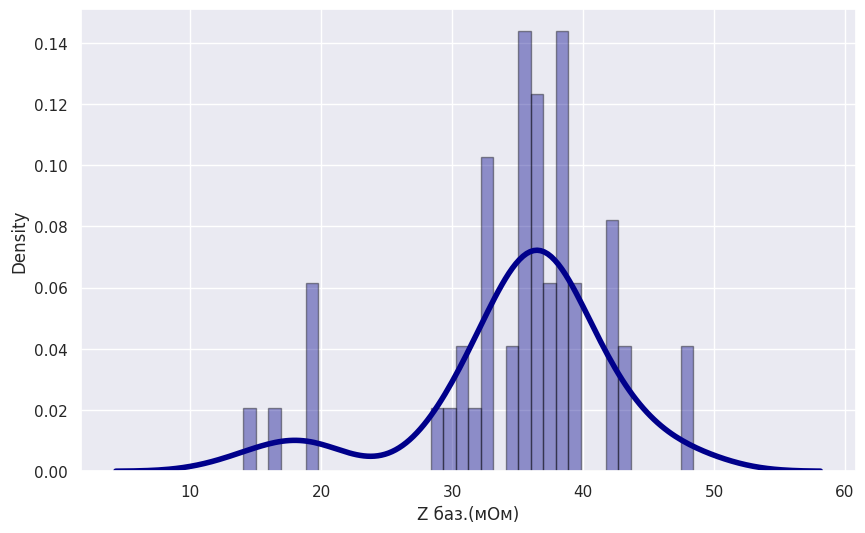

In [ ]:
sns.distplot(data_glaucoma_all['Z баз.(мОм)'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['Z баз.(мОм)']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.875, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['Z баз.(мОм)']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=15.538, p-value=0.000
Отклонить гипотезу о нормальности




---








### УОК (уд. объем) мкл

<ipython-input-496-3fc43bc8d2fe>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_glaucoma_all['УОК (уд.объем) мкл'], hist=True, kde=True,


<Axes: xlabel='УОК (уд.объем) мкл', ylabel='Density'>

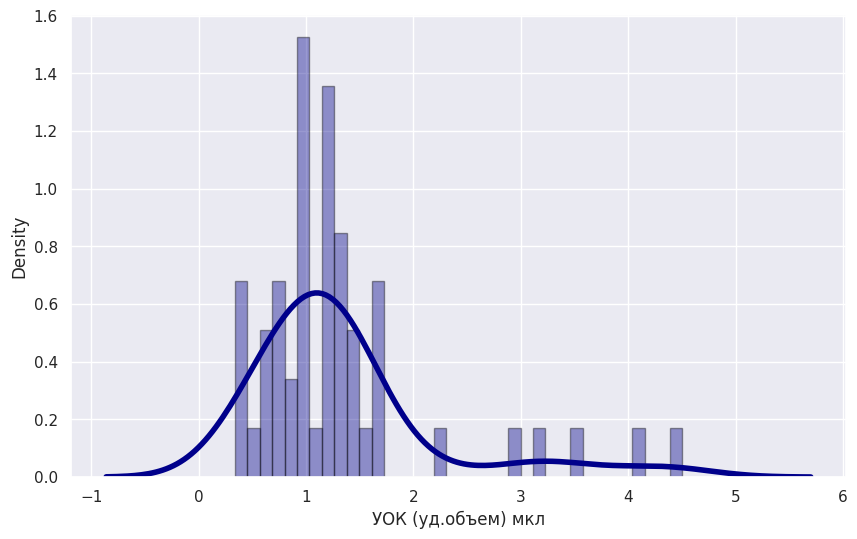

In [ ]:
sns.distplot(data_glaucoma_all['УОК (уд.объем) мкл'], hist=True, kde=True,
             bins=int(180/5), color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})

In [ ]:
stat, p = scipy.stats.shapiro(data_glaucoma_all['УОК (уд.объем) мкл']) # тест Шапиро-Уилк
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=0.764, p-value=0.000
Отклонить гипотезу о нормальности


In [ ]:
stat, p = scipy.stats.normaltest(data_glaucoma_all['УОК (уд.объем) мкл']) # Критерий согласия Пирсона
print('Statistics=%.3f, p-value=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Statistics=33.550, p-value=0.000
Отклонить гипотезу о нормальности




---








# Задача 3. Проверить наличие корреляций для объединенной группы пациентов (здоровые и все стадии ПОУГ) и для каждой группы в отдельности.

data_glaucoma_all - данные обо всех пациентах в одной таблице

In [ ]:
data_glaucoma_all

,Фамилия,возраст,стадия,величина внутриглазного давления,"ВГД, корригированного на коэффициент ригидности",Коэфф ригидности склеральн капсулы глаза,Роговично-компенсированное ВГД,ВГД по Гольдману,Фактор резистентности роговицы,КГ,...,gamma Ш,Efrid,SVL,DVL,РИ (рео.индекс) мОм,ПМН (макс.нап),ПМУ (мод.упр.),Z баз.(отн.)),Z баз.(мОм),УОК (уд.объем) мкл
0,уланкина,25,0,10,12,0.0162,9.70,9.40,9.30,11.3,...,1.75,0.0162,56.300000,46.030000,49.650,0.27,0.250,979,39.16,1.157570
1,степанова,26,0,12,15,0.0162,18.50,19.90,12.80,11.6,...,1.85,0.0162,50.960000,44.210000,51.555,0.28,0.275,948,37.92,1.252867
2,кудасов,32,0,10,12,0.0162,14.30,12.00,8.30,9.2,...,1.70,0.0138,53.580000,47.400000,102.330,0.13,0.140,1060,42.40,2.203474
3,Иванов,32,0,10,12,0.0162,17.60,13.90,7.60,7.6,...,1.70,0.0138,56.297266,45.462070,58.430,0.20,0.210,1063,42.52,1.254623
4,гладих,68,0,10,14,0.0138,20.10,17.20,8.80,7.9,...,1.75,0.0138,48.680000,45.880000,20.970,0.13,0.140,725,29.00,0.660193
5,мыздриков,59,0,12,14,0.0161,8.50,8.10,9.10,11.4,...,1.85,0.0161,53.560000,48.420000,35.500,0.52,0.420,917,36.68,0.883629
6,Савинова,66,0,15,23,0.0076,17.80,15.60,9.10,9.6,...,1.30,0.0076,48.710000,45.880000,49.880,0.29,0.300,910,36.40,1.251111
7,Иванов,66,0,12,16,0.0140,17.80,15.60,9.10,9.6,...,1.70,0.0140,52.440000,45.880000,53.230,0.32,0.330,822,32.88,1.478071
8,Мациева,68,0,18,28,0.0052,20.40,20.00,11.30,9.9,...,1.10,0.0052,51.320000,43.700000,51.555,0.28,0.275,948,37.92,1.252867
9,Булат,51,0,12,19,0.0031,17.80,16.50,10.00,9.6,...,0.60,0.0031,52.440000,45.880000,183.500,0.33,0.400,1210,48.40,3.461477


## Критерий Пирсона

Для корректного анализа удалим колонки с фамилией и со стадией

In [ ]:
#data_all_for_corr=data_glaucoma_all.drop(columns=['Фамилия', 'стадия'])

In [ ]:
#data_all_for_corr

In [ ]:
#glaucoma_all_corr = data_all_for_corr.corr()

In [ ]:
# Визуализация корреляционной матрицы
#def plot_corr_matrix(corr_matrix, title):
#    plt.figure(figsize=(15, 10))
#    sns.heatmap(corr_matrix, annot=True, fmt=".2f", annot_kws={"size": 10}, cmap="coolwarm", cbar=True)
#    plt.title(title)
#    plt.show()

In [ ]:
# Построение матриц
#plot_corr_matrix(glaucoma_all_corr, "Матрица корреляций для объединенной группы")

In [ ]:
# Отдельные группы
#groups = data_glaucoma_all['стадия'].unique()
#group_corrs = {}

In [ ]:
#for group in groups:
#    group_data = data_glaucoma_all[data_glaucoma_all['стадия'] == group].drop(columns=['Фамилия', 'стадия'])
#    group_corrs[group] = group_data.corr()


In [ ]:
#for group, corr_matrix in group_corrs.items():
#    plot_corr_matrix(corr_matrix, f"Матрица корреляций {group} стадии заболевания")


Рассчитаем разницу между корреляциями разных групп

In [ ]:
#diff = group_corrs[1] - group_corrs[0]
#plot_corr_matrix(diff, "Разница: Стадия 1 и Здоровые")

In [ ]:
#diff = group_corrs[2] - group_corrs[0]
#plot_corr_matrix(diff, "Разница: Стадия 2 и Здоровые")

In [ ]:
#diff = group_corrs[3] - group_corrs[0]
#plot_corr_matrix(diff, "Разница: Стадия 3 и Здоровые")

In [ ]:
#diff = group_corrs[2] - group_corrs[1]
#plot_corr_matrix(diff, "Разница: Стадия 1 и Стадия 2")

In [ ]:
#diff = group_corrs[3] - group_corrs[1]
#plot_corr_matrix(diff, "Разница: Стадия 1 и Стадия 3")

In [ ]:
#diff = group_corrs[3] - group_corrs[2]
#plot_corr_matrix(diff, "Разница: Стадия 2 и Стадия 3")

## Критерий Спирмена

Для корректного анализа удалим колонки с фамилией и со стадией

In [ ]:
data_all_for_corr=data_glaucoma_all.drop(columns=['Фамилия', 'стадия'])

In [ ]:
#data_all_for_corr

In [ ]:
glaucoma_all_corr = data_all_for_corr.corr(method='spearman')

In [ ]:
# Визуализация корреляционной матрицы
def plot_corr_matrix(corr_matrix, title):
    plt.figure(figsize=(15, 10))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", annot_kws={"size": 10}, cmap="coolwarm", cbar=True)
    plt.title(title)
    plt.show()

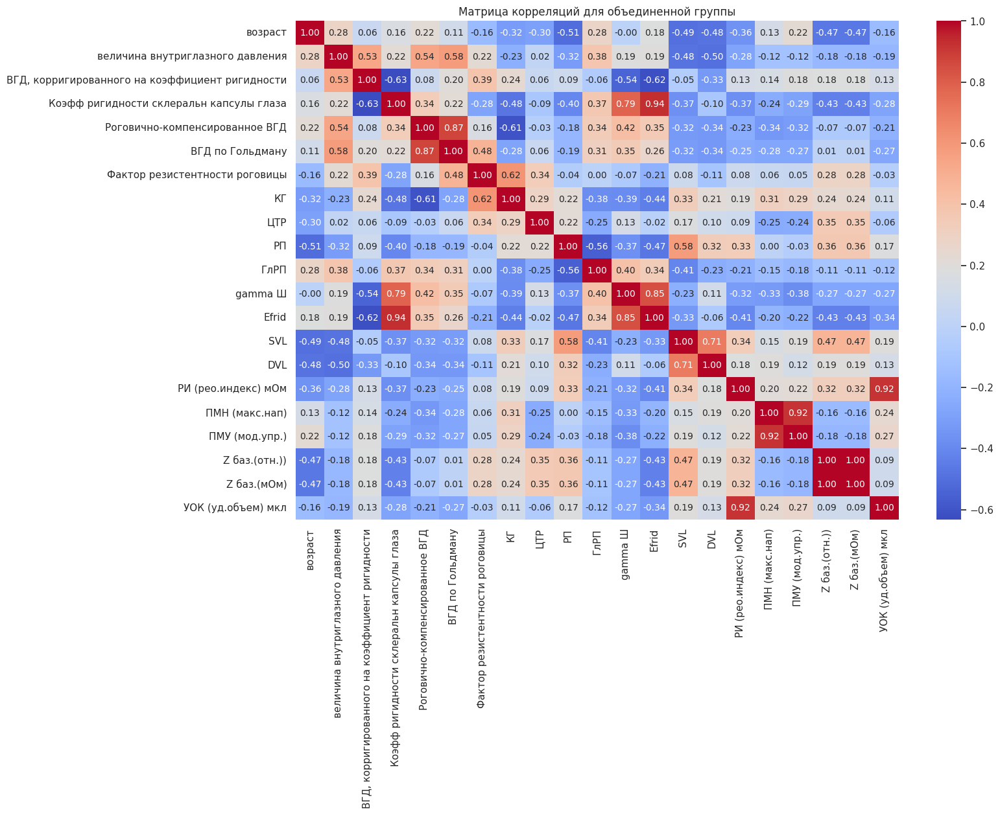

In [ ]:
# Построение матриц
plot_corr_matrix(glaucoma_all_corr, "Матрица корреляций для объединенной группы")

In [ ]:
# Отдельные группы
groups = data_glaucoma_all['стадия'].unique()
group_corrs = {}

In [ ]:
for group in groups:
    group_data = data_glaucoma_all[data_glaucoma_all['стадия'] == group].drop(columns=['Фамилия', 'стадия'])
    group_corrs[group] = group_data.corr(method='spearman')


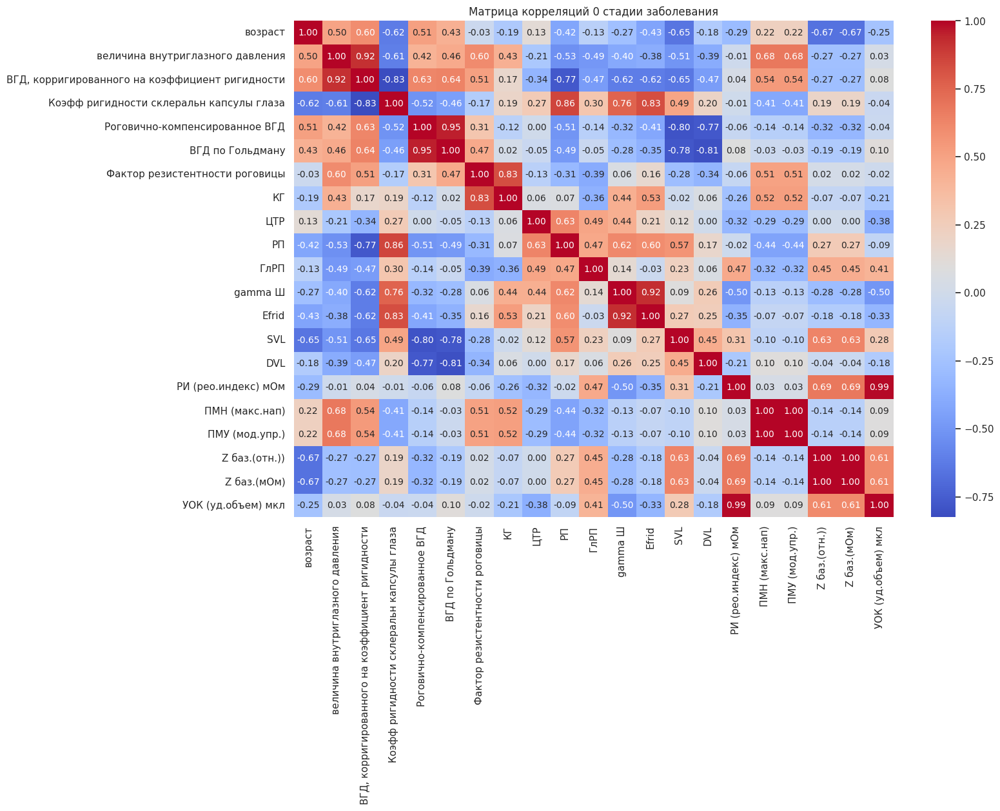

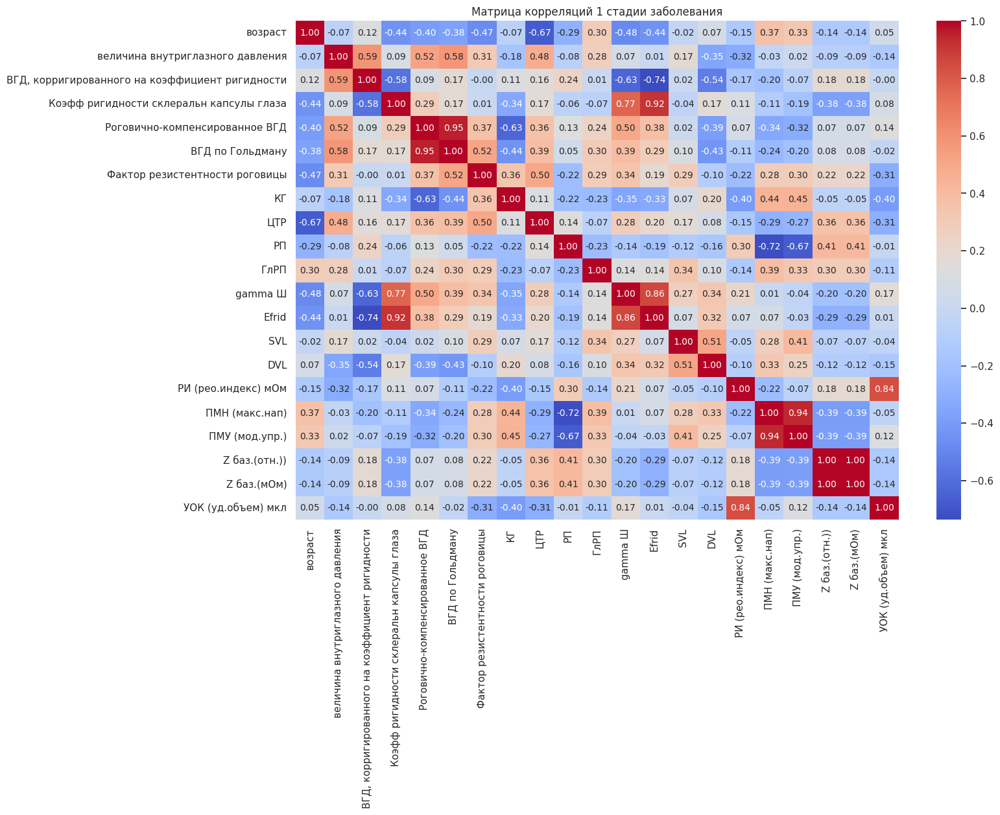

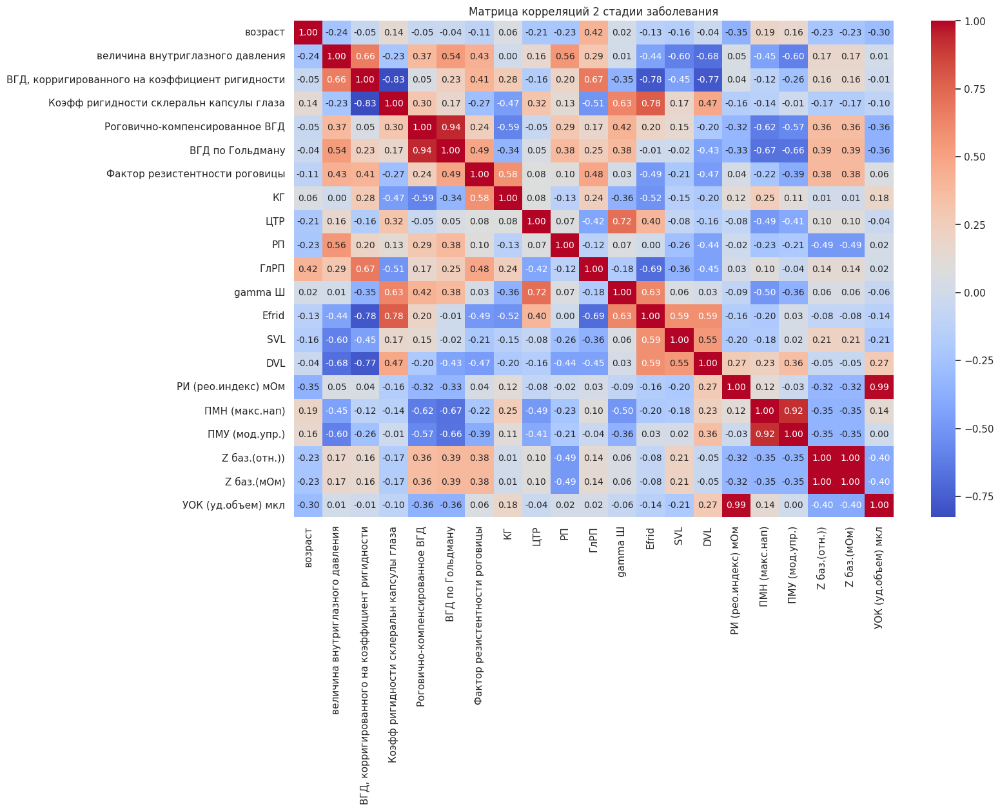

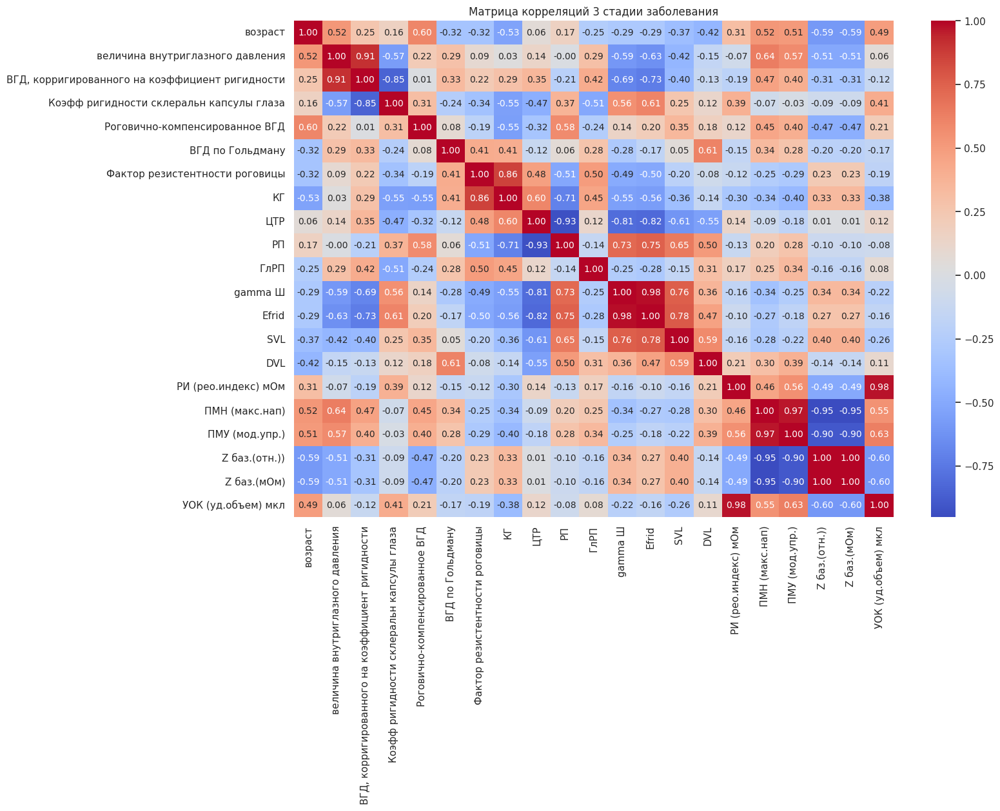

In [ ]:
for group, corr_matrix in group_corrs.items():
    plot_corr_matrix(corr_matrix, f"Матрица корреляций {group} стадии заболевания")


Рассчитаем разницу между корреляциями разных групп

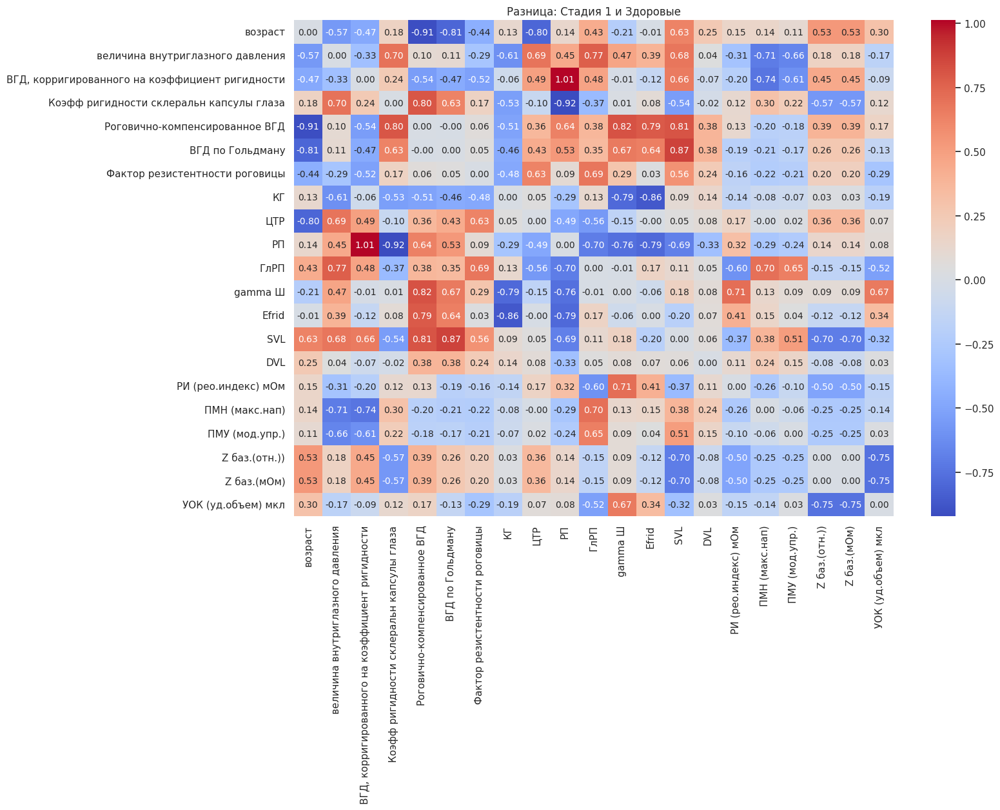

In [ ]:
diff = group_corrs[1] - group_corrs[0]
plot_corr_matrix(diff, "Разница: Стадия 1 и Здоровые")

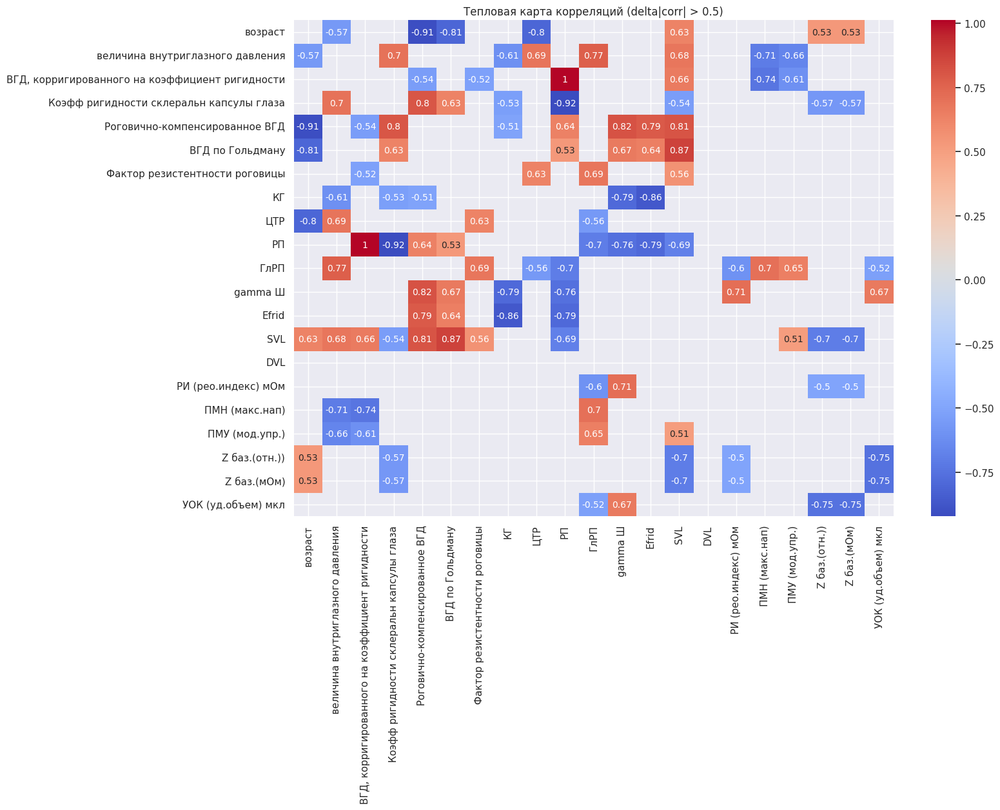

In [ ]:
filtered_diff = diff.copy()
filtered_diff[np.abs(filtered_diff) <= 0.5] = np.nan

#filtered_fiff = diff.where(diff >= 0.5)
plt.figure(figsize=(15, 10))
sns.heatmap(filtered_diff, annot=True, cmap='coolwarm',annot_kws={"size": 10}, cbar=True, mask=filtered_diff.isnull())
plt.title("Тепловая карта корреляций (delta|corr| > 0.5)")
plt.show()

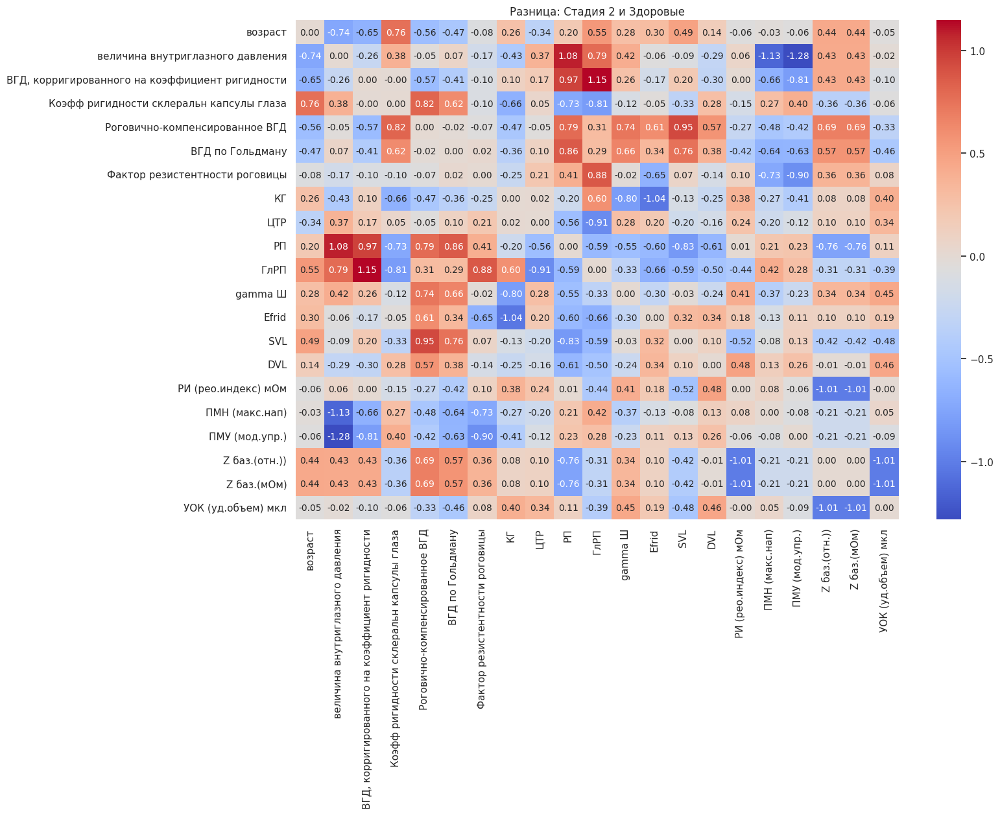

In [ ]:
diff = group_corrs[2] - group_corrs[0]
plot_corr_matrix(diff, "Разница: Стадия 2 и Здоровые")

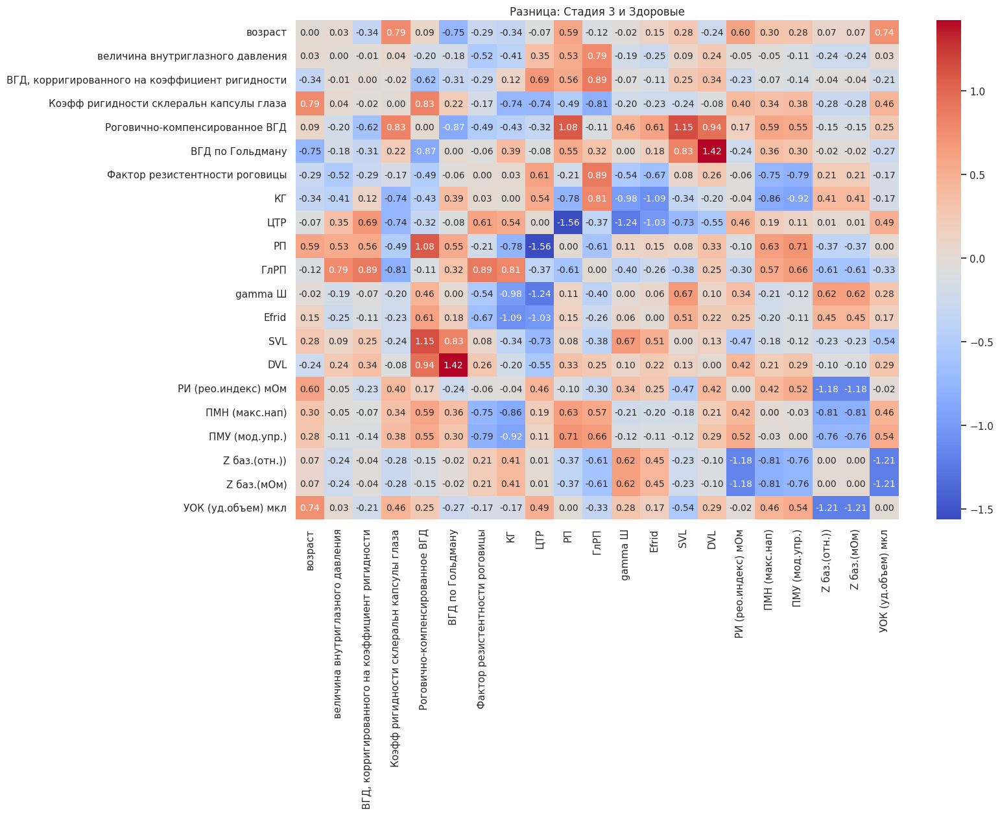

In [ ]:
diff = group_corrs[3] - group_corrs[0]
plot_corr_matrix(diff, "Разница: Стадия 3 и Здоровые")

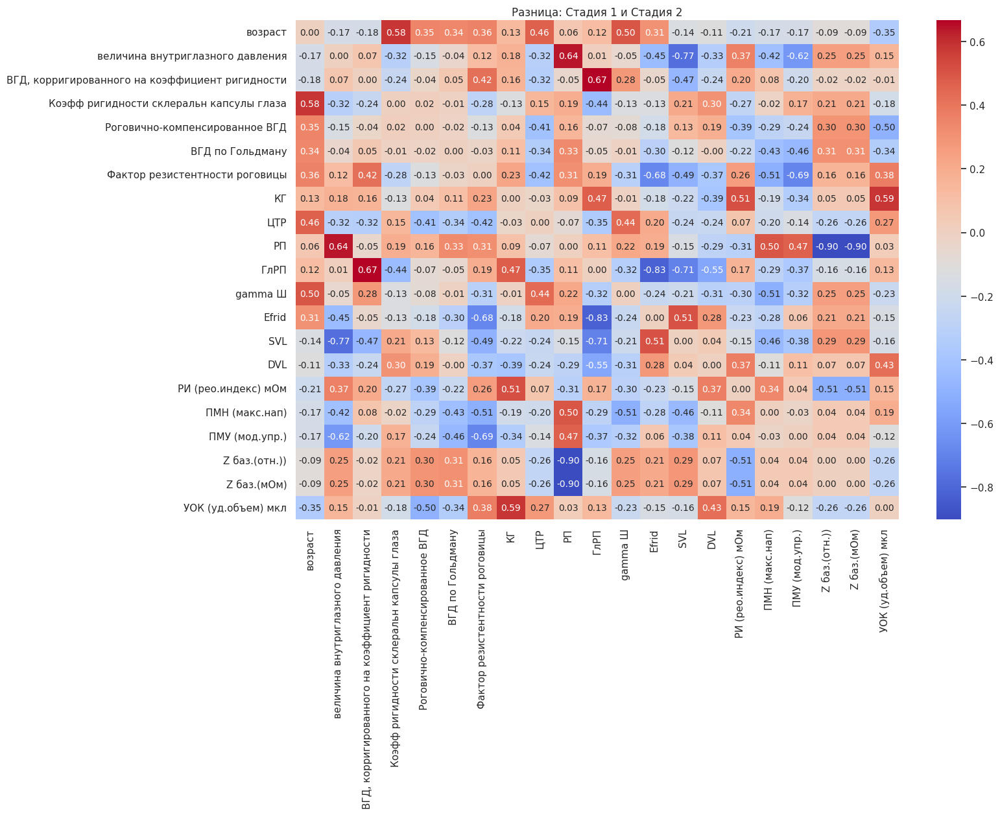

In [ ]:
diff = group_corrs[2] - group_corrs[1]
plot_corr_matrix(diff, "Разница: Стадия 1 и Стадия 2")

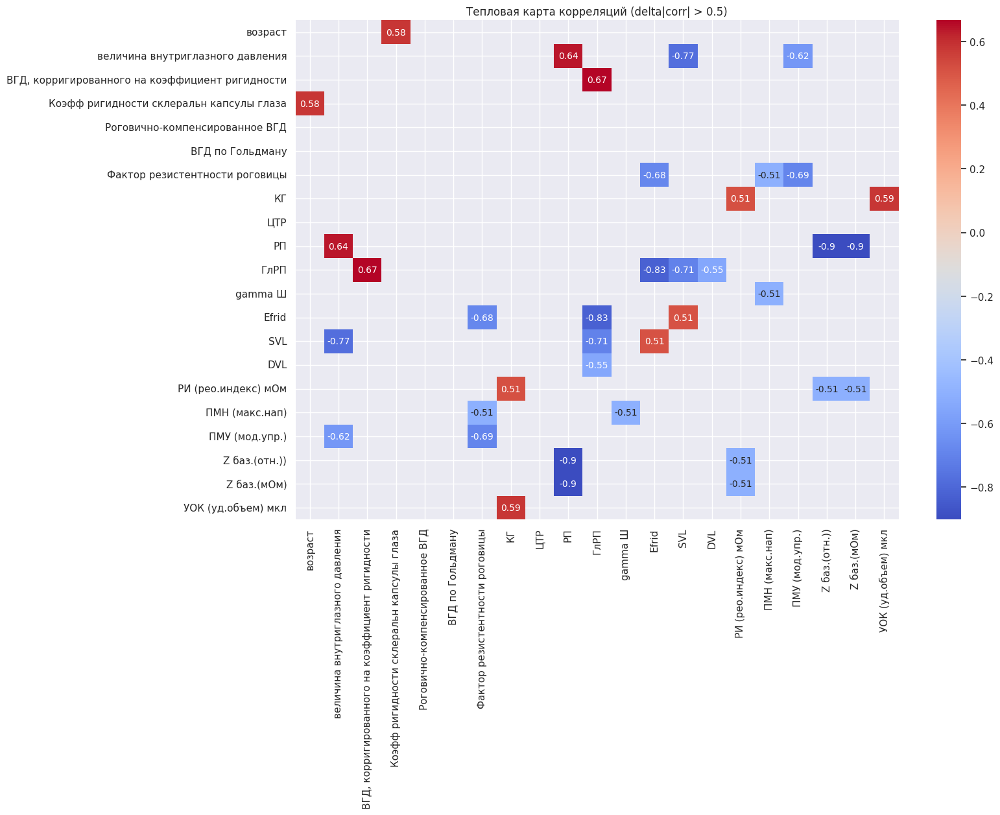

In [ ]:
filtered_diff = diff.copy()
filtered_diff[np.abs(filtered_diff) <= 0.5] = np.nan

#filtered_fiff = diff.where(diff >= 0.5)
plt.figure(figsize=(15, 10))
sns.heatmap(filtered_diff, annot=True, cmap='coolwarm',annot_kws={"size": 10}, cbar=True, mask=filtered_diff.isnull())
plt.title("Тепловая карта корреляций (delta|corr| > 0.5)")
plt.show()

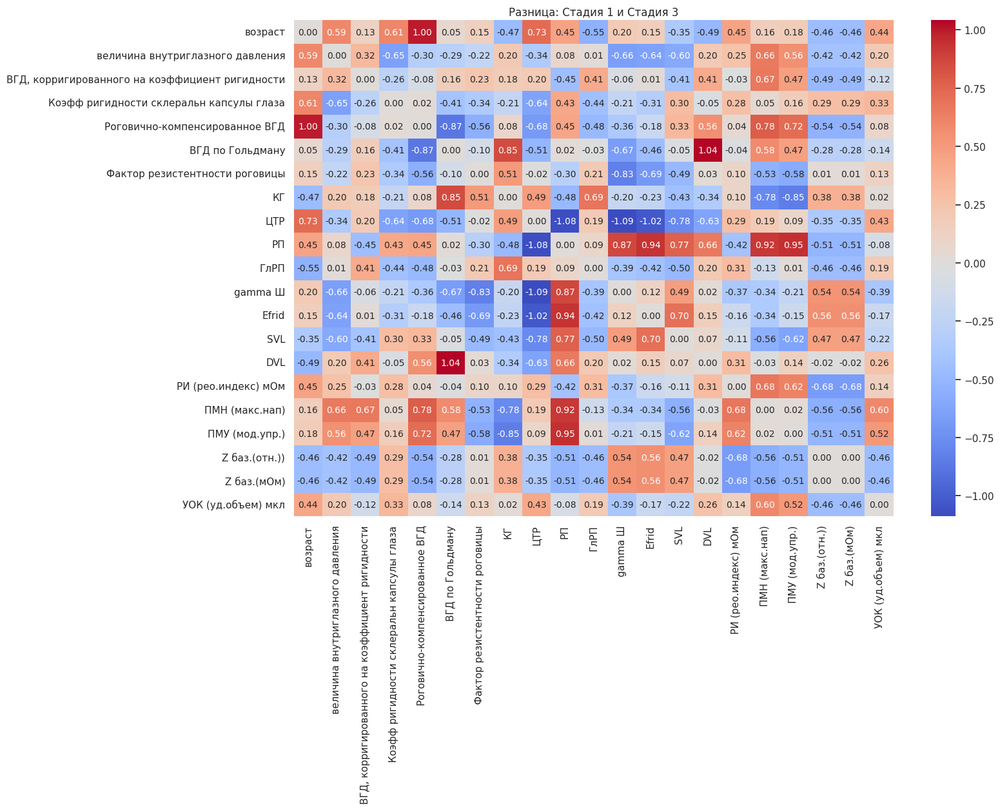

In [ ]:
diff = group_corrs[3] - group_corrs[1]
plot_corr_matrix(diff, "Разница: Стадия 1 и Стадия 3")

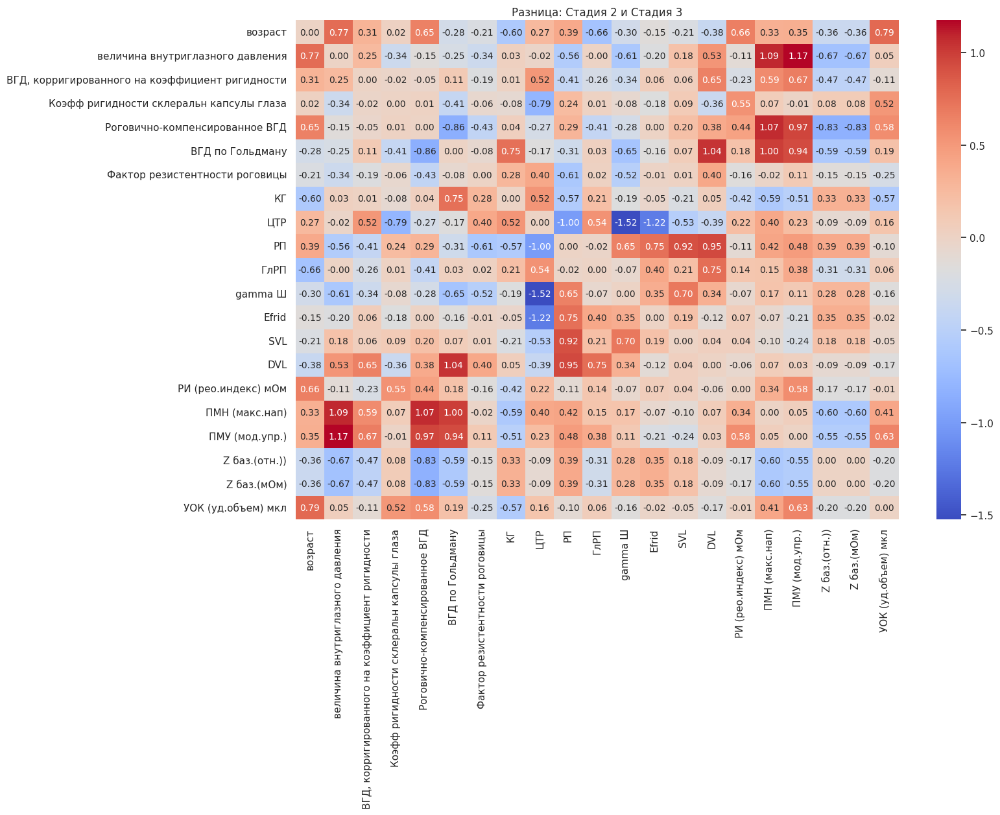

In [ ]:
diff = group_corrs[3] - group_corrs[2]
plot_corr_matrix(diff, "Разница: Стадия 2 и Стадия 3")

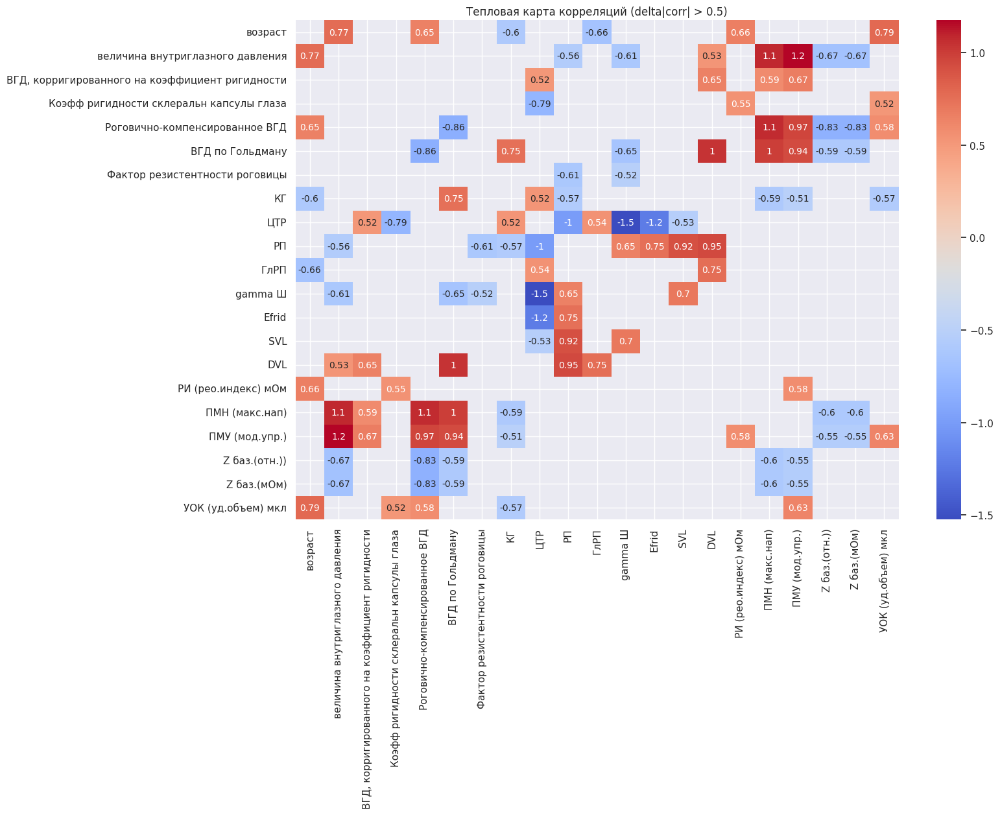

In [ ]:
filtered_diff = diff.copy()
filtered_diff[np.abs(filtered_diff) <= 0.5] = np.nan

#filtered_fiff = diff.where(diff >= 0.5)
plt.figure(figsize=(15, 10))
sns.heatmap(filtered_diff, annot=True, cmap='coolwarm',annot_kws={"size": 10}, cbar=True, mask=filtered_diff.isnull())
plt.title("Тепловая карта корреляций (delta|corr| > 0.5)")
plt.show()

## Критерий Фишера

1. Когда использовать тест Фишера
Тест Фишера используется, чтобы определить, значимо ли различаются две корреляции, вычисленные для двух независимых выборок. Он подходит для задач, где нужно проверить гипотезу:

Нулевая гипотеза (
𝐻
0​
 ): Корреляции между двумя признаками одинаковы в обеих группах.

Альтернативная гипотеза (
𝐻
𝑎
 ): Корреляции различаются.


In [ ]:
print(f"Корреляция для здоровых: {group_corrs[0].iloc[0, 1]}")
print(f"Корреляция для стадии 1: {group_corrs[1].iloc[0, 1]}")

Корреляция для здоровых: 0.4960921851232398
Корреляция для стадии 1: -0.07129975514442587


In [ ]:
# Преобразование корреляции в z-значение (по Фишеру)
def fisher_z(r):
    return 0.5 * np.log((1 + r) / (1 - r))

In [ ]:
z_healthy = fisher_z(group_corrs[0].iloc[0, 1])
z_stage_1 = fisher_z(group_corrs[1].iloc[0, 1])

In [ ]:
print(f"Z-значение для здоровых: {z_healthy}")
print(f"Z-значение для стадии 1: {z_stage_1}")

Z-значение для здоровых: 0.5441092166781584
Z-значение для стадии 1: -0.07142094613657493


In [ ]:
# Размеры выборок для каждой группы (например, 3 пациента в каждой)
n_healthy = 11
n_stage_1 = 15

# Расчет стандартной ошибки разницы между z-значениями
SE = np.sqrt(1 / (n_healthy - 3) + 1 / (n_stage_1 - 3))

# Разница между z-значениями
z_diff = (z_healthy - z_stage_1) / SE

print(f"Z-значение для разницы корреляций: {z_diff}")

Z-значение для разницы корреляций: 1.3485590199938282


Проверка значимости разницы

In [ ]:
from scipy.stats import norm

In [ ]:


# P-значение для двустороннего теста
p_value = 2 * (1 - norm.cdf(abs(z_diff)))

print(f"P-значение: {p_value}")

P-значение: 0.1774786509243076


Интерпретация результата:
Если p < 0.05: это означает, что разница между корреляциями в двух группах значима. В этом случае, можно заключить, что корреляции между признаками отличаются в группах.
Если p ≥ 0.05: это означает, что разница незначима, и можно предположить, что корреляции между признаками одинаковы в этих группах.

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# Пример данных
# Составьте DataFrame, где 'group' указывает на принадлежность к группе, а остальные столбцы - это признаки.
data = pd.DataFrame({
    'group': ['healthy', 'healthy', 'healthy', 'stage_1', 'stage_1', 'stage_1'],
    'feature_1': [1, 2, 3, 4, 5, 6],
    'feature_2': [2, 3, 4, 5, 6, 7],
    'feature_3': [5, 6, 7, 8, 9, 10]
})

# Функция для преобразования корреляции в z-значение по Фишеру
def fisher_z(r):
    return 0.5 * np.log((1 + r) / (1 - r))

# Функция для проверки значимости разницы корреляций
def test_significance(corr1, corr2, n1, n2):
    # Преобразование корреляций в z-значения
    z1 = fisher_z(corr1)
    z2 = fisher_z(corr2)
    # Расчет стандартной ошибки
    SE = np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    # Разница z-значений
    z_diff = (z1 - z2) / SE
    # p-значение для двустороннего теста
    p_value = 2 * (1 - norm.cdf(abs(z_diff)))
    return p_value

# Выделяем группы
group_healthy = data[data['group'] == 'healthy']
group_stage_1 = data[data['group'] == 'stage_1']

# Считаем размеры выборок
n_healthy = len(group_healthy)
n_stage_1 = len(group_stage_1)

# Убираем колонку 'group' и считаем корреляции
features = data.columns.drop('group')
corr_healthy = group_healthy[features].corr()
corr_stage_1 = group_stage_1[features].corr()

# Словарь для хранения результатов
results = []

# Перебираем все пары признаков
for feature_a in features:
    for feature_b in features:
        if feature_a != feature_b:
            # Получаем корреляции для каждой группы
            r1 = corr_healthy.loc[feature_a, feature_b]
            r2 = corr_stage_1.loc[feature_a, feature_b]

            # Проверяем значимость разницы корреляций
            p_value = test_significance(r1, r2, n_healthy, n_stage_1)

            # Интерпретируем результат
            significance = "значима" if p_value < 0.05 else "не значима"
            results.append(f"Между '{feature_a}' и '{feature_b}' корреляция между группами {significance} (p = {p_value:.3f})")

# Выводим результаты
for result in results:
    print(result)


<ipython-input-545-ff9938805e00>:16: RuntimeWarning: divide by zero encountered in scalar divide
  return 0.5 * np.log((1 + r) / (1 - r))


ZeroDivisionError: division by zero

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# Примерные данные
data = pd.DataFrame({
    'group': ['healthy', 'healthy', 'healthy', 'stage_1', 'stage_1', 'stage_1'],
    'feature_1': [1, 2, 3, 4, 5, 6],
    'feature_2': [2, 3, 4, 5, 6, 7],
    'feature_3': [5, 6, 7, 8, 9, 10]
})

# Функция для преобразования корреляции в z-значение по Фишеру
def fisher_z(r):
    return 0.5 * np.log((1 + r) / (1 - r))

# Функция для проверки значимости разницы корреляций
def test_significance(corr1, corr2, n1, n2):
    # Преобразование корреляций в z-значения
    z1 = fisher_z(corr1)
    z2 = fisher_z(corr2)
    # Расчет стандартной ошибки
    SE = np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    # Разница z-значений
    z_diff = (z1 - z2) / SE
    # p-значение для двустороннего теста
    p_value = 2 * (1 - norm.cdf(abs(z_diff)))
    return p_value

# Разделяем группы
group_healthy = data[data['group'] == 'healthy']
group_stage_1 = data[data['group'] == 'stage_1']

# Считаем размеры выборок
n_healthy = len(group_healthy)
n_stage_1 = len(group_stage_1)

# Убираем колонку 'group' и считаем корреляции
features = data.columns.drop('group')
corr_healthy = group_healthy[features].corr()
corr_stage_1 = group_stage_1[features].corr()

# Словарь для хранения результатов
results = []

# Перебираем все пары признаков
for feature_a in features:
    for feature_b in features:
        if feature_a != feature_b:
            # Получаем корреляции для каждой группы
            r1 = corr_healthy.loc[feature_a, feature_b]
            r2 = corr_stage_1.loc[feature_a, feature_b]

            # Проверяем значимость разницы корреляций
            p_value = test_significance(r1, r2, n_healthy, n_stage_1)

            # Интерпретируем результат
            significance = "значима" if p_value < 0.05 else "не значима"
            results.append(f"Между '{feature_a}' и '{feature_b}' корреляция между группами {significance} (p = {p_value:.3f})")

# Выводим результаты
for result in results:
    print(result)


<ipython-input-546-5bb7f42b37ae>:15: RuntimeWarning: divide by zero encountered in scalar divide
  return 0.5 * np.log((1 + r) / (1 - r))


ZeroDivisionError: division by zero

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# Примерные данные
data = pd.DataFrame({
    'group': ['healthy', 'healthy', 'healthy','healthy', 'stage_1', 'stage_1', 'stage_1', 'stage_1'],
    'feature_1': [1, 2, 3, 4, 5, 6, 1, 3],
    'feature_2': [2, 3, 4, 5, 6, 7, 1, 3],
    'feature_3': [1, 5, 4, 6, 8, 1, 4, 5],
    'feature_4': [5, 6, 7, 8, 9, 10, 6, 7]
})

# Функция для преобразования корреляции в z-значение по Фишеру
def fisher_z(r):
    return 0.5 * np.log((1 + r) / (1 - r))

# Функция для проверки значимости разницы корреляций
def test_significance(corr1, corr2, n1, n2):
    if n1 <= 3 or n2 <= 3:
        return None  # Невозможно рассчитать значимость из-за малых выборок
    # Преобразование корреляций в z-значения
    z1 = fisher_z(corr1)
    z2 = fisher_z(corr2)
    # Расчет стандартной ошибки
    SE = np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    # Разница z-значений
    z_diff = (z1 - z2) / SE
    # p-значение для двустороннего теста
    p_value = 2 * (1 - norm.cdf(abs(z_diff)))
    return p_value

# Разделяем группы
group_healthy = data[data['group'] == 'healthy']
group_stage_1 = data[data['group'] == 'stage_1']

# Считаем размеры выборок
n_healthy = len(group_healthy)
n_stage_1 = len(group_stage_1)

# Убираем колонку 'group' и считаем корреляции
features = data.columns.drop('group')
corr_healthy = group_healthy[features].corr()
corr_stage_1 = group_stage_1[features].corr()

# Словарь для хранения результатов
results = []

# Перебираем все пары признаков
for feature_a in features:
    for feature_b in features:
        if feature_a != feature_b:
            # Получаем корреляции для каждой группы
            r1 = corr_healthy.loc[feature_a, feature_b]
            r2 = corr_stage_1.loc[feature_a, feature_b]

            # Проверяем значимость разницы корреляций
            p_value = test_significance(r1, r2, n_healthy, n_stage_1)

            if p_value is None:
                results.append(f"Между '{feature_a}' и '{feature_b}' недостаточно данных для анализа.")
            else:
                # Интерпретируем результат
                significance = "значима" if p_value < 0.05 else "не значима"
                results.append(f"Между '{feature_a}' и '{feature_b}' корреляция между группами {significance} (p = {p_value:.3f})")

# Выводим результаты
for result in results:
    print(result)


Между 'feature_1' и 'feature_2' корреляция между группами значима (p = 0.000)
Между 'feature_1' и 'feature_3' корреляция между группами не значима (p = 0.343)
Между 'feature_1' и 'feature_4' корреляция между группами значима (p = 0.000)
Между 'feature_2' и 'feature_1' корреляция между группами значима (p = 0.000)
Между 'feature_2' и 'feature_3' корреляция между группами не значима (p = 0.352)
Между 'feature_2' и 'feature_4' корреляция между группами значима (p = 0.000)
Между 'feature_3' и 'feature_1' корреляция между группами не значима (p = 0.343)
Между 'feature_3' и 'feature_2' корреляция между группами не значима (p = 0.352)
Между 'feature_3' и 'feature_4' корреляция между группами не значима (p = 0.322)
Между 'feature_4' и 'feature_1' корреляция между группами значима (p = 0.000)
Между 'feature_4' и 'feature_2' корреляция между группами значима (p = 0.000)
Между 'feature_4' и 'feature_3' корреляция между группами не значима (p = 0.322)


<ipython-input-553-3ae0696ba441>:16: RuntimeWarning: divide by zero encountered in scalar divide
  return 0.5 * np.log((1 + r) / (1 - r))
